# Phase 3 - Modeling

**Note 1: the following starting code only generates a single random train/test split when default_seed is used. You need to modify the code to generate 100 independent train/test splits with different seeds and report the average results on those independent splits along with standard deviation.**

**Note 2: You are completely free to use your own implementation.**

In [89]:
## This is the Jupyter Notebook that contains all code necessary to run the classification.

In [14]:
# Load general utilities
# ----------------------
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.axes as ax
import datetime
import numpy as np
import pickle
import time
import seaborn as sns

# Load sklearn utilities
# ----------------------
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.model_selection import GridSearchCV
from imblearn.over_sampling import SMOTE

from sklearn.metrics import accuracy_score, classification_report, roc_auc_score, roc_curve, brier_score_loss, mean_squared_error, r2_score

from sklearn.calibration import calibration_curve

# Load classifiers
# ----------------
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import RidgeClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.dummy import DummyClassifier

# Other Packages
# --------------
from scipy.stats import kendalltau
from sklearn.neural_network import MLPRegressor
from sklearn import linear_model
from sklearn.ensemble import RandomForestRegressor
from sklearn.cluster import KMeans
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
from scipy.interpolate import spline

# Load debugger, if required
#import pixiedust
pd.options.mode.chained_assignment = None #'warn'

# suppress all warnings
import warnings
warnings.filterwarnings("ignore")

In [15]:
# Define a function that, given a CVGridSearch object, finds the
# percentage difference between the best and worst scores

def find_score_variation(cv_model):
    all_scores = cv_model.cv_results_['mean_test_score']
    return( np.abs((max(all_scores) - min(all_scores))) * 100 / max(all_scores) )

    '''
    which_min_score = np.argmin(all_scores)
    
    all_perc_diff = []
    
    try:
        all_perc_diff.append( np.abs(all_scores[which_min_score - 1] - all_scores[which_min_score])*100 / min(all_scores) )
    except:
        pass
    
    try:
        all_perc_diff.append( np.abs(all_scores[which_min_score + 1] - all_scores[which_min_score])*100 / min(all_scores) )
    except:
        pass
    
    return ( np.mean(all_perc_diff) )
    '''

# Define a function that checks, given a CVGridSearch object,
# whether the optimal parameters lie on the edge of the search
# grid
def find_opt_params_on_edge(cv_model):
    out = False
    
    for i in cv_model.param_grid:
        if cv_model.best_params_[i] in [ cv_model.param_grid[i][0], cv_model.param_grid[i][-1] ]:
            out = True
            break
            
    return out

## Define a default random seed and an output file

In [16]:
default_seed = 1
output_file = "output_sample"

In [17]:
# Create a function to print a line to our output file

def dump_to_output(key, value):
    with open(output_file, "a") as f:
        f.write(",".join([str(default_seed), key, str(value)]) + "\n")

## Load the data and engineer the features

In [18]:
# Read the data and features from the pickle file saved in CS-Phase 2
data, discrete_features, continuous_features, ret_cols = pickle.load( open( "dataclean_data.pickle", "rb" ) )

In [19]:
## Create the outcome columns: True if loan_status is either Charged Off or Default, False otherwise

loan_stats= data['loan_status']
outcome_values = []
for value in loan_stats:
    if value == 'Charged Off' or value == 'Default':
        outcome_values.append(True)
    else:
        outcome_values.append(False)
data["outcome"] = outcome_values

mask = np.array(loan_stats == 'Charged Off')
mask_2 = np.array(loan_stats == 'Default')

outcome_array = np.array(outcome_values)
mask = np.array(outcome_array == True)

In [20]:
# Create a feature for the length of a person's credit history at the time the loan is issued
data['cr_hist'] = (data.issue_d - data.earliest_cr_line) / np.timedelta64(1, 'M')
continuous_features.append('cr_hist')

In [21]:
# Randomly assign each row to a training and test set. 
#We do this now because we will be fitting a variety of models on various time periods,
#and we would like every period to use the *same* training/test split
np.random.seed(default_seed)
## create the train columns where the value is True if it is a train instance
#and False otherwise. Hint: use np.random.choice with 70% for training and 30% for testing

train_array = np.array([True, False])
train = np.random.choice(train_array, data.shape[0], p=[0.7, 0.3])
data['train'] = train

In [22]:
# Create a matrix of features and outcomes, with dummies. Record the names of the dummies for later use
X_continuous = data[continuous_features].values

X_discrete = pd.get_dummies(data[discrete_features], dummy_na = True, prefix_sep = "::", drop_first = True)
discrete_features_dummies = X_discrete.columns.tolist()
X_discrete = X_discrete.values

X = np.concatenate( (X_continuous, X_discrete), axis = 1 )

y = data.outcome.values

train = data.train.values

## Prepare functions to fit and evaluate models

In [23]:
def prepare_data(data_subset = np.array([True]*len(data)),
                    n_samples_train = 30000,
                    n_samples_test = 20000,
                    feature_subset = None,
                    date_range_train = (data.issue_d.min(), data.issue_d.max()),
                    date_range_test = (data.issue_d.min(), data.issue_d.max()),
                    random_state = default_seed):
    '''
    This function will prepare the data for classification or regression.
    It expects the following parameters:
      - data_subset: a numpy array with as many entries as rows in the
                     dataset. Each entry should be True if that row
                     should be used, or False if it should be ignored
      - n_samples_train: the total number of samples to be used for training.
                         Will trigger an error if this number is larger than
                         the number of rows available after all filters have
                         been applied
      - n_samples_test: as above for testing
      - feature_subect: A list containing the names of the features to be
                        used in the model. In None, all features in X are
                        used
      - date_range_train: a tuple containing two dates. All rows with loans
                          issued outside of these two dates will be ignored in
                          training
      - date_range_test: as above for testing
      - random_state: the random seed to use when selecting a subset of rows
      
    Note that this function assumes the data has a "Train" column, and will
    select all training rows from the rows with "True" in that column, and all
    the testing rows from those with a "False" in that column.
    
    This function returns a dictionary with the following entries
      - X_train: the matrix of training data
      - y_train: the array of training labels
      - train_set: a Boolean vector with as many entries as rows in the data
                  that denotes the rows that were used in the train set
      - X_test: the matrix of testing data
      - y_test: the array of testing labels
      - test_set: a Boolean vector with as many entries as rows in the data
                  that denotes the rows that were used in the test set
    '''
    
    np.random.seed(random_state)
        
    # Filter down the data to the required date range, and downsample
    # as required
    filter_train = ( train & (data.issue_d >= date_range_train[0]) &
                            (data.issue_d <= date_range_train[1]) & data_subset ).values
    #print('FILTER TRAIN BEFORE', filter_train, len(filter_train))
    filter_test = ( (train == False) & (data.issue_d >= date_range_test[0])
                            & (data.issue_d <= date_range_test[1]) & data_subset ).values
    
    filter_train[ np.random.choice( np.where(filter_train)[0], size = filter_train.sum()
                                                   - n_samples_train, replace = False ) ] = False
    filter_test[ np.random.choice( np.where(filter_test)[0], size = filter_test.sum()
                                                  - n_samples_test, replace = False ) ] = False
    #print('AFTER: ', filter_train)
    #print(len(filter_train))
    # Prepare the training and test set
    X_train = X[ filter_train , :]
    X_test = X[ filter_test, :]
    #print('after filtering: ', len(X_train), len(X_test))
    if feature_subset != None:
        cols = [i for i, j in enumerate(continuous_features + discrete_features_dummies)
                                                     if j.split("::")[0] in feature_subset]
        X_train = X_train[ : , cols ]
        X_test = X_test[ : , cols ]
        
    y_train = y[ filter_train ]
    y_test = y[ filter_test ]
    
    # Scale the variables
    scaler = preprocessing.MinMaxScaler()

    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    #print(len(X_train), len(X_test))
    # return training and testing data
    out = {'X_train':X_train, 'y_train':y_train, 'train_set':filter_train, 
           'X_test':X_test, 'y_test':y_test, 'test_set':filter_test}
    
    return out

In [24]:
def fit_classification(model, data_dict,
                          cv_parameters = {},
                          model_name = None,
                          random_state = default_seed,
                          output_to_file = True,
                          print_to_screen = True):
    '''
    This function will fit a classification model to data and print various evaluation
    measures. It expects the following parameters
      - model: an sklearn model object
      - data_dict: the dictionary containing both training and testing data;
                   returned by the prepare_data function
      - cv_parameters: a dictionary of parameters that should be optimized
                       over using cross-validation. Specifically, each named
                       entry in the dictionary should correspond to a parameter,
                       and each element should be a list containing the values
                       to optimize over
      - model_name: the name of the model being fit, for printouts
      - random_state: the random seed to use
      - output_to_file: if the results will be saved to the output file
      - print_to_screen: if the results will be printed on screen
    
    If the model provided does not have a predict_proba function, we will
    simply print accuracy diagnostics and return.
    
    If the model provided does have a predict_proba function, we first
    figure out the optimal threshold that maximizes the accuracy and
    print out accuracy diagnostics. We then print an ROC curve, sensitivity/
    specificity curve, and calibration curve.
    
    This function returns a dictionary with the following entries
      - model: the best fitted model
      - y_pred: predictions for the test set
      - y_pred_probs: probability predictions for the test set, if the model
                      supports them
      - y_pred_score: prediction scores for the test set, if the model does not 
                      output probabilities.
    '''
        
    np.random.seed(random_state)
    
    # --------------------------
    #   Step 1 - Load the data
    # --------------------------
    X_train = data_dict['X_train']
    y_train = data_dict['y_train']
    
    #print('before SMOTE: ', len(X_train), len(y_train))
    X_test = data_dict['X_test']
    y_test = data_dict['y_test']
    
    filter_train = data_dict['train_set']    

    # --------------------------
    #   Step 2 - Fit the model
    # --------------------------
    
    cv_model = GridSearchCV(model, cv_parameters)
    
    start_time = time.time()
    cv_model.fit(X_train, y_train)
    end_time = time.time()
    
    best_model = cv_model.best_estimator_
    
    if print_to_screen:

        if model_name != None:
            print("=========================================================")
            print("  Model: " + model_name)
            print("=========================================================")

        print("Fit time: " + str(round(end_time - start_time, 2)) + " seconds")
        print("Optimal parameters:")
        print(cv_model.best_params_)
        print("")
    
    # -------------------------------
    #   Step 3 - Evaluate the model
    # -------------------------------
    
    # If possible, make probability predictions
    try:
        y_pred_probs = best_model.predict_proba(X_test)[:,1]
        fpr, tpr, thresholds = roc_curve(y_test, y_pred_probs)
        
        probs_predicted = True
    except:
        probs_predicted = False
    
   # print('is this probs_predicted (can it use predict_proba)', probs_predicted)
    # Make predictions; if we were able to find probabilities, use
    # the threshold that maximizes the accuracy in the training set.
    # If not, just use the learner's predict function
    if probs_predicted:
       # print(len(X_train))
        y_train_pred_probs = best_model.predict_proba(X_train)[:,1]
        fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_train_pred_probs)
        #print('Y_TRAIN PRED PROBS', len(y_train_pred_probs))
        true_pos_train = tpr_train*(y_train.sum())
        true_neg_train = (1 - fpr_train) *(1-y_train).sum()
        
        #Add
        best_threshold = 0.5
        
        if print_to_screen:
            print("Chosen threshold was: " + str(best_threshold))
        
        y_pred = (y_pred_probs > best_threshold)
    else:
        y_pred = best_model.predict(X_test)
    #We created these to compute averages later.
    accuracy = accuracy_score(y_test, y_pred)
    other_scores = classification_report(y_test, y_pred, target_names =['No default', 'Default'], digits = 4, output_dict=True)
    if print_to_screen:
        print("Accuracy: ", accuracy)
        print(classification_report(y_test, y_pred, target_names =['No default', 'Default'], digits = 4))

    if print_to_screen:
        if probs_predicted:        
            plt.figure(figsize = (13, 4.5))
            plt.subplot(2, 2, 1)

            plt.title("ROC Curve (AUC = %0.2f)"% roc_auc_score(y_test, y_pred_probs))
            plt.plot(fpr, tpr, 'b')
            plt.plot([0,1],[0,1],'r--')
            plt.xlim([0,1]); plt.ylim([0,1])
            plt.ylabel('True Positive Rate')
            plt.xlabel('False Positive Rate')

            plt.subplot(2, 2, 3)

            plt.plot(thresholds, tpr, 'b', label = 'Sensitivity')
            plt.plot(thresholds, 1 -fpr, 'r', label = 'Specificity')
            plt.legend(loc = 'lower right')
            plt.xlim([0,1]); plt.ylim([0,1])
            plt.xlabel('Threshold')

            plt.subplot(2, 2, 2)

            fp_0, mpv_0 = calibration_curve(y_test, y_pred_probs, n_bins = 10)
            plt.plot([0,1], [0,1], 'k:', label='Perfectly calibrated')
            plt.plot(mpv_0, fp_0, 's-')
            plt.ylabel('Fraction of Positives')
            plt.xlim([0,1]); plt.ylim([0,1])
            plt.legend(loc ='upper left')
            
            plt.subplot(2, 2, 4)
            plt.hist(y_pred_probs, range=(0, 1), bins=10, histtype="step", lw=2)
            plt.xlim([0,1]); plt.ylim([0,20000])
            plt.xlabel('Mean Predicted Probability')
            plt.ylabel('Count')
            
            #plt.tight_layout()
            plt.show()
        
    # Additional Score Check
    if probs_predicted:
        y_train_score = y_train_pred_probs
    else:
        y_train_score = best_model.decision_function(X_train)
   
   # print(len(y_train_score), len(data.grade[filter_train]))
    tau, p_value = kendalltau(y_train_score, data.grade[filter_train])
    if print_to_screen:
        print("")
        print("Similarity to LC grade ranking: ", tau)
    
    if probs_predicted:
        brier_score = brier_score_loss(y_test, y_pred_probs)
        if print_to_screen:
            print("Brier score:", brier_score)
    
    # Return the model predictions, and the
    # test set
    # -------------------------------------
    out = {'model':best_model, 'y_pred_labels':y_pred}
    
    if probs_predicted:
        out.update({'y_pred_probs':y_pred_probs})
    else:
        y_pred_score = best_model.decision_function(X_test)
        out.update({'y_pred_score':y_pred_score})
        
    # Output results to file
    # ----------------------
    if probs_predicted and output_to_file:
        # Check whether any of the CV parameters are on the edge of
        # the search space
        opt_params_on_edge = find_opt_params_on_edge(cv_model)
        dump_to_output(model_name + "::search_on_edge", opt_params_on_edge)
        if print_to_screen:
            print("Were parameters on edge? : " + str(opt_params_on_edge))
        
        # Find out how different the scores are for the different values
        # tested for by cross-validation. If they're not too different, then
        # even if the parameters are off the edge of the search grid, we should
        # be ok
        score_variation = find_score_variation(cv_model)
        dump_to_output(model_name + "::score_variation", score_variation)
        if print_to_screen:
            print("Score variations around CV search grid : " + str(score_variation))
        
        # Print out all the scores
        dump_to_output(model_name + "::all_cv_scores", str(cv_model.cv_results_['mean_test_score']))
        if print_to_screen:
            print( str(cv_model.cv_results_['mean_test_score']) )
        
        # Dump the AUC to file
        dump_to_output(model_name + "::roc_auc", roc_auc_score(y_test, y_pred_probs) )
        
    return out, accuracy, other_scores

## Train and Test different machine learning classification models

The machine learning models listed in the following are just our suggestions. You are free to try any other models that you would like to experiment with.

In [25]:
## define your set of features to use in different models
continuous_features.remove('funded_amnt')
discrete_features_dummies=[val for val in discrete_features_dummies 
                           if val not in ['purpose::nan','verification_status::nan','grade::nan', 'term::nan', 'home_ownership::nan', 'emp_length::nan']]
your_features = discrete_features_dummies+continuous_features

# regression_features=data_dummies.columns+continuous_features+ret_cols
# prepare the train, test data for training models
data_dictionaries = []
for i in range(100):
    data_dict = prepare_data(feature_subset = your_features, random_state=i)
    data_dictionaries.append(data_dict)
    
all_features = pd.Series(continuous_features + discrete_features_dummies)
idx = [i for i, j in enumerate(continuous_features + discrete_features_dummies)
       if j.split("::")[0] in your_features]
selected_features = all_features[idx]
selected_features.reset_index(drop=True,inplace=True)

In [26]:
entire_dic=prepare_data(n_samples_train=644022, n_samples_test=276032, feature_subset=your_features)

### Random Classifier (Baseline)

  Model: Dummy Classifier
Fit time: 1.25 seconds
Optimal parameters:
{}

Chosen threshold was: 0.5
Accuracy:  0.7927486668212381
              precision    recall  f1-score   support

  No default     0.7927    1.0000    0.8844    218824
     Default     0.0000    0.0000    0.0000     57208

   micro avg     0.7927    0.7927    0.7927    276032
   macro avg     0.3964    0.5000    0.4422    276032
weighted avg     0.6285    0.7927    0.7011    276032



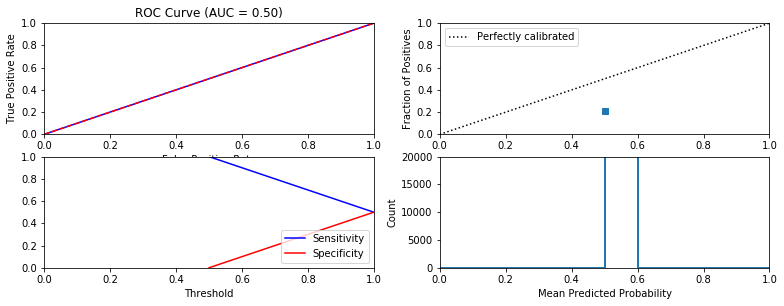


Similarity to LC grade ranking:  nan
Brier score: 0.25


In [91]:
dummy = DummyClassifier(strategy='uniform')
dumb, accuracy, other_Scores = fit_classification(dummy, entire_dic,
                      cv_parameters = {},
                      model_name = 'Dummy Classifier',
                      random_state = default_seed,
                      output_to_file = False,
                      print_to_screen = True)

In [93]:
## Train and test a random classifier
f1_scores_no_default = []
f1_scores_default = []

for d in data_dictionaries:
    dummy = DummyClassifier(strategy='uniform')
    dumb, accuracy, other_Scores = fit_classification(dummy, d,
                      cv_parameters = {},
                      model_name = 'Dummy Classifier',
                      random_state = default_seed,
                      output_to_file = False,
                      print_to_screen = False)
    f1_scores_default.append(other_Scores['Default']['f1-score'])
    f1_scores_no_default.append(other_Scores['No default']['f1-score'])

print('f1_score_no_default Mean: ', np.array(f1_scores_no_default).mean(), 
      'f1_score_no_default Standard Deviation: ', np.array(f1_scores_no_default).std())
print('f1_score_default Mean: ', np.array(f1_scores_default).mean(),
      'f1_score_default Standard Deviation: ', np.array(f1_scores_default).std())

f1_score_no_default Mean:  0.8845976305296773 f1_score_no_default Standard Deviation:  0.0017852256132286188
f1_score_default Mean:  0.0 f1_score_default Standard Deviation:  0.0


### Naive Bayes

  Model: gnb
Fit time: 5.97 seconds
Optimal parameters:
{'var_smoothing': 0.01}

Chosen threshold was: 0.5
Accuracy:  0.7519454266172038
              precision    recall  f1-score   support

  No default     0.8253    0.8716    0.8478    218824
     Default     0.3747    0.2944    0.3297     57208

   micro avg     0.7519    0.7519    0.7519    276032
   macro avg     0.6000    0.5830    0.5888    276032
weighted avg     0.7319    0.7519    0.7404    276032



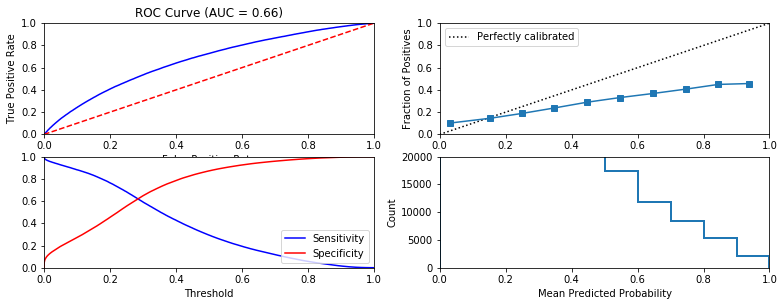


Similarity to LC grade ranking:  0.6072092514139018
Brier score: 0.1757832886443059


In [94]:
params = {'var_smoothing': [1e-09, 1e-5, 1e-2]}
gnb = GaussianNB()
    #change output_to_file to True later
gnb, accuracy, other_Scores = fit_classification(gnb, entire_dic,
                      cv_parameters = params,
                      model_name = 'gnb',
                      random_state = default_seed,
                      output_to_file = False,
                      print_to_screen = True)

In [95]:
## Train and test a naive bayes classifier
params = {'var_smoothing': [1e-2]}

f1_scores_no_default = []
f1_scores_default = []
#take this out later
#counter = 1
for d in data_dictionaries:
    gnb = GaussianNB()
    gnb, accuracy, other_Scores = fit_classification(gnb, d,
                          cv_parameters = params,
                          model_name = 'gnb',
                          random_state = default_seed,
                          output_to_file = False,
                          print_to_screen = False)
    f1_scores_default.append(other_Scores['Default']['f1-score'])
    f1_scores_no_default.append(other_Scores['No default']['f1-score'])

print('f1_score_no_default Mean: ', np.array(f1_scores_no_default).mean(), 
      'f1_score_no_default Standard Deviation: ', np.array(f1_scores_no_default).std())
print('f1_score_default Mean: ', np.array(f1_scores_default).mean(),
      'f1_score_default Standard Deviation: ', np.array(f1_scores_default).std())

f1_score_no_default Mean:  0.8520649790844702 f1_score_no_default Standard Deviation:  0.004462031260195963
f1_score_default Mean:  0.3194872483326742 f1_score_default Standard Deviation:  0.014520035708437684


### $l_1$ regularized logistic regression

  Model: l1 regularized logistic regression
Fit time: 514.31 seconds
Optimal parameters:
{'C': 0.1}

Chosen threshold was: 0.5
Accuracy:  0.7933717829816833
              precision    recall  f1-score   support

  No default     0.8003    0.9853    0.8832    218824
     Default     0.5130    0.0593    0.1064     57208

   micro avg     0.7934    0.7934    0.7934    276032
   macro avg     0.6566    0.5223    0.4948    276032
weighted avg     0.7407    0.7934    0.7222    276032



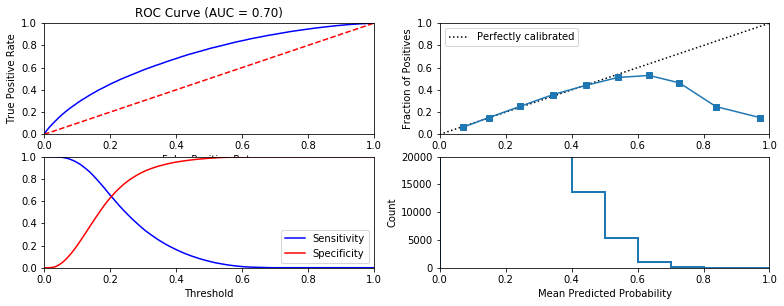


Similarity to LC grade ranking:  0.7237926569044133
Brier score: 0.15111769960935673


In [96]:
## Train and test a l_1 regularized logistic regression classifier
l1_logistic = LogisticRegression(penalty='l1')
params = {'C':[0.01, 0.1, 1, 10, 100]}

l1_logistic = fit_classification(l1_logistic, entire_dic,
                          cv_parameters = params,
                          model_name = 'l1 regularized logistic regression',
                          random_state = default_seed,
                          output_to_file = False,
                          print_to_screen = True)

In [97]:
## Train and test a L1 regularized logistic regression classifier
params = {'C': [0.1]}

f1_scores_no_default = []
f1_scores_default = []

for d in data_dictionaries:
    #Initialize L1 model with optimal parameter found from initial training on entire dataset.
    l1_logistic = LogisticRegression(penalty='l1')

    l1_logistic, accuracy, other_Scores = fit_classification(l1_logistic, d,
                          cv_parameters = params,
                          model_name = 'l1 regularized logistic regression',
                          random_state = default_seed,
                          output_to_file = False,
                          print_to_screen = False)
    f1_scores_default.append(other_Scores['Default']['f1-score'])
    f1_scores_no_default.append(other_Scores['No default']['f1-score'])

print('f1_score_no_default Mean: ', np.array(f1_scores_no_default).mean(), 
      'f1_score_no_default Standard Deviation: ', np.array(f1_scores_no_default).std())
print('f1_score_default Mean: ', np.array(f1_scores_default).mean(),
      'f1_score_default Standard Deviation: ', np.array(f1_scores_default).std())

f1_score_no_default Mean:  0.883433019740446 f1_score_no_default Standard Deviation:  0.0018023048519166278
f1_score_default Mean:  0.08065853610156168 f1_score_default Standard Deviation:  0.009097225814110007


### $l_2$ regularized logistic regression

  Model: l2
Fit time: 42.87 seconds
Optimal parameters:
{'C': 1}

Chosen threshold was: 0.5
Accuracy:  0.7933790285184327
              precision    recall  f1-score   support

  No default     0.8003    0.9852    0.8832    218824
     Default     0.5131    0.0596    0.1068     57208

   micro avg     0.7934    0.7934    0.7934    276032
   macro avg     0.6567    0.5224    0.4950    276032
weighted avg     0.7408    0.7934    0.7223    276032



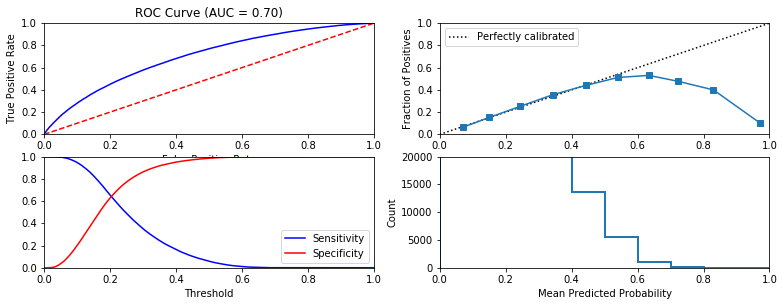


Similarity to LC grade ranking:  0.7247539299179008
Brier score: 0.15112198513584577


In [98]:
## Train and test a l_2 regularized logistic regression classifier
l2_logistic = LogisticRegression(penalty='l2')
params = {'C':[0.01, 0.1, 1, 10, 100]}

l2_logistic = fit_classification(l2_logistic, entire_dic,
                          cv_parameters = params,
                          model_name = 'l2',
                          random_state = default_seed,
                          output_to_file = False,
                          print_to_screen = True)

In [99]:
## Train and test a L2 regularized logistic regression classifier
params = {'C': [0.1]}

f1_scores_no_default = []
f1_scores_default = []

for d in data_dictionaries:
    #Initialize L2 model with optimal parameter found from initial training on entire dataset.
    l1_logistic = LogisticRegression(penalty='l2')

    l1_logistic = fit_classification(l1_logistic, d,
                          cv_parameters = params,
                          model_name = 'l2 regularized logistic regression',
                          random_state = default_seed,
                          output_to_file = False,
                          print_to_screen = False)
    f1_scores_default.append(other_Scores['Default']['f1-score'])
    f1_scores_no_default.append(other_Scores['No default']['f1-score'])

print('f1_score_no_default Mean: ', np.array(f1_scores_no_default).mean(), 
      'f1_score_no_default Standard Deviation: ', np.array(f1_scores_no_default).std())
print('f1_score_default Mean: ', np.array(f1_scores_default).mean(),
      'f1_score_default Standard Deviation: ', np.array(f1_scores_default).std())

f1_score_no_default Mean:  0.8821922437829154 f1_score_no_default Standard Deviation:  5.551115123125783e-16
f1_score_default Mean:  0.06899621633652345 f1_score_default Standard Deviation:  2.7755575615628914e-17


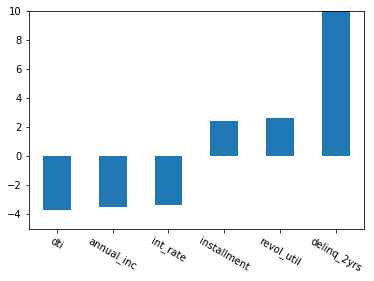

In [104]:
## plot top 3 features with the most positive (and negative) weights 
l2_logistic=list(l2_logistic)

top_and_bottom_idx = list(np.argsort(l2_logistic[0]['model'].coef_)[0,:3]) + list(np.argsort(l2_logistic[0]['model'].coef_)[0,-3:])
bplot = pd.Series(l2_logistic[0]['model'].coef_[0,top_and_bottom_idx])
xticks = selected_features[top_and_bottom_idx]
p1 = bplot.plot(kind='bar',rot=-30,ylim=(-5,10))
p1.set_xticklabels(xticks)
plt.show()

### Decision tree

In [29]:
params = {"max_depth": 
          [11,15,17,19],"min_samples_split":range(2,5)}###question
##Run over entire data set

  Model: decision_tree
Fit time: 214.22 seconds
Optimal parameters:
{'max_depth': 11, 'min_samples_split': 3}

Chosen threshold was: 0.5
Accuracy:  0.7911763853466265
              precision    recall  f1-score   support

  No default     0.8020    0.9781    0.8813    218824
     Default     0.4763    0.0763    0.1315     57208

   micro avg     0.7912    0.7912    0.7912    276032
   macro avg     0.6392    0.5272    0.5064    276032
weighted avg     0.7345    0.7912    0.7259    276032



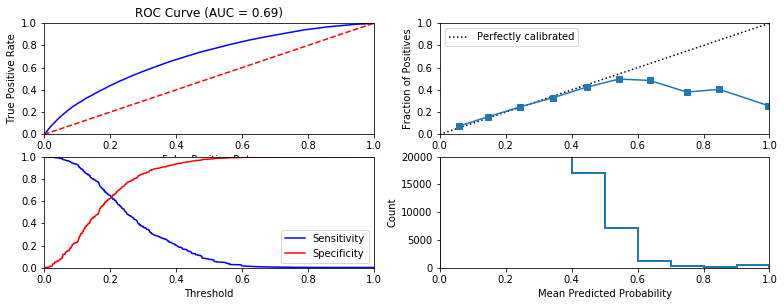


Similarity to LC grade ranking:  0.6662517963215414
Brier score: 0.15344521362778335


In [30]:
## Train and test a decision tree classifier
# max_depth=None, min_samples_split=2, min_samples_leaf=1

decision_tree = DecisionTreeClassifier()
    #change output_to_file to True later
decision_tree, accuracy, other_Scores = fit_classification(decision_tree, entire_dic,
                      cv_parameters = params,
                      model_name = 'decision_tree',
                      random_state = default_seed,
                      output_to_file = False,
                      print_to_screen = True)

In [31]:
## Train and test a decision tree classifier
params = {'max_depth': [11], 'min_samples_split': [3]}

f1_scores_no_default = []
f1_scores_default = []
#take this out later
#counter = 1
for d in data_dictionaries:
    decision_tree = DecisionTreeClassifier()
    decision_tree = fit_classification(decision_tree, d,
                          cv_parameters = params,
                          model_name = 'decision_tree',
                          random_state = default_seed,
                          output_to_file = False,
                          print_to_screen = False)

    f1_scores_default.append(other_Scores['Default']['f1-score'])
    f1_scores_no_default.append(other_Scores['No default']['f1-score'])

print('f1_score_no_default Mean: ', np.array(f1_scores_no_default).mean(), 
      'f1_score_no_default Standard Deviation: ', np.array(f1_scores_no_default).std())
print('f1_score_default Mean: ', np.array(f1_scores_default).mean(),
      'f1_score_default Standard Deviation: ', np.array(f1_scores_default).std())

f1_score_no_default Mean:  0.8813198487930625 f1_score_no_default Standard Deviation:  1.1102230246251565e-16
f1_score_default Mean:  0.13153136864943044 f1_score_default Standard Deviation:  5.551115123125783e-17


### Random forest

In [44]:
# Number of trees in random forest


param_grid = { 
    'n_estimators': [200, 500],
    'max_features': [ 'sqrt', 'log2'],
    'max_depth' : [4,5,7,8],
    'criterion' :['gini', 'entropy']
}

In [45]:
## Train and test a random forest classifier

random_forest = RandomForestClassifier()

random_forest = fit_classification(random_forest, entire_dic,
                          cv_parameters = param_grid,
                          model_name = 'random_forest',
                          random_state = default_seed,
                          output_to_file = False,
                          print_to_screen = False)

In [46]:
random_forest
# Forgot to set print_to_screen to True but here is the output. From previous iteration we found that AUC for RF is 0.69

({'model': RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
              max_depth=8, max_features='log2', max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=200, n_jobs=None,
              oob_score=False, random_state=None, verbose=0,
              warm_start=False),
  'y_pred_labels': array([False, False, False, ..., False, False, False]),
  'y_pred_probs': array([0.14967802, 0.12965914, 0.28291209, ..., 0.31310885, 0.33726184,
         0.32937267])},
 0.7933790285184327,
 {'No default': {'precision': 0.793659609688099,
   'recall': 0.9991180126494351,
   'f1-score': 0.8846156958583521,
   'support': 218824},
  'Default': {'precision': 0.6553571428571429,
   'recall': 0.006415186687176618,
   'f1-score': 0.012705996399390664,
   'support': 57208},
  'micro avg': {'precision': 0.7933790285184327,
   'recall': 0

In [47]:
## Train and test a decision tree classifier
params = {'criterion': ['gini'], 'max_depth': [8], 'max_features': ['log2'], 'n_estimators': [200]}

f1_scores_no_default = []
f1_scores_default = []
#take this out later
#counter = 1
for d in data_dictionaries:
    random_forest = RandomForestClassifier()
    random_forest = fit_classification(random_forest, d,
                          cv_parameters = params,
                          model_name = 'random_forest',
                          random_state = default_seed,
                          output_to_file = False,
                          print_to_screen = False)


    f1_scores_default.append(other_Scores['Default']['f1-score'])
    f1_scores_no_default.append(other_Scores['No default']['f1-score'])

print('f1_score_no_default Mean: ', np.array(f1_scores_no_default).mean(), 
      'f1_score_no_default Standard Deviation: ', np.array(f1_scores_no_default).std())
print('f1_score_default Mean: ', np.array(f1_scores_default).mean(),
      'f1_score_default Standard Deviation: ', np.array(f1_scores_default).std())

f1_score_no_default Mean:  0.8823140954380126 f1_score_no_default Standard Deviation:  2.220446049250313e-16
f1_score_default Mean:  0.1761850247076384 f1_score_default Standard Deviation:  2.7755575615628914e-17


In [48]:
random_forest=list(random_forest)#Have to change it to list for plotting

In [49]:
random_forest[0]['model']

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=8, max_features='log2', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=200, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

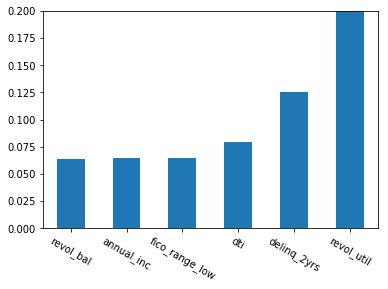

In [50]:
## Plot top 6 most significant features
top_idx = list(np.argsort(random_forest[0]['model'].feature_importances_)[-6:]) 
bplot = pd.Series(random_forest[0]['model'].feature_importances_[top_idx])##have to change the type to list
xticks = selected_features[top_idx]
p2 = bplot.plot(kind='bar',rot=-30,ylim=(0,0.2))
p2.set_xticklabels(xticks)
plt.show()

### Multi-layer perceptron

In [40]:
param_grid = { 
    'hidden_layer_sizes': [(10,10), (20,20), (40,60)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'alpha': [0.0001, 0.05],
    'learning_rate': ['constant','adaptive']
}


  Model: Multi-layer perceptron
Fit time: 13553.08 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7940492406677486
              precision    recall  f1-score   support

  No default     0.8065    0.9739    0.8823    218824
     Default     0.5152    0.1063    0.1762     57208

   micro avg     0.7940    0.7940    0.7940    276032
   macro avg     0.6609    0.5401    0.5292    276032
weighted avg     0.7461    0.7940    0.7360    276032



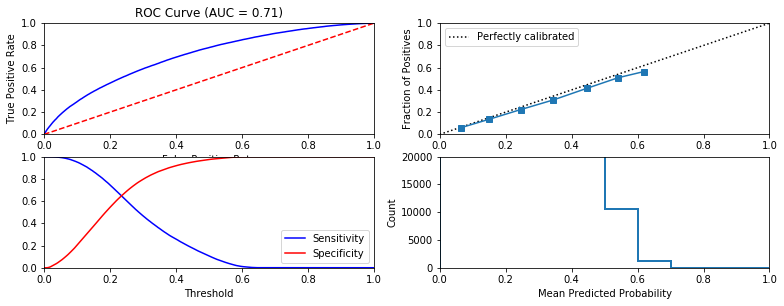


Similarity to LC grade ranking:  0.7109024794418548
Brier score: 0.14998043574226141


In [41]:
## Train and test a multi-layer perceptron classifier


mlp = MLPClassifier()
# cv_parameters = ...

mlp, accuracy, other_Scores = fit_classification(mlp, entire_dic,
                          cv_parameters = param_grid,
                          model_name = 'Multi-layer perceptron',
                          random_state = default_seed,
                          output_to_file = False,
                          print_to_screen = True)

  Model: mlp
Fit time: 105.09 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7894
              precision    recall  f1-score   support

  No default     0.8003    0.9769    0.8798     15782
     Default     0.5041    0.0877    0.1494      4218

   micro avg     0.7894    0.7894    0.7894     20000
   macro avg     0.6522    0.5323    0.5146     20000
weighted avg     0.7378    0.7894    0.7258     20000



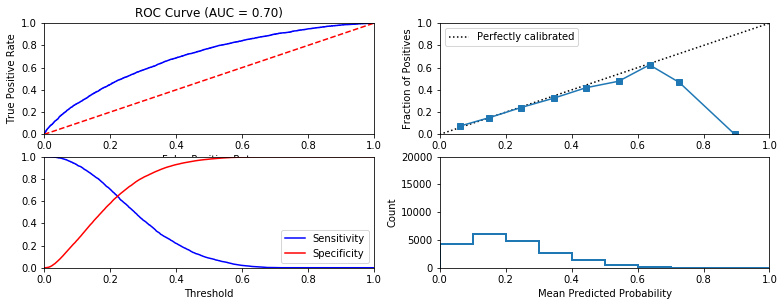


Similarity to LC grade ranking:  0.6357038619354717
Brier score: 0.1528860447429533
  Model: mlp
Fit time: 59.53 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7915
              precision    recall  f1-score   support

  No default     0.7966    0.9886    0.8823     15806
     Default     0.5312    0.0486    0.0891      4194

   micro avg     0.7915    0.7915    0.7915     20000
   macro avg     0.6639    0.5186    0.4857     20000
weighted avg     0.7410    0.7915    0.7160     20000



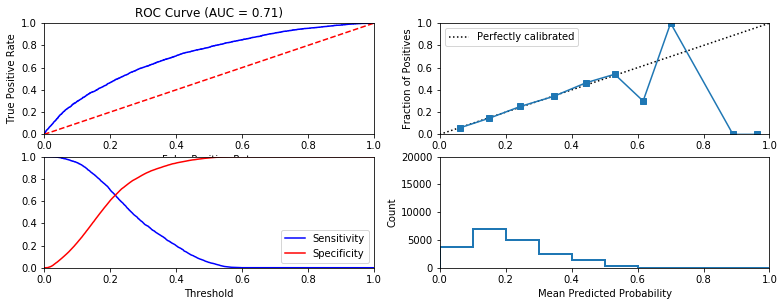


Similarity to LC grade ranking:  0.7010003011491474
Brier score: 0.15053562999366762
  Model: mlp
Fit time: 74.6 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79105
              precision    recall  f1-score   support

  No default     0.7972    0.9865    0.8818     15807
     Default     0.5159    0.0541    0.0980      4193

   micro avg     0.7911    0.7911    0.7911     20000
   macro avg     0.6566    0.5203    0.4899     20000
weighted avg     0.7383    0.7911    0.7175     20000



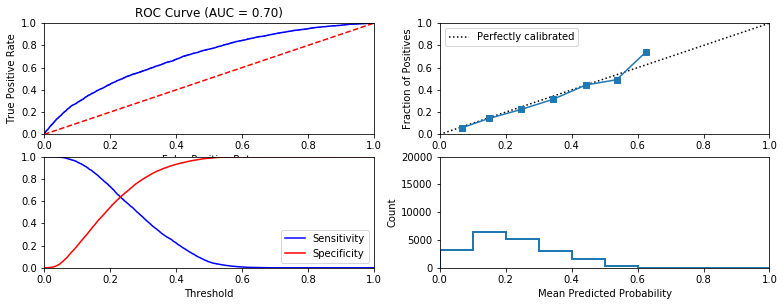


Similarity to LC grade ranking:  0.6686095397461889
Brier score: 0.1521733937946541
  Model: mlp
Fit time: 39.11 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79505
              precision    recall  f1-score   support

  No default     0.8038    0.9814    0.8838     15883
     Default     0.5148    0.0760    0.1325      4117

   micro avg     0.7951    0.7951    0.7951     20000
   macro avg     0.6593    0.5287    0.5081     20000
weighted avg     0.7443    0.7951    0.7291     20000



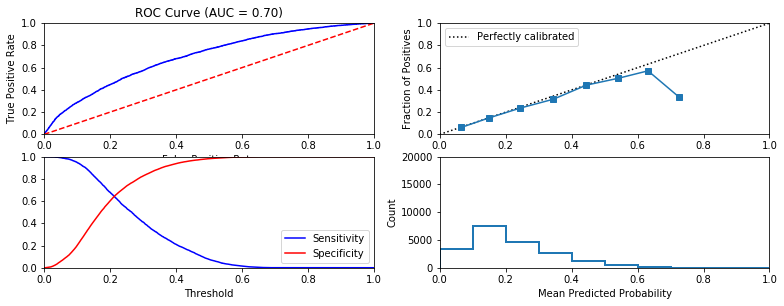


Similarity to LC grade ranking:  0.6940757551289788
Brier score: 0.1500812891165539
  Model: mlp
Fit time: 46.29 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7915
              precision    recall  f1-score   support

  No default     0.7984    0.9847    0.8818     15801
     Default     0.5284    0.0643    0.1146      4199

   micro avg     0.7915    0.7915    0.7915     20000
   macro avg     0.6634    0.5245    0.4982     20000
weighted avg     0.7417    0.7915    0.7208     20000



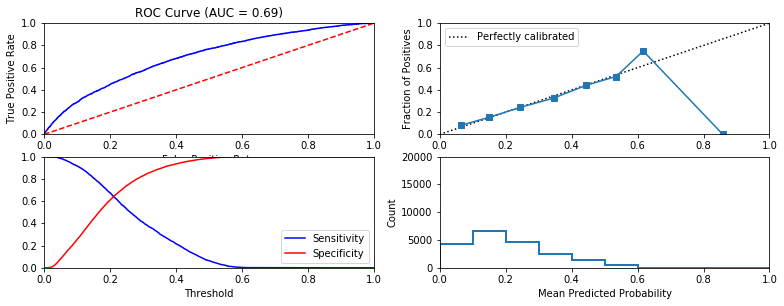


Similarity to LC grade ranking:  0.6750197123063478
Brier score: 0.15219983444812665
  Model: mlp
Fit time: 49.09 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79
              precision    recall  f1-score   support

  No default     0.8014    0.9757    0.8800     15782
     Default     0.5115    0.0951    0.1603      4218

   micro avg     0.7900    0.7900    0.7900     20000
   macro avg     0.6564    0.5354    0.5202     20000
weighted avg     0.7402    0.7900    0.7282     20000



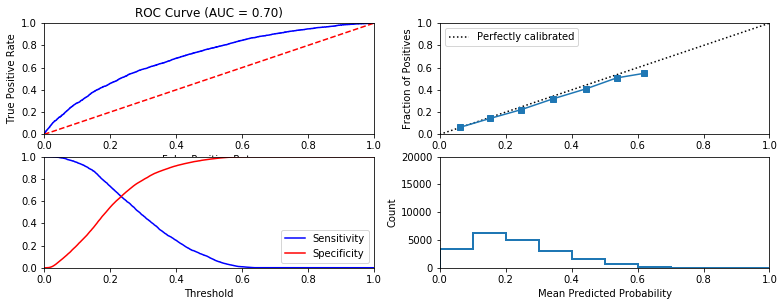


Similarity to LC grade ranking:  0.6809217815720354
Brier score: 0.15276158231793963
  Model: mlp
Fit time: 56.98 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7981
              precision    recall  f1-score   support

  No default     0.8081    0.9785    0.8852     15905
     Default     0.5385    0.0974    0.1650      4095

   micro avg     0.7981    0.7981    0.7981     20000
   macro avg     0.6733    0.5380    0.5251     20000
weighted avg     0.7529    0.7981    0.7377     20000



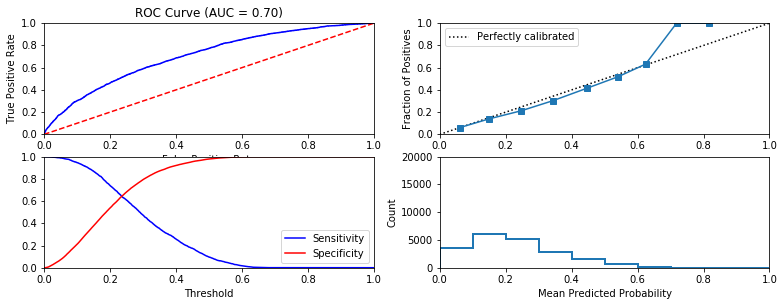


Similarity to LC grade ranking:  0.6913710913131004
Brier score: 0.14863621580175154
  Model: mlp
Fit time: 92.57 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79455
              precision    recall  f1-score   support

  No default     0.8005    0.9867    0.8839     15851
     Default     0.5433    0.0605    0.1089      4149

   micro avg     0.7945    0.7945    0.7945     20000
   macro avg     0.6719    0.5236    0.4964     20000
weighted avg     0.7471    0.7945    0.7231     20000



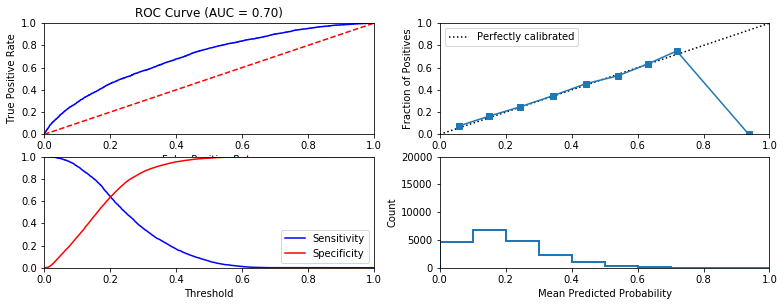


Similarity to LC grade ranking:  0.6692881704576801
Brier score: 0.15063886195287665
  Model: mlp
Fit time: 145.32 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7966
              precision    recall  f1-score   support

  No default     0.8018    0.9889    0.8856     15918
     Default     0.5191    0.0465    0.0854      4082

   micro avg     0.7966    0.7966    0.7966     20000
   macro avg     0.6604    0.5177    0.4855     20000
weighted avg     0.7441    0.7966    0.7223     20000



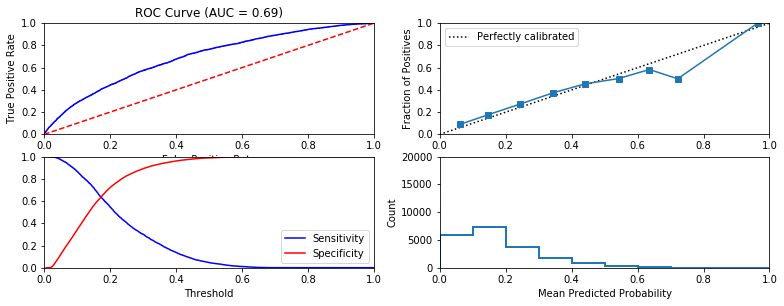


Similarity to LC grade ranking:  0.6604896856820598
Brier score: 0.15068087554613452
  Model: mlp
Fit time: 78.85 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7912
              precision    recall  f1-score   support

  No default     0.8076    0.9662    0.8798     15821
     Default     0.5014    0.1285    0.2046      4179

   micro avg     0.7912    0.7912    0.7912     20000
   macro avg     0.6545    0.5474    0.5422     20000
weighted avg     0.7436    0.7912    0.7387     20000



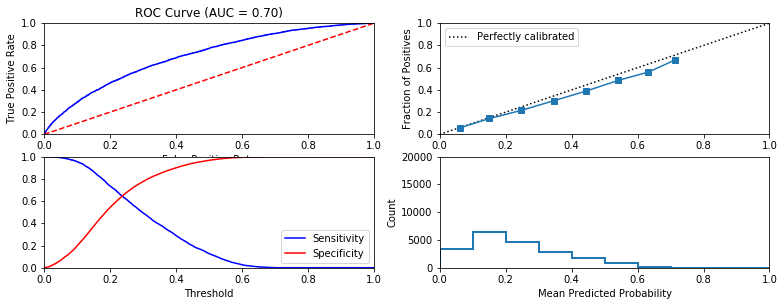


Similarity to LC grade ranking:  0.6715997391580113
Brier score: 0.15162600435809123
  Model: mlp
Fit time: 63.67 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7882
              precision    recall  f1-score   support

  No default     0.7962    0.9829    0.8798     15771
     Default     0.4934    0.0620    0.1101      4229

   micro avg     0.7882    0.7882    0.7882     20000
   macro avg     0.6448    0.5224    0.4949     20000
weighted avg     0.7322    0.7882    0.7170     20000



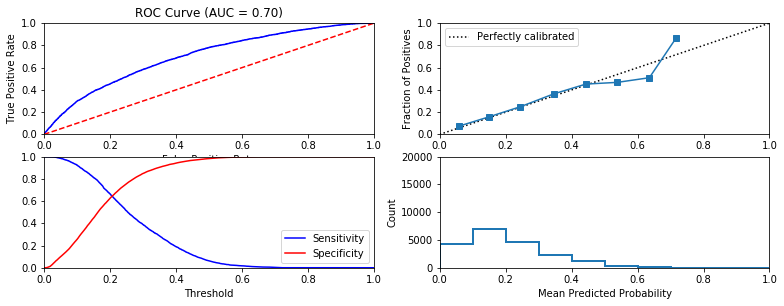


Similarity to LC grade ranking:  0.6589555874004835
Brier score: 0.15253587867822224
  Model: mlp
Fit time: 75.1 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7904
              precision    recall  f1-score   support

  No default     0.7972    0.9858    0.8815     15818
     Default     0.4886    0.0514    0.0930      4182

   micro avg     0.7904    0.7904    0.7904     20000
   macro avg     0.6429    0.5186    0.4873     20000
weighted avg     0.7327    0.7904    0.7166     20000



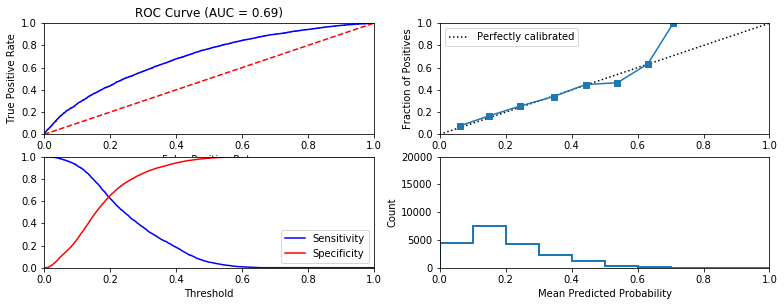


Similarity to LC grade ranking:  0.6939787380164489
Brier score: 0.15268321238269456
  Model: mlp
Fit time: 79.37 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79475
              precision    recall  f1-score   support

  No default     0.7986    0.9916    0.8847     15877
     Default     0.5315    0.0369    0.0689      4123

   micro avg     0.7947    0.7947    0.7947     20000
   macro avg     0.6650    0.5142    0.4768     20000
weighted avg     0.7435    0.7947    0.7165     20000



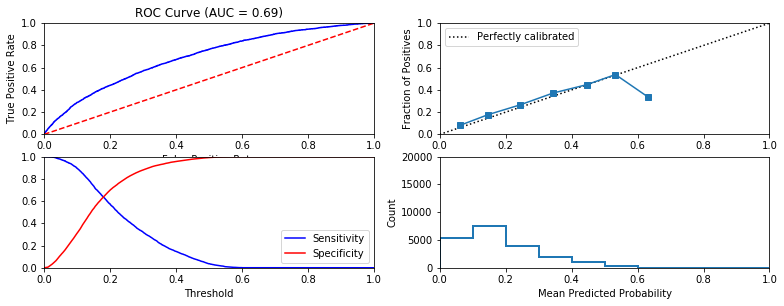


Similarity to LC grade ranking:  0.6823217181729224
Brier score: 0.15137082704274968
  Model: mlp
Fit time: 79.36 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7981
              precision    recall  f1-score   support

  No default     0.8011    0.9936    0.8870     15953
     Default     0.5211    0.0274    0.0521      4047

   micro avg     0.7981    0.7981    0.7981     20000
   macro avg     0.6611    0.5105    0.4696     20000
weighted avg     0.7444    0.7981    0.7181     20000



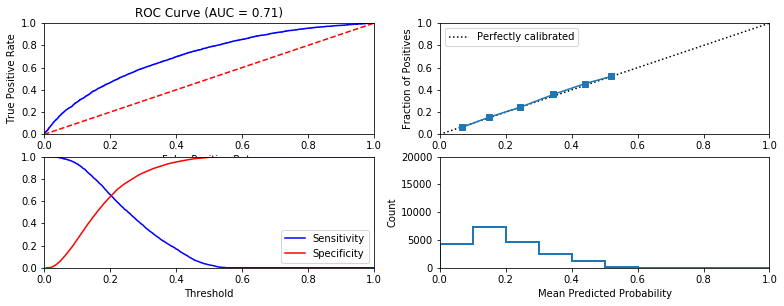


Similarity to LC grade ranking:  0.690015919222245
Brier score: 0.14719251102916714
  Model: mlp
Fit time: 107.16 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7837
              precision    recall  f1-score   support

  No default     0.8037    0.9585    0.8743     15697
     Default     0.4910    0.1459    0.2250      4303

   micro avg     0.7837    0.7837    0.7837     20000
   macro avg     0.6474    0.5522    0.5497     20000
weighted avg     0.7364    0.7837    0.7346     20000



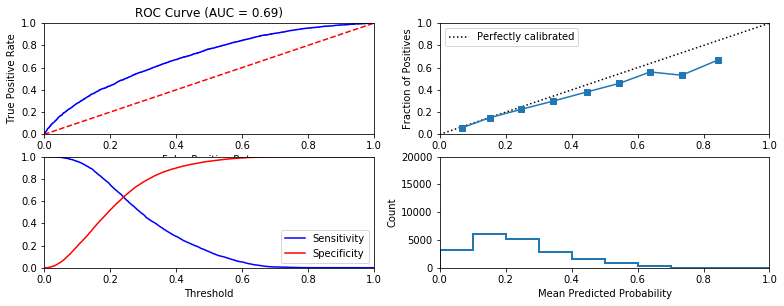


Similarity to LC grade ranking:  0.6636446521435525
Brier score: 0.1562221384725863
  Model: mlp
Fit time: 75.77 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7971
              precision    recall  f1-score   support

  No default     0.8060    0.9821    0.8853     15954
     Default     0.4893    0.0677    0.1190      4046

   micro avg     0.7971    0.7971    0.7971     20000
   macro avg     0.6476    0.5249    0.5022     20000
weighted avg     0.7419    0.7971    0.7303     20000



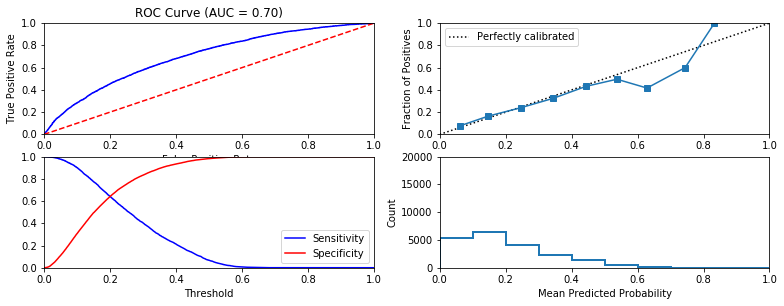


Similarity to LC grade ranking:  0.6765449538687909
Brier score: 0.14859228366028662
  Model: mlp
Fit time: 61.48 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79435
              precision    recall  f1-score   support

  No default     0.8045    0.9787    0.8831     15877
     Default     0.5073    0.0844    0.1447      4123

   micro avg     0.7944    0.7944    0.7944     20000
   macro avg     0.6559    0.5316    0.5139     20000
weighted avg     0.7433    0.7944    0.7309     20000



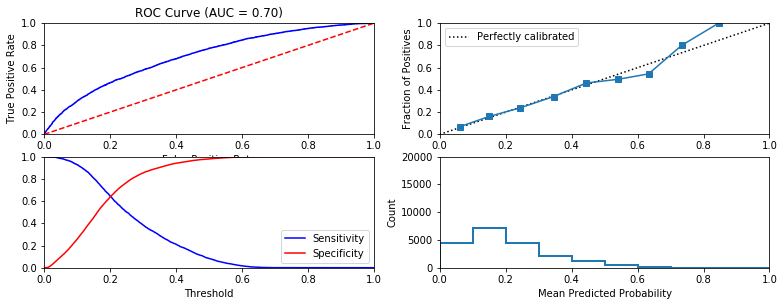


Similarity to LC grade ranking:  0.6953249101105685
Brier score: 0.1493263912143949
  Model: mlp
Fit time: 106.14 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79785
              precision    recall  f1-score   support

  No default     0.8057    0.9836    0.8858     15944
     Default     0.5121    0.0678    0.1197      4056

   micro avg     0.7978    0.7978    0.7978     20000
   macro avg     0.6589    0.5257    0.5028     20000
weighted avg     0.7462    0.7978    0.7305     20000



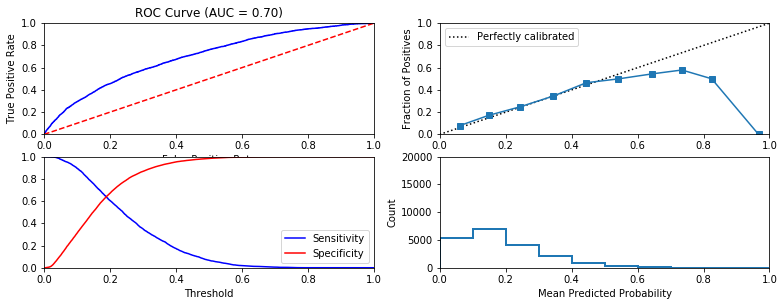


Similarity to LC grade ranking:  0.6546579914207018
Brier score: 0.14859299781712965
  Model: mlp
Fit time: 74.52 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7964
              precision    recall  f1-score   support

  No default     0.8016    0.9884    0.8852     15885
     Default     0.5521    0.0554    0.1007      4115

   micro avg     0.7964    0.7964    0.7964     20000
   macro avg     0.6768    0.5219    0.4930     20000
weighted avg     0.7502    0.7964    0.7238     20000



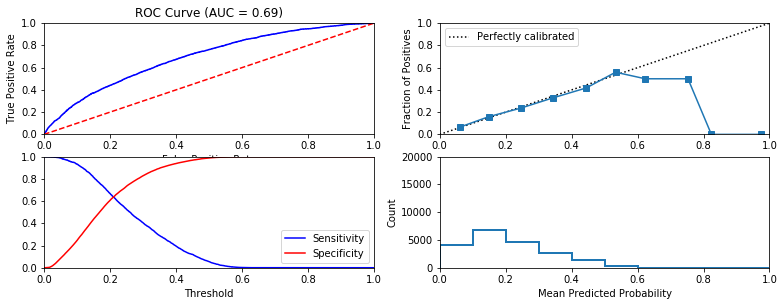


Similarity to LC grade ranking:  0.6783606041996587
Brier score: 0.15059741121620918
  Model: mlp
Fit time: 72.82 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.796
              precision    recall  f1-score   support

  No default     0.8049    0.9818    0.8846     15929
     Default     0.4921    0.0690    0.1211      4071

   micro avg     0.7960    0.7960    0.7960     20000
   macro avg     0.6485    0.5254    0.5028     20000
weighted avg     0.7413    0.7960    0.7292     20000



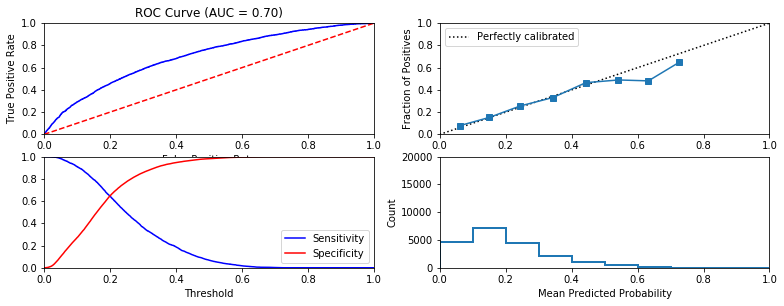


Similarity to LC grade ranking:  0.6652925419524216
Brier score: 0.14897311750562062
  Model: mlp
Fit time: 92.79 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79155
              precision    recall  f1-score   support

  No default     0.8016    0.9782    0.8811     15795
     Default     0.5249    0.0904    0.1542      4205

   micro avg     0.7915    0.7915    0.7915     20000
   macro avg     0.6632    0.5343    0.5177     20000
weighted avg     0.7434    0.7915    0.7283     20000



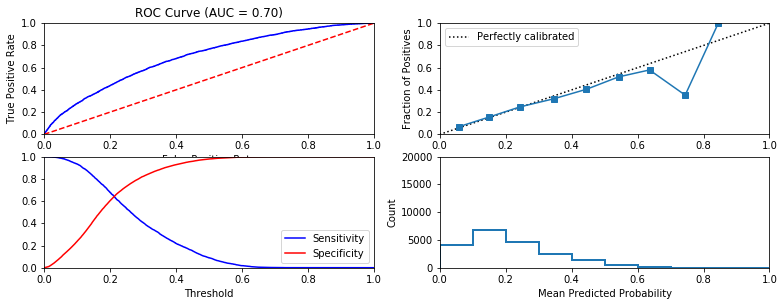


Similarity to LC grade ranking:  0.627669814300397
Brier score: 0.15280366527420808
  Model: mlp
Fit time: 84.83 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7963
              precision    recall  f1-score   support

  No default     0.8018    0.9880    0.8852     15896
     Default     0.5364    0.0538    0.0979      4104

   micro avg     0.7963    0.7963    0.7963     20000
   macro avg     0.6691    0.5209    0.4915     20000
weighted avg     0.7473    0.7963    0.7236     20000



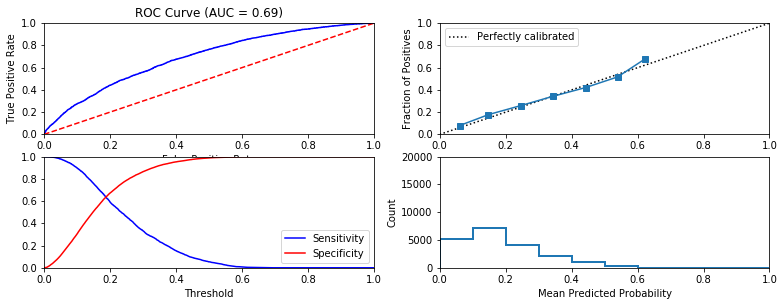


Similarity to LC grade ranking:  0.679324583696247
Brier score: 0.1508845880214905
  Model: mlp
Fit time: 47.85 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79525
              precision    recall  f1-score   support

  No default     0.8086    0.9727    0.8831     15898
     Default     0.5040    0.1075    0.1772      4102

   micro avg     0.7953    0.7953    0.7953     20000
   macro avg     0.6563    0.5401    0.5301     20000
weighted avg     0.7461    0.7953    0.7383     20000



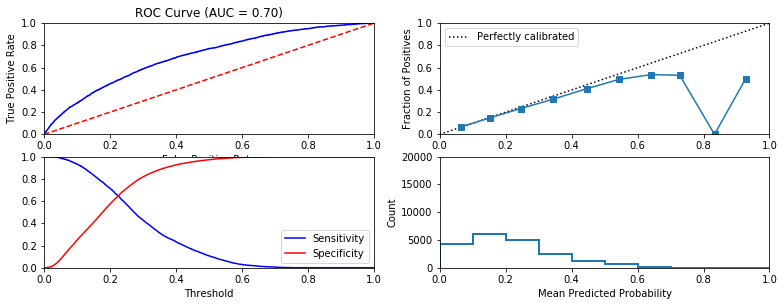


Similarity to LC grade ranking:  0.6963887162111821
Brier score: 0.1498033342166903
  Model: mlp
Fit time: 45.86 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7928
              precision    recall  f1-score   support

  No default     0.7991    0.9864    0.8829     15843
     Default     0.5146    0.0551    0.0995      4157

   micro avg     0.7928    0.7928    0.7928     20000
   macro avg     0.6569    0.5207    0.4912     20000
weighted avg     0.7400    0.7928    0.7201     20000



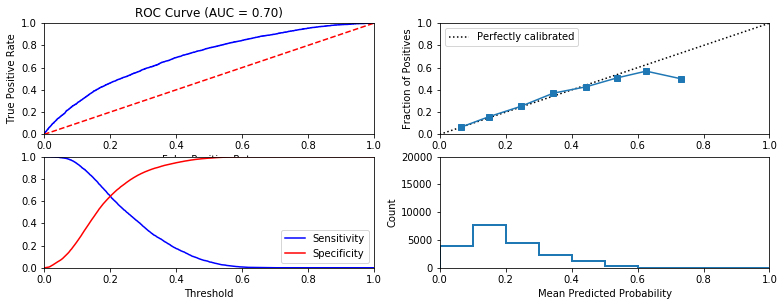


Similarity to LC grade ranking:  0.6959795403086657
Brier score: 0.15075123863179116
  Model: mlp
Fit time: 88.99 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7916
              precision    recall  f1-score   support

  No default     0.7971    0.9875    0.8821     15795
     Default     0.5429    0.0556    0.1009      4205

   micro avg     0.7916    0.7916    0.7916     20000
   macro avg     0.6700    0.5216    0.4915     20000
weighted avg     0.7436    0.7916    0.7179     20000



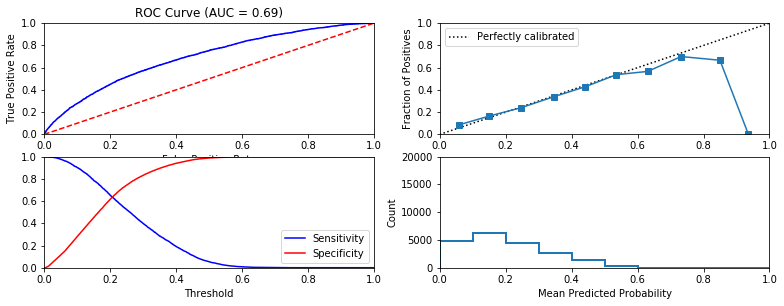


Similarity to LC grade ranking:  0.6733433635549999
Brier score: 0.15326599135256974
  Model: mlp
Fit time: 86.19 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7938
              precision    recall  f1-score   support

  No default     0.8015    0.9834    0.8832     15856
     Default     0.5183    0.0683    0.1207      4144

   micro avg     0.7938    0.7938    0.7938     20000
   macro avg     0.6599    0.5259    0.5019     20000
weighted avg     0.7428    0.7938    0.7252     20000



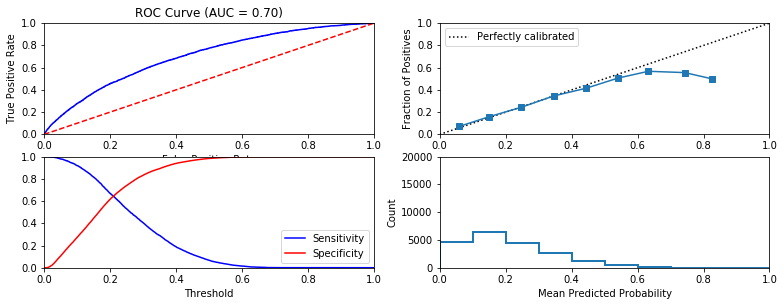


Similarity to LC grade ranking:  0.6526443822679621
Brier score: 0.15088498474180573
  Model: mlp
Fit time: 43.93 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79575
              precision    recall  f1-score   support

  No default     0.8052    0.9803    0.8842     15905
     Default     0.5079    0.0789    0.1365      4095

   micro avg     0.7957    0.7957    0.7957     20000
   macro avg     0.6565    0.5296    0.5104     20000
weighted avg     0.7443    0.7957    0.7311     20000



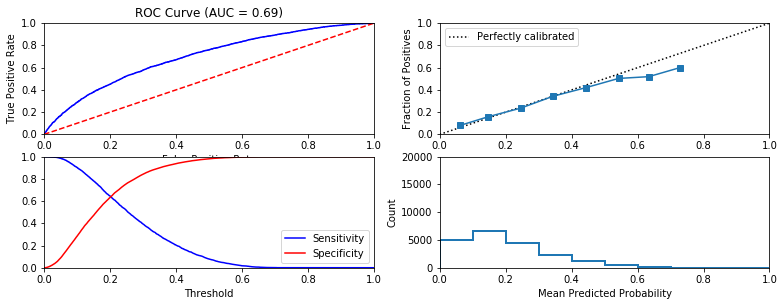


Similarity to LC grade ranking:  0.6683891519173736
Brier score: 0.14988224431416844
  Model: mlp
Fit time: 26.65 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79665
              precision    recall  f1-score   support

  No default     0.8031    0.9856    0.8851     15887
     Default     0.5456    0.0669    0.1191      4113

   micro avg     0.7966    0.7966    0.7966     20000
   macro avg     0.6744    0.5262    0.5021     20000
weighted avg     0.7502    0.7966    0.7275     20000



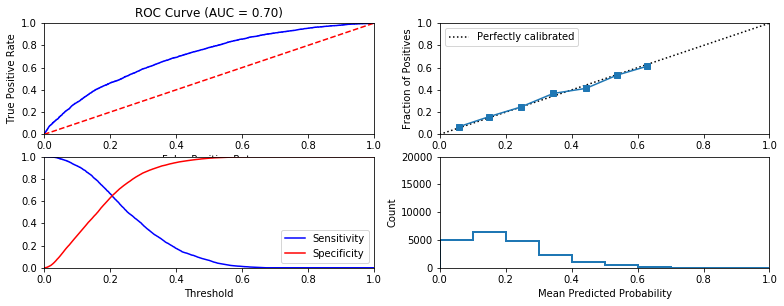


Similarity to LC grade ranking:  0.7000952229703585
Brier score: 0.14908543062279855
  Model: mlp
Fit time: 57.66 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7956
              precision    recall  f1-score   support

  No default     0.8034    0.9840    0.8846     15923
     Default     0.4889    0.0596    0.1063      4077

   micro avg     0.7956    0.7956    0.7956     20000
   macro avg     0.6462    0.5218    0.4954     20000
weighted avg     0.7393    0.7956    0.7259     20000



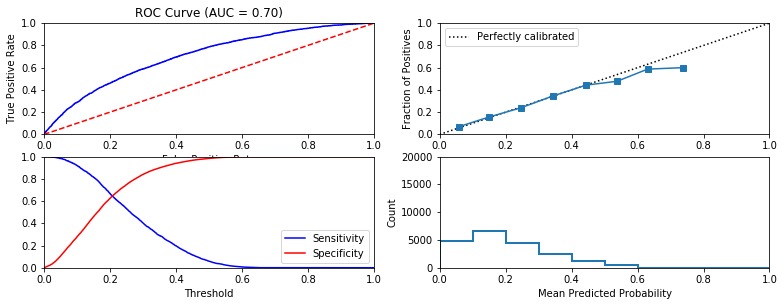


Similarity to LC grade ranking:  0.6874124175716015
Brier score: 0.14831414440782048
  Model: mlp
Fit time: 76.26 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7917
              precision    recall  f1-score   support

  No default     0.8035    0.9754    0.8811     15829
     Default     0.5032    0.0947    0.1594      4171

   micro avg     0.7917    0.7917    0.7917     20000
   macro avg     0.6533    0.5350    0.5203     20000
weighted avg     0.7409    0.7917    0.7306     20000



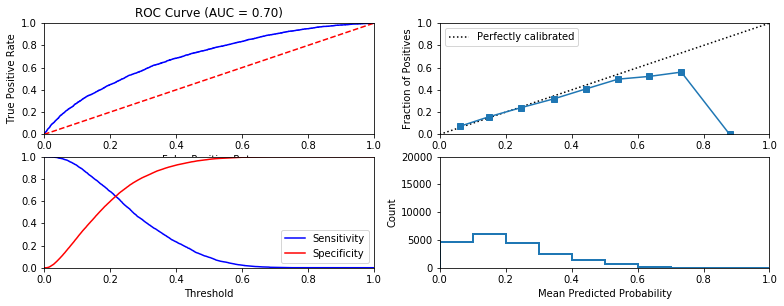


Similarity to LC grade ranking:  0.6856674227728156
Brier score: 0.15200607790685539
  Model: mlp
Fit time: 84.28 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79205
              precision    recall  f1-score   support

  No default     0.7964    0.9898    0.8827     15802
     Default     0.5540    0.0476    0.0877      4198

   micro avg     0.7921    0.7921    0.7921     20000
   macro avg     0.6752    0.5187    0.4852     20000
weighted avg     0.7455    0.7921    0.7158     20000



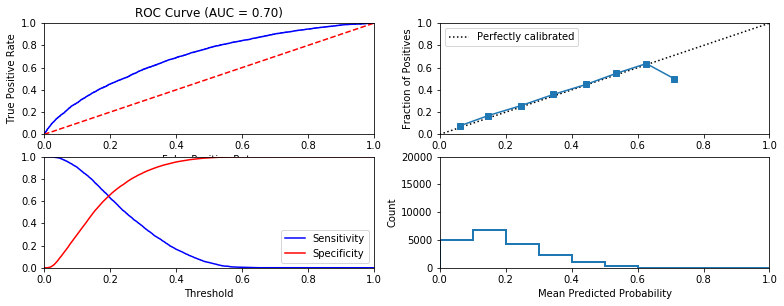


Similarity to LC grade ranking:  0.6751940898647004
Brier score: 0.15201874636312515
  Model: mlp
Fit time: 55.76 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7945
              precision    recall  f1-score   support

  No default     0.8030    0.9817    0.8834     15858
     Default     0.5261    0.0777    0.1355      4142

   micro avg     0.7945    0.7945    0.7945     20000
   macro avg     0.6646    0.5297    0.5094     20000
weighted avg     0.7456    0.7945    0.7285     20000



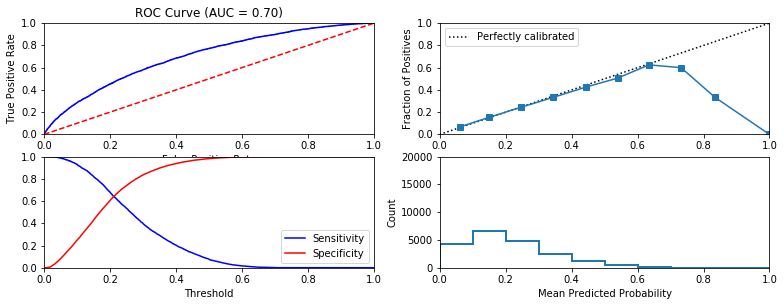


Similarity to LC grade ranking:  0.6419474203324863
Brier score: 0.1505130977496886
  Model: mlp
Fit time: 23.78 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7924
              precision    recall  f1-score   support

  No default     0.8004    0.9822    0.8821     15806
     Default     0.5348    0.0770    0.1346      4194

   micro avg     0.7924    0.7924    0.7924     20000
   macro avg     0.6676    0.5296    0.5083     20000
weighted avg     0.7447    0.7924    0.7253     20000



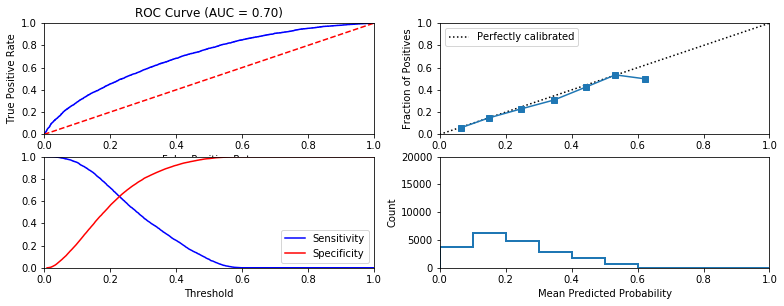


Similarity to LC grade ranking:  0.698971443191958
Brier score: 0.1516792817694478
  Model: mlp
Fit time: 52.62 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79535
              precision    recall  f1-score   support

  No default     0.8014    0.9868    0.8845     15878
     Default     0.5324    0.0577    0.1042      4122

   micro avg     0.7954    0.7954    0.7954     20000
   macro avg     0.6669    0.5223    0.4943     20000
weighted avg     0.7459    0.7954    0.7237     20000



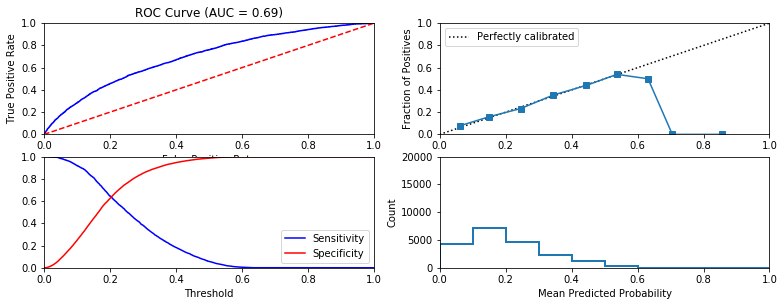


Similarity to LC grade ranking:  0.6868180161053237
Brier score: 0.15041298309435988
  Model: mlp
Fit time: 34.72 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7932
              precision    recall  f1-score   support

  No default     0.7963    0.9931    0.8839     15850
     Default     0.5299    0.0299    0.0566      4150

   micro avg     0.7932    0.7932    0.7932     20000
   macro avg     0.6631    0.5115    0.4702     20000
weighted avg     0.7410    0.7932    0.7122     20000



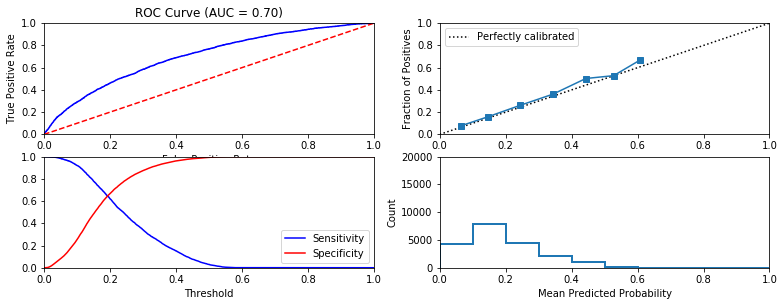


Similarity to LC grade ranking:  0.676362767812442
Brier score: 0.15061603051046704
  Model: mlp
Fit time: 47.66 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79215
              precision    recall  f1-score   support

  No default     0.7972    0.9889    0.8828     15830
     Default     0.5179    0.0451    0.0829      4170

   micro avg     0.7922    0.7922    0.7922     20000
   macro avg     0.6576    0.5170    0.4829     20000
weighted avg     0.7390    0.7922    0.7160     20000



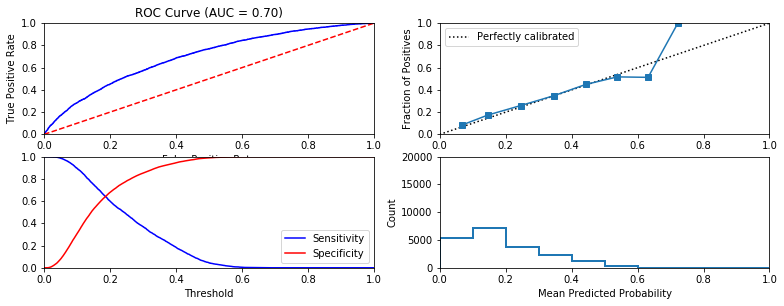


Similarity to LC grade ranking:  0.6582306936149729
Brier score: 0.15181902841112602
  Model: mlp
Fit time: 52.17 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79835
              precision    recall  f1-score   support

  No default     0.8007    0.9942    0.8870     15927
     Default     0.5893    0.0324    0.0614      4073

   micro avg     0.7984    0.7984    0.7984     20000
   macro avg     0.6950    0.5133    0.4742     20000
weighted avg     0.7577    0.7984    0.7189     20000



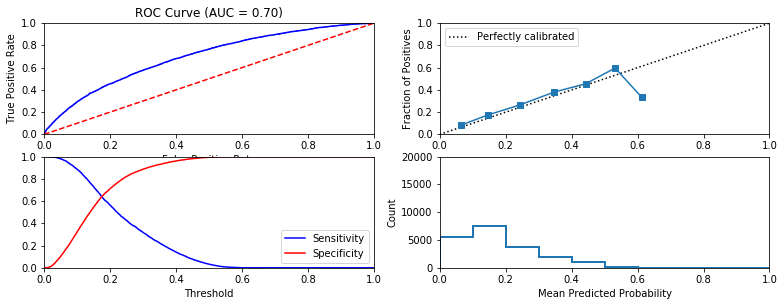


Similarity to LC grade ranking:  0.7082785385489294
Brier score: 0.14933542719048795
  Model: mlp
Fit time: 71.22 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7963
              precision    recall  f1-score   support

  No default     0.8022    0.9866    0.8849     15870
     Default     0.5583    0.0649    0.1163      4130

   micro avg     0.7963    0.7963    0.7963     20000
   macro avg     0.6802    0.5258    0.5006     20000
weighted avg     0.7518    0.7963    0.7262     20000



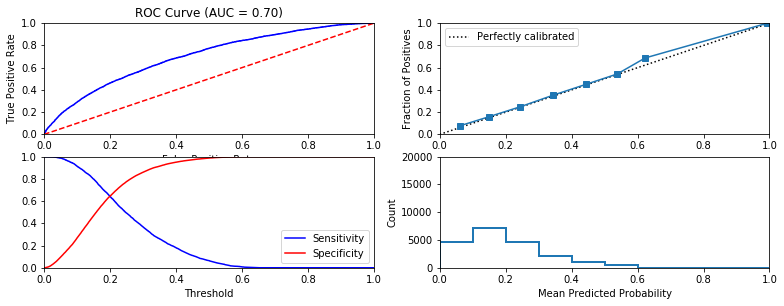


Similarity to LC grade ranking:  0.6744229161229672
Brier score: 0.1496840540467719
  Model: mlp
Fit time: 42.52 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7945
              precision    recall  f1-score   support

  No default     0.7994    0.9892    0.8842     15864
     Default     0.5351    0.0479    0.0879      4136

   micro avg     0.7945    0.7945    0.7945     20000
   macro avg     0.6673    0.5185    0.4860     20000
weighted avg     0.7447    0.7945    0.7195     20000



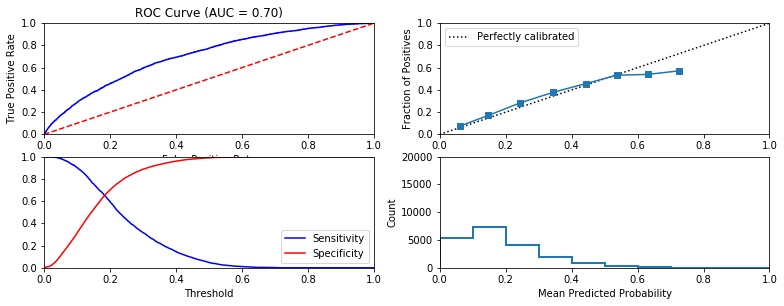


Similarity to LC grade ranking:  0.6799512043292334
Brier score: 0.15040127445619073
  Model: mlp
Fit time: 46.36 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7944
              precision    recall  f1-score   support

  No default     0.7992    0.9885    0.8839     15828
     Default     0.5708    0.0580    0.1053      4172

   micro avg     0.7944    0.7944    0.7944     20000
   macro avg     0.6850    0.5233    0.4946     20000
weighted avg     0.7516    0.7944    0.7215     20000



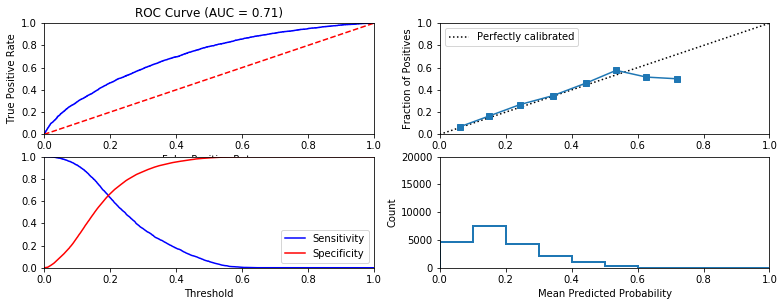


Similarity to LC grade ranking:  0.6951464396602498
Brier score: 0.15017111168412348
  Model: mlp
Fit time: 68.71 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7929
              precision    recall  f1-score   support

  No default     0.8029    0.9784    0.8820     15826
     Default     0.5223    0.0896    0.1530      4174

   micro avg     0.7929    0.7929    0.7929     20000
   macro avg     0.6626    0.5340    0.5175     20000
weighted avg     0.7444    0.7929    0.7299     20000



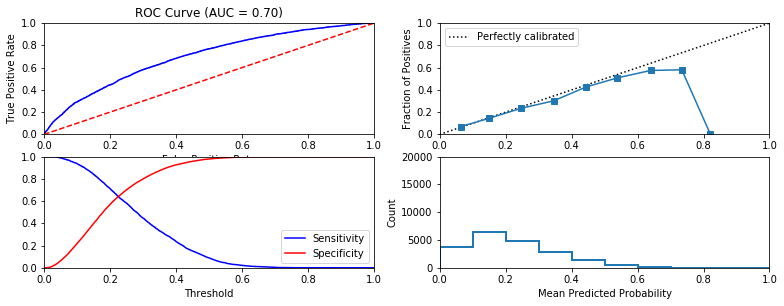


Similarity to LC grade ranking:  0.6467356794177269
Brier score: 0.15188048205190496
  Model: mlp
Fit time: 51.17 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7976
              precision    recall  f1-score   support

  No default     0.8018    0.9901    0.8860     15895
     Default     0.5768    0.0521    0.0956      4105

   micro avg     0.7976    0.7976    0.7976     20000
   macro avg     0.6893    0.5211    0.4908     20000
weighted avg     0.7556    0.7976    0.7238     20000



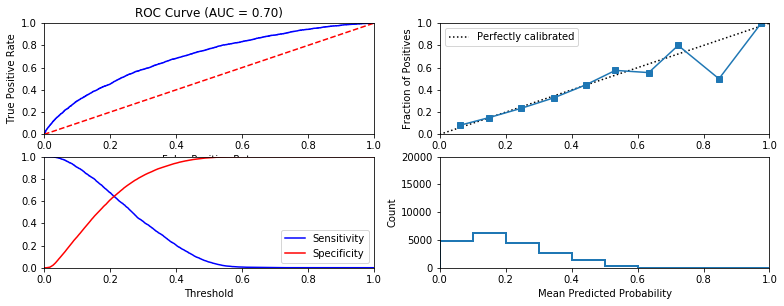


Similarity to LC grade ranking:  0.6863850705631304
Brier score: 0.14917595149726295
  Model: mlp
Fit time: 50.56 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7941
              precision    recall  f1-score   support

  No default     0.8017    0.9838    0.8834     15864
     Default     0.5169    0.0665    0.1178      4136

   micro avg     0.7941    0.7941    0.7941     20000
   macro avg     0.6593    0.5251    0.5006     20000
weighted avg     0.7428    0.7941    0.7251     20000



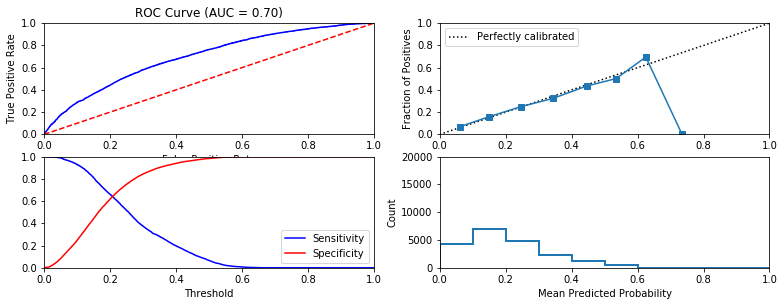


Similarity to LC grade ranking:  0.6730116582151165
Brier score: 0.15077471615956298
  Model: mlp
Fit time: 37.65 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7916
              precision    recall  f1-score   support

  No default     0.8008    0.9807    0.8816     15829
     Default     0.5024    0.0741    0.1291      4171

   micro avg     0.7916    0.7916    0.7916     20000
   macro avg     0.6516    0.5274    0.5054     20000
weighted avg     0.7386    0.7916    0.7247     20000



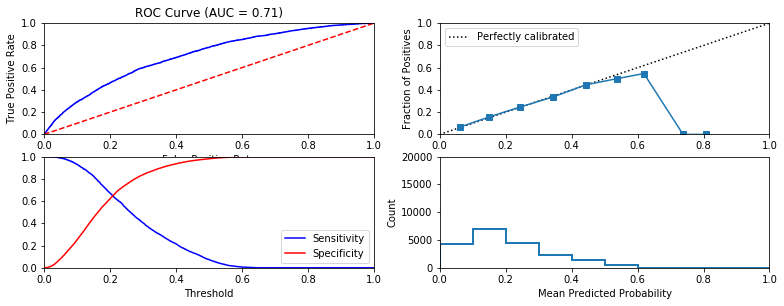


Similarity to LC grade ranking:  0.6943242403614176
Brier score: 0.1503893508324463
  Model: mlp
Fit time: 48.41 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7983
              precision    recall  f1-score   support

  No default     0.8043    0.9870    0.8864     15940
     Default     0.5295    0.0574    0.1036      4060

   micro avg     0.7983    0.7983    0.7983     20000
   macro avg     0.6669    0.5222    0.4950     20000
weighted avg     0.7486    0.7983    0.7275     20000



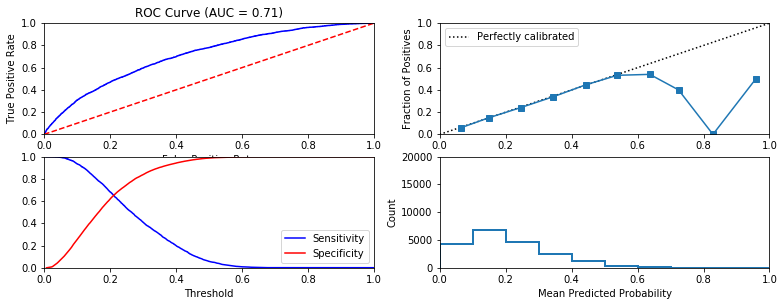


Similarity to LC grade ranking:  0.6969230733311846
Brier score: 0.14681893040924884
  Model: mlp
Fit time: 56.94 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79545
              precision    recall  f1-score   support

  No default     0.8042    0.9800    0.8835     15823
     Default     0.5599    0.0962    0.1642      4177

   micro avg     0.7954    0.7954    0.7955     20000
   macro avg     0.6821    0.5381    0.5239     20000
weighted avg     0.7532    0.7954    0.7333     20000



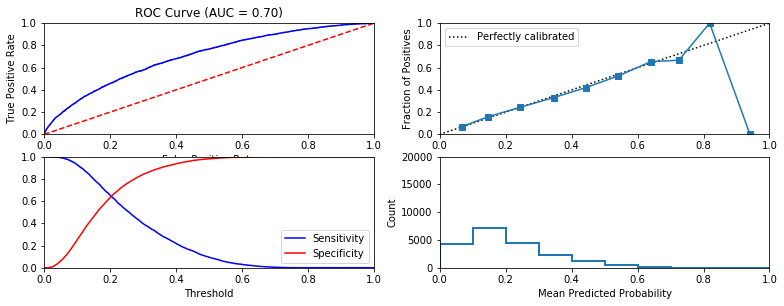


Similarity to LC grade ranking:  0.6782318137266631
Brier score: 0.15050662861242886
  Model: mlp
Fit time: 49.24 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.8022
              precision    recall  f1-score   support

  No default     0.8081    0.9869    0.8886     15990
     Default     0.5572    0.0656    0.1174      4010

   micro avg     0.8022    0.8022    0.8022     20000
   macro avg     0.6827    0.5263    0.5030     20000
weighted avg     0.7578    0.8022    0.7340     20000



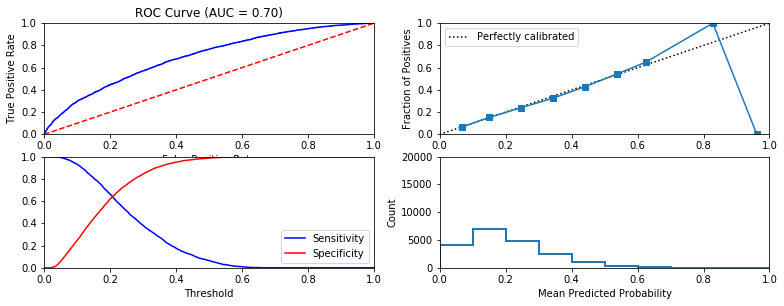


Similarity to LC grade ranking:  0.7005551732058499
Brier score: 0.14719070784529098
  Model: mlp
Fit time: 66.27 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7925
              precision    recall  f1-score   support

  No default     0.8027    0.9780    0.8817     15815
     Default     0.5239    0.0915    0.1558      4185

   micro avg     0.7925    0.7925    0.7925     20000
   macro avg     0.6633    0.5348    0.5188     20000
weighted avg     0.7444    0.7925    0.7298     20000



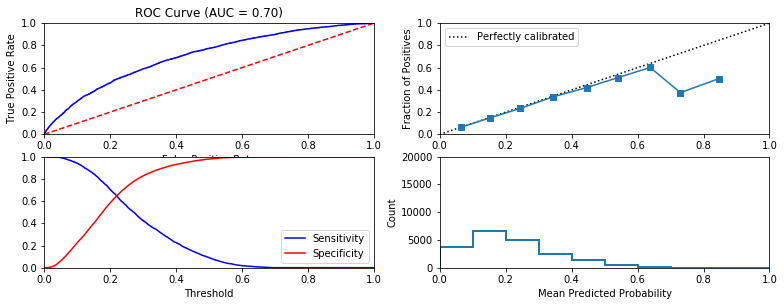


Similarity to LC grade ranking:  0.6646504242166286
Brier score: 0.1509349328132881
  Model: mlp
Fit time: 53.8 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79865
              precision    recall  f1-score   support

  No default     0.8062    0.9843    0.8864     15964
     Default     0.5088    0.0644    0.1144      4036

   micro avg     0.7986    0.7986    0.7986     20000
   macro avg     0.6575    0.5243    0.5004     20000
weighted avg     0.7462    0.7986    0.7306     20000



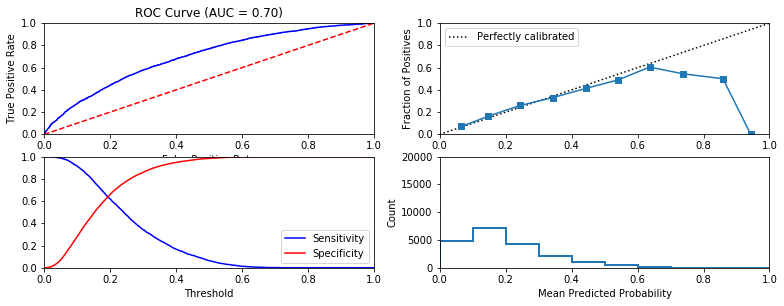


Similarity to LC grade ranking:  0.6697916086900663
Brier score: 0.14860810924819234
  Model: mlp
Fit time: 86.15 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7911
              precision    recall  f1-score   support

  No default     0.7963    0.9889    0.8822     15823
     Default     0.4986    0.0419    0.0773      4177

   micro avg     0.7911    0.7911    0.7911     20000
   macro avg     0.6475    0.5154    0.4798     20000
weighted avg     0.7341    0.7911    0.7141     20000



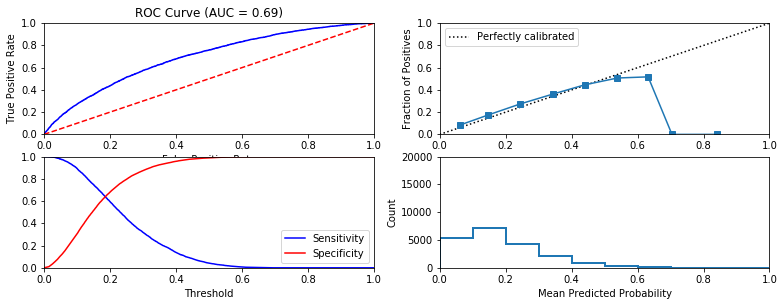


Similarity to LC grade ranking:  0.6358962647736636
Brier score: 0.15323758280603994
  Model: mlp
Fit time: 54.63 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79245
              precision    recall  f1-score   support

  No default     0.7977    0.9884    0.8829     15830
     Default     0.5245    0.0487    0.0891      4170

   micro avg     0.7924    0.7924    0.7924     20000
   macro avg     0.6611    0.5185    0.4860     20000
weighted avg     0.7408    0.7924    0.7174     20000



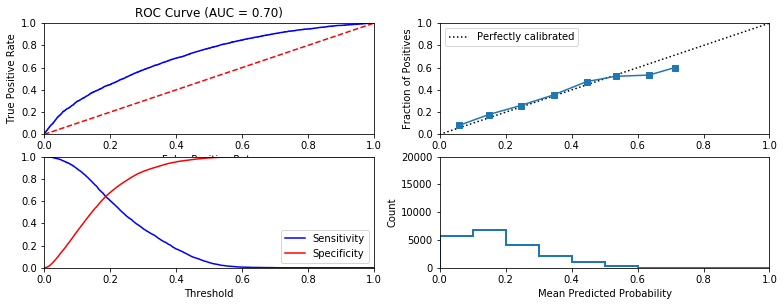


Similarity to LC grade ranking:  0.6590652456180071
Brier score: 0.15138514715534684
  Model: mlp
Fit time: 86.09 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79575
              precision    recall  f1-score   support

  No default     0.8081    0.9750    0.8837     15920
     Default     0.4968    0.0963    0.1614      4080

   micro avg     0.7957    0.7957    0.7957     20000
   macro avg     0.6524    0.5357    0.5225     20000
weighted avg     0.7446    0.7957    0.7364     20000



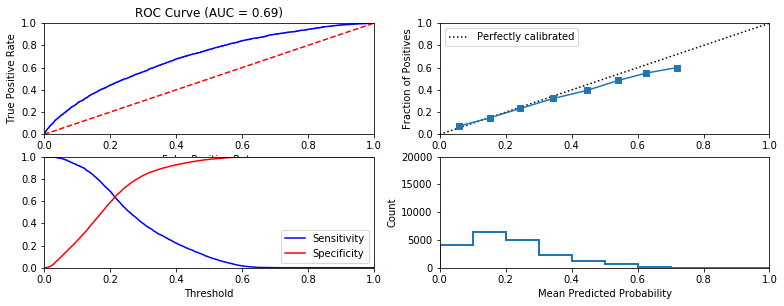


Similarity to LC grade ranking:  0.6412330703664482
Brier score: 0.1501644358805735
  Model: mlp
Fit time: 71.34 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79385
              precision    recall  f1-score   support

  No default     0.8048    0.9768    0.8825     15854
     Default     0.5152    0.0943    0.1594      4146

   micro avg     0.7938    0.7938    0.7938     20000
   macro avg     0.6600    0.5355    0.5210     20000
weighted avg     0.7448    0.7938    0.7326     20000



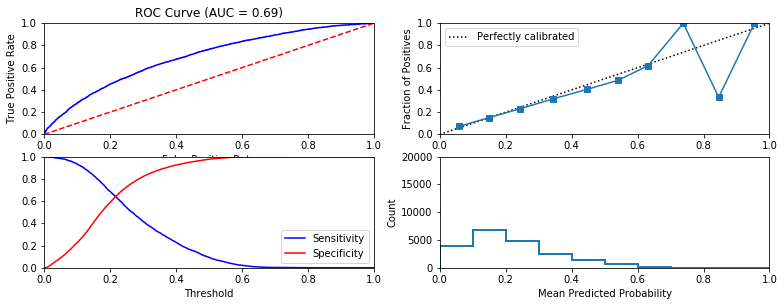


Similarity to LC grade ranking:  0.6474328726289742
Brier score: 0.1514309018719211
  Model: mlp
Fit time: 32.73 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.795
              precision    recall  f1-score   support

  No default     0.8013    0.9863    0.8842     15874
     Default     0.5281    0.0591    0.1064      4126

   micro avg     0.7950    0.7950    0.7950     20000
   macro avg     0.6647    0.5227    0.4953     20000
weighted avg     0.7450    0.7950    0.7237     20000



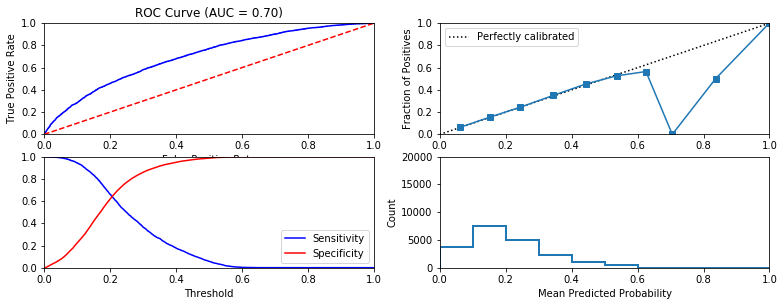


Similarity to LC grade ranking:  0.6669567237753646
Brier score: 0.14969883261407213
  Model: mlp
Fit time: 43.35 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79535
              precision    recall  f1-score   support

  No default     0.8033    0.9828    0.8840     15876
     Default     0.5269    0.0737    0.1293      4124

   micro avg     0.7954    0.7954    0.7954     20000
   macro avg     0.6651    0.5283    0.5067     20000
weighted avg     0.7463    0.7954    0.7284     20000



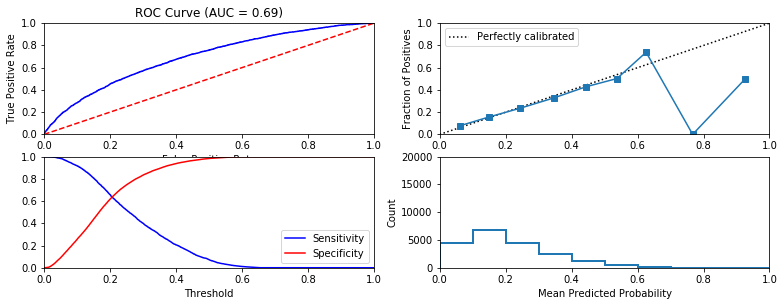


Similarity to LC grade ranking:  0.7049670406999345
Brier score: 0.15062038069825634
  Model: mlp
Fit time: 74.92 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7927
              precision    recall  f1-score   support

  No default     0.7996    0.9846    0.8825     15812
     Default     0.5398    0.0681    0.1209      4188

   micro avg     0.7927    0.7927    0.7927     20000
   macro avg     0.6697    0.5263    0.5017     20000
weighted avg     0.7452    0.7927    0.7230     20000



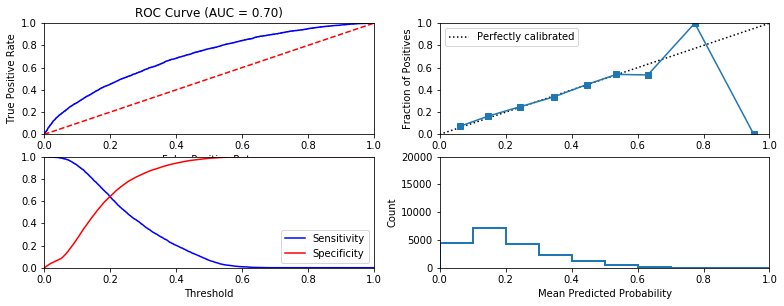


Similarity to LC grade ranking:  0.7031281459109852
Brier score: 0.1515075535855479
  Model: mlp
Fit time: 59.29 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7933
              precision    recall  f1-score   support

  No default     0.8001    0.9844    0.8827     15802
     Default     0.5573    0.0741    0.1308      4198

   micro avg     0.7933    0.7933    0.7933     20000
   macro avg     0.6787    0.5292    0.5067     20000
weighted avg     0.7491    0.7933    0.7249     20000



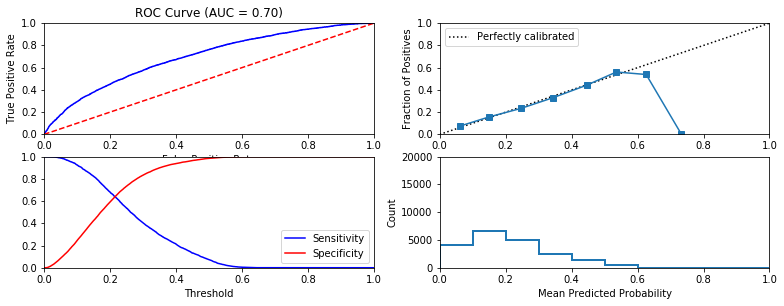


Similarity to LC grade ranking:  0.6784559600747521
Brier score: 0.15187762054476808
  Model: mlp
Fit time: 52.6 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7933
              precision    recall  f1-score   support

  No default     0.8000    0.9859    0.8833     15869
     Default     0.4966    0.0533    0.0962      4131

   micro avg     0.7933    0.7933    0.7933     20000
   macro avg     0.6483    0.5196    0.4898     20000
weighted avg     0.7374    0.7933    0.7207     20000



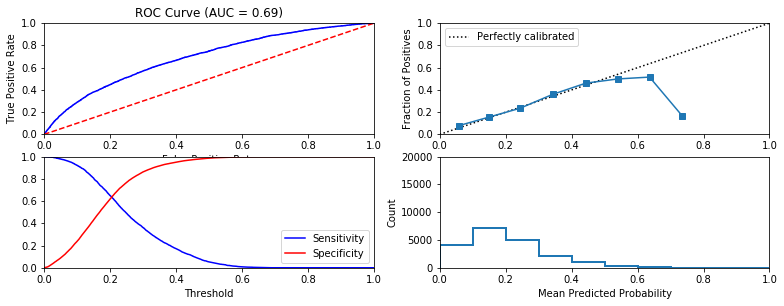


Similarity to LC grade ranking:  0.6549887339767021
Brier score: 0.15129773418048156
  Model: mlp
Fit time: 59.56 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7936
              precision    recall  f1-score   support

  No default     0.7987    0.9892    0.8838     15869
     Default     0.5043    0.0424    0.0782      4131

   micro avg     0.7936    0.7936    0.7936     20000
   macro avg     0.6515    0.5158    0.4810     20000
weighted avg     0.7379    0.7936    0.7174     20000



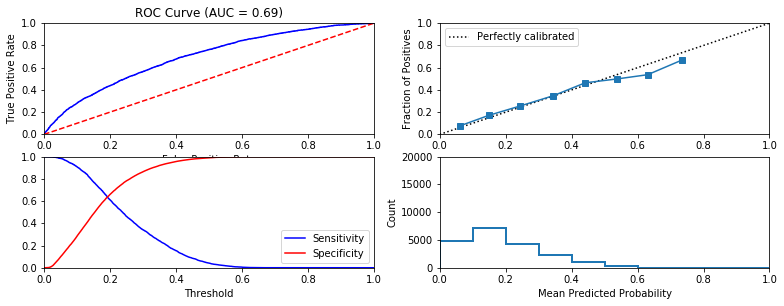


Similarity to LC grade ranking:  0.6701974708040005
Brier score: 0.15129247127854276
  Model: mlp
Fit time: 46.37 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79775
              precision    recall  f1-score   support

  No default     0.8015    0.9909    0.8862     15897
     Default     0.5833    0.0495    0.0912      4103

   micro avg     0.7977    0.7977    0.7977     20000
   macro avg     0.6924    0.5202    0.4887     20000
weighted avg     0.7568    0.7977    0.7231     20000



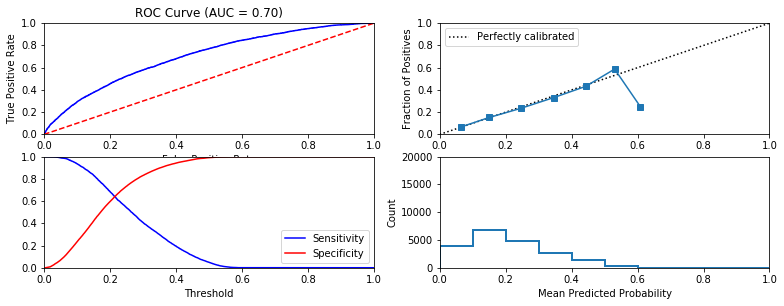


Similarity to LC grade ranking:  0.7090603132644867
Brier score: 0.1492414682918697
  Model: mlp
Fit time: 28.31 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79975
              precision    recall  f1-score   support

  No default     0.8015    0.9959    0.8882     15971
     Default     0.5769    0.0223    0.0430      4029

   micro avg     0.7997    0.7997    0.7997     20000
   macro avg     0.6892    0.5091    0.4656     20000
weighted avg     0.7563    0.7997    0.7179     20000



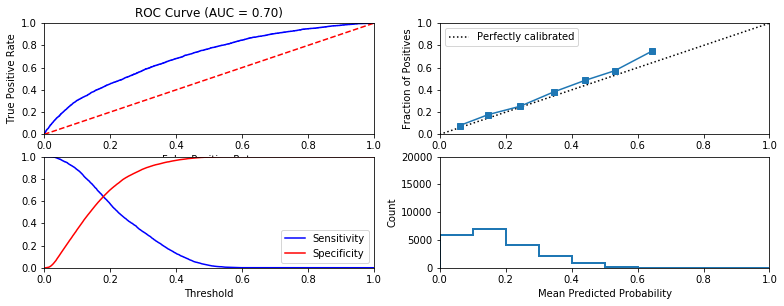


Similarity to LC grade ranking:  0.7138961900949754
Brier score: 0.14770963088909175
  Model: mlp
Fit time: 52.93 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79235
              precision    recall  f1-score   support

  No default     0.8017    0.9798    0.8818     15817
     Default     0.5225    0.0834    0.1439      4183

   micro avg     0.7923    0.7923    0.7923     20000
   macro avg     0.6621    0.5316    0.5129     20000
weighted avg     0.7433    0.7923    0.7275     20000



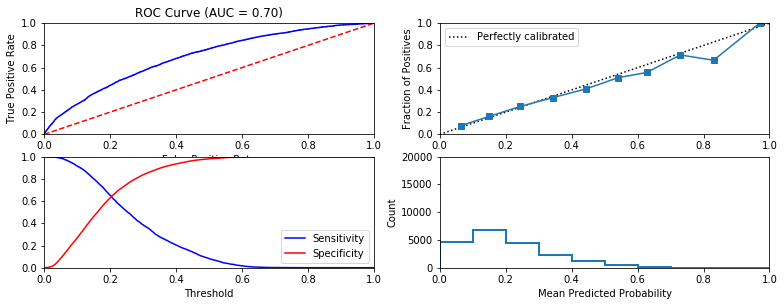


Similarity to LC grade ranking:  0.7037490623688557
Brier score: 0.1521767339495406
  Model: mlp
Fit time: 30.09 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7996
              precision    recall  f1-score   support

  No default     0.8043    0.9895    0.8873     15950
     Default     0.5556    0.0519    0.0949      4050

   micro avg     0.7996    0.7996    0.7996     20000
   macro avg     0.6799    0.5207    0.4911     20000
weighted avg     0.7539    0.7996    0.7269     20000



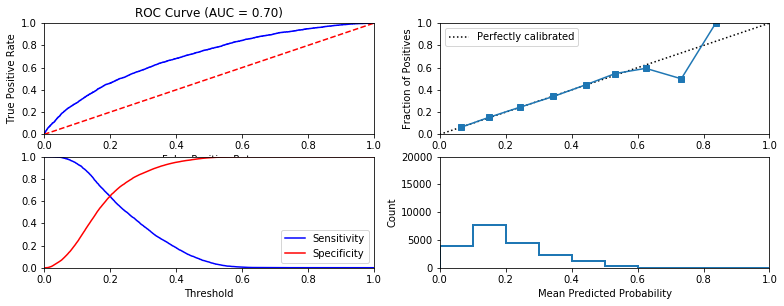


Similarity to LC grade ranking:  0.6929320282858603
Brier score: 0.14771041569100654
  Model: mlp
Fit time: 56.13 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79065
              precision    recall  f1-score   support

  No default     0.8046    0.9702    0.8797     15773
     Default     0.5204    0.1207    0.1959      4227

   micro avg     0.7906    0.7906    0.7906     20000
   macro avg     0.6625    0.5454    0.5378     20000
weighted avg     0.7445    0.7906    0.7351     20000



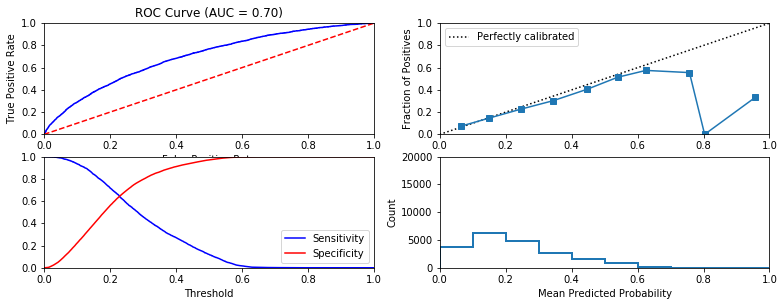


Similarity to LC grade ranking:  0.6812416600837738
Brier score: 0.15291570194712562
  Model: mlp
Fit time: 34.3 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7972
              precision    recall  f1-score   support

  No default     0.8078    0.9784    0.8850     15944
     Default     0.5000    0.0848    0.1450      4056

   micro avg     0.7972    0.7972    0.7972     20000
   macro avg     0.6539    0.5316    0.5150     20000
weighted avg     0.7454    0.7972    0.7349     20000



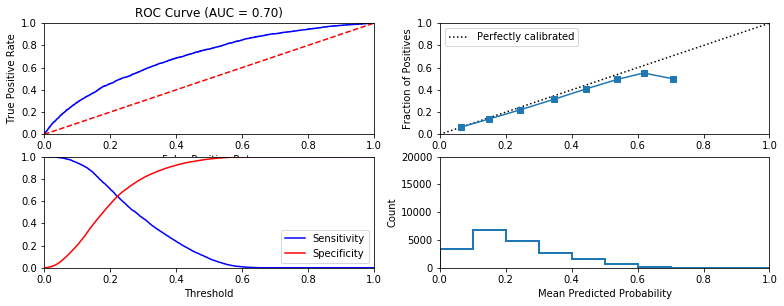


Similarity to LC grade ranking:  0.7063218180773995
Brier score: 0.148850360534244
  Model: mlp
Fit time: 68.21 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7895
              precision    recall  f1-score   support

  No default     0.8083    0.9631    0.8790     15874
     Default     0.4613    0.1214    0.1922      4126

   micro avg     0.7895    0.7895    0.7895     20000
   macro avg     0.6348    0.5423    0.5356     20000
weighted avg     0.7368    0.7895    0.7373     20000



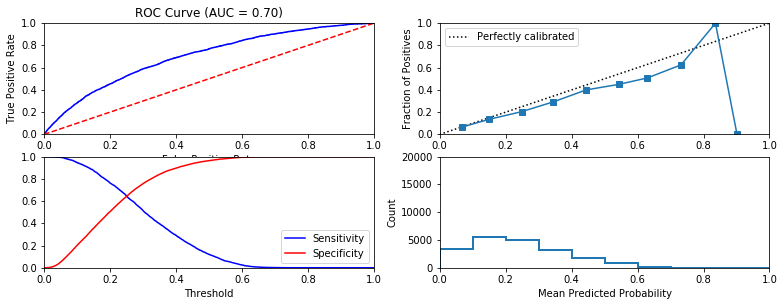


Similarity to LC grade ranking:  0.6783523284670835
Brier score: 0.15181809325894416
  Model: mlp
Fit time: 33.98 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.801
              precision    recall  f1-score   support

  No default     0.8058    0.9892    0.8881     15972
     Default     0.5612    0.0546    0.0995      4028

   micro avg     0.8010    0.8010    0.8010     20000
   macro avg     0.6835    0.5219    0.4938     20000
weighted avg     0.7565    0.8010    0.7293     20000



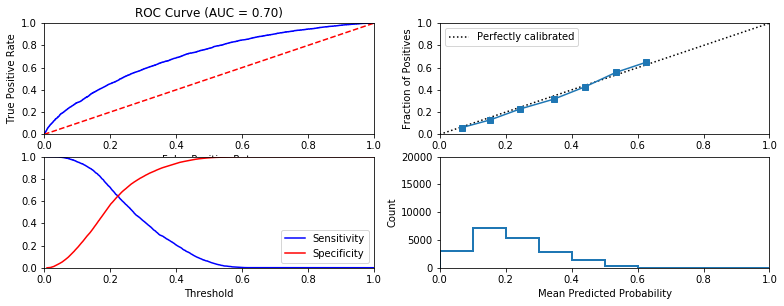


Similarity to LC grade ranking:  0.6975359717526588
Brier score: 0.14752283710509384
  Model: mlp
Fit time: 101.98 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.78685
              precision    recall  f1-score   support

  No default     0.7994    0.9740    0.8781     15764
     Default     0.4830    0.0904    0.1523      4236

   micro avg     0.7869    0.7869    0.7869     20000
   macro avg     0.6412    0.5322    0.5152     20000
weighted avg     0.7324    0.7869    0.7244     20000



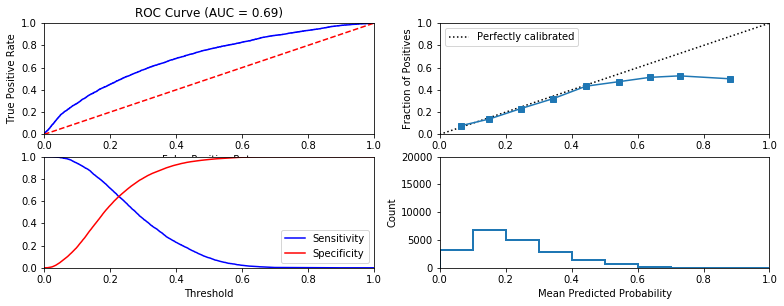


Similarity to LC grade ranking:  0.6701456375904552
Brier score: 0.15401071663925409
  Model: mlp
Fit time: 53.62 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79475
              precision    recall  f1-score   support

  No default     0.8033    0.9817    0.8836     15865
     Default     0.5245    0.0776    0.1352      4135

   micro avg     0.7947    0.7947    0.7947     20000
   macro avg     0.6639    0.5296    0.5094     20000
weighted avg     0.7456    0.7947    0.7288     20000



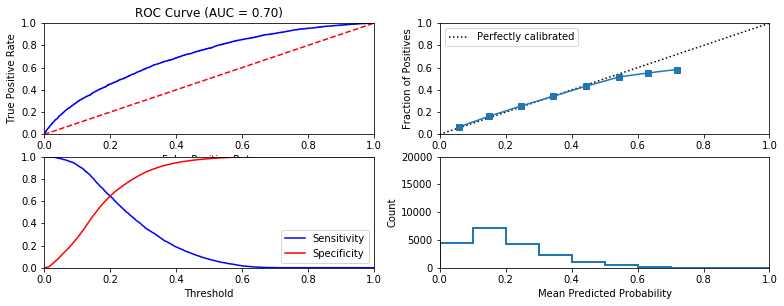


Similarity to LC grade ranking:  0.659147908610957
Brier score: 0.15001330617430444
  Model: mlp
Fit time: 42.06 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79585
              precision    recall  f1-score   support

  No default     0.8030    0.9853    0.8849     15925
     Default     0.4913    0.0555    0.0997      4075

   micro avg     0.7958    0.7958    0.7958     20000
   macro avg     0.6472    0.5204    0.4923     20000
weighted avg     0.7395    0.7958    0.7249     20000



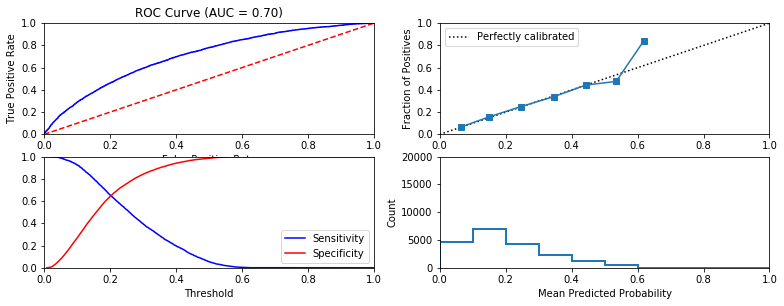


Similarity to LC grade ranking:  0.7162164828658466
Brier score: 0.14811099070772338
  Model: mlp
Fit time: 42.75 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7959
              precision    recall  f1-score   support

  No default     0.8024    0.9862    0.8848     15898
     Default     0.5217    0.0585    0.1052      4102

   micro avg     0.7959    0.7959    0.7959     20000
   macro avg     0.6620    0.5223    0.4950     20000
weighted avg     0.7448    0.7959    0.7249     20000



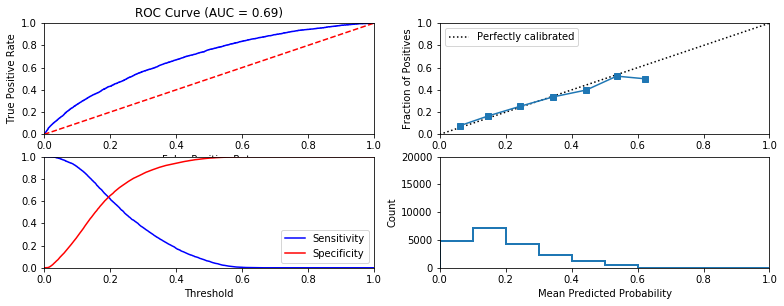


Similarity to LC grade ranking:  0.6817801921219602
Brier score: 0.15137648403887538
  Model: mlp
Fit time: 29.23 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79565
              precision    recall  f1-score   support

  No default     0.8033    0.9834    0.8843     15883
     Default     0.5270    0.0712    0.1254      4117

   micro avg     0.7956    0.7956    0.7956     20000
   macro avg     0.6652    0.5273    0.5049     20000
weighted avg     0.7464    0.7956    0.7281     20000



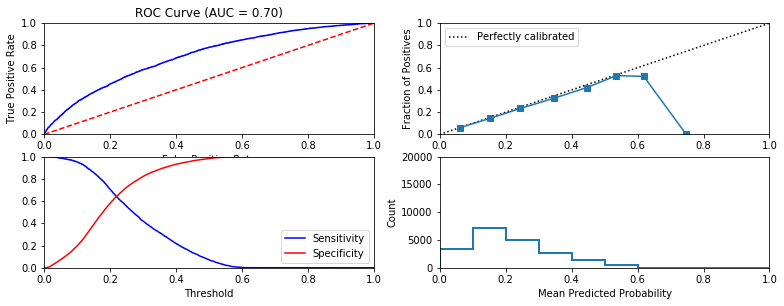


Similarity to LC grade ranking:  0.7016505745035044
Brier score: 0.14977624129062014
  Model: mlp
Fit time: 41.6 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79485
              precision    recall  f1-score   support

  No default     0.7999    0.9890    0.8845     15879
     Default     0.5245    0.0468    0.0860      4121

   micro avg     0.7948    0.7948    0.7948     20000
   macro avg     0.6622    0.5179    0.4852     20000
weighted avg     0.7432    0.7948    0.7199     20000



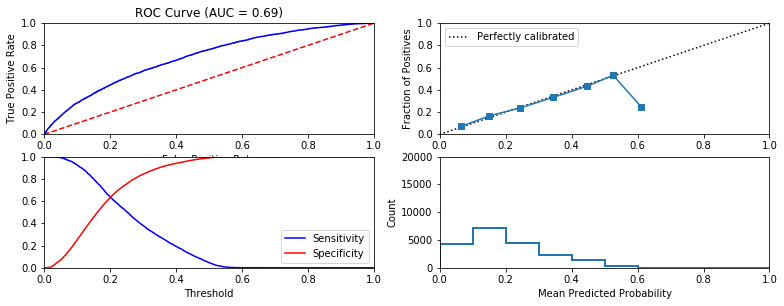


Similarity to LC grade ranking:  0.6939116151461188
Brier score: 0.15079339622132334
  Model: mlp
Fit time: 84.07 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7941
              precision    recall  f1-score   support

  No default     0.8033    0.9811    0.8834     15894
     Default     0.4898    0.0701    0.1227      4106

   micro avg     0.7941    0.7941    0.7941     20000
   macro avg     0.6466    0.5256    0.5030     20000
weighted avg     0.7390    0.7941    0.7272     20000



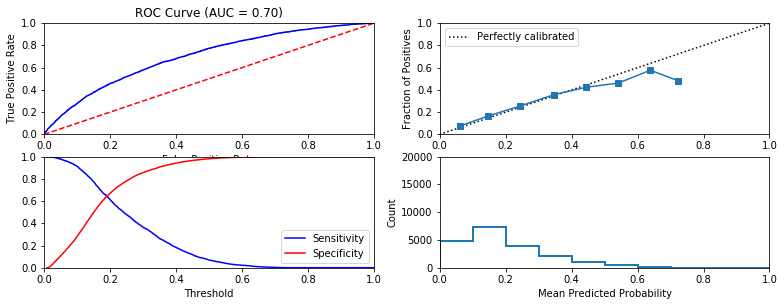


Similarity to LC grade ranking:  0.6617450141188749
Brier score: 0.15037928092215885
  Model: mlp
Fit time: 74.02 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79785
              precision    recall  f1-score   support

  No default     0.8050    0.9846    0.8858     15923
     Default     0.5324    0.0684    0.1213      4077

   micro avg     0.7978    0.7978    0.7978     20000
   macro avg     0.6687    0.5265    0.5035     20000
weighted avg     0.7494    0.7978    0.7299     20000



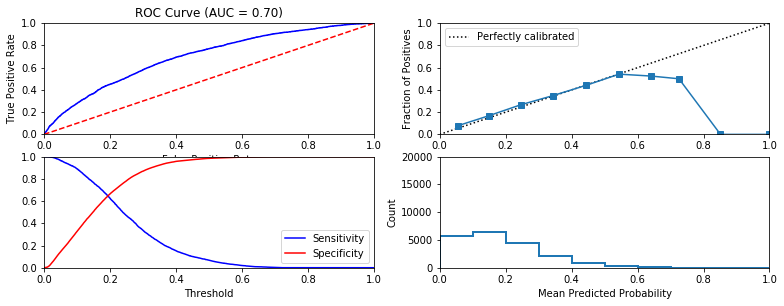


Similarity to LC grade ranking:  0.6964727477934212
Brier score: 0.14961652988362925
  Model: mlp
Fit time: 41.14 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79195
              precision    recall  f1-score   support

  No default     0.7927    0.9981    0.8836     15825
     Default     0.5946    0.0105    0.0207      4175

   micro avg     0.7920    0.7920    0.7920     20000
   macro avg     0.6936    0.5043    0.4522     20000
weighted avg     0.7513    0.7920    0.7035     20000



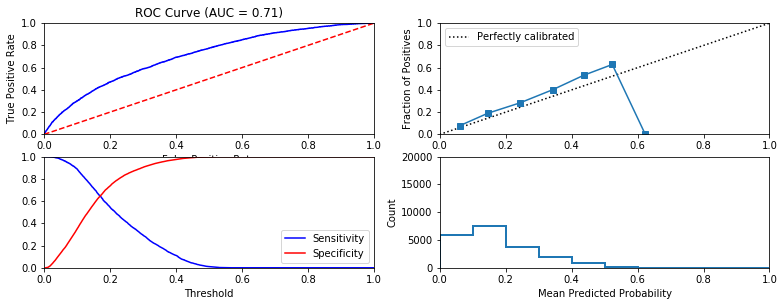


Similarity to LC grade ranking:  0.7017464853249556
Brier score: 0.15162812300175438
  Model: mlp
Fit time: 38.86 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79145
              precision    recall  f1-score   support

  No default     0.7963    0.9885    0.8820     15774
     Default     0.5656    0.0561    0.1020      4226

   micro avg     0.7914    0.7914    0.7914     20000
   macro avg     0.6810    0.5223    0.4920     20000
weighted avg     0.7475    0.7914    0.7172     20000



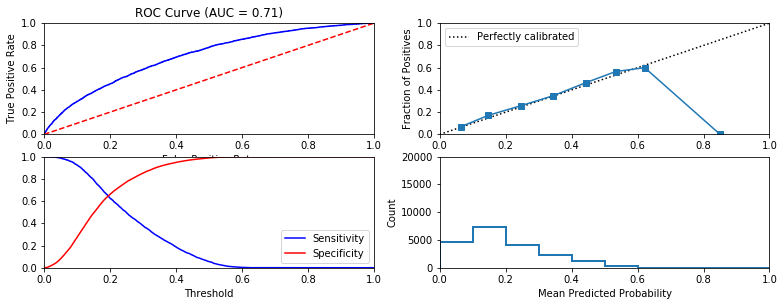


Similarity to LC grade ranking:  0.6815948161099133
Brier score: 0.1517005427247654
  Model: mlp
Fit time: 73.11 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7985
              precision    recall  f1-score   support

  No default     0.8094    0.9784    0.8859     15990
     Default     0.4851    0.0813    0.1393      4010

   micro avg     0.7985    0.7985    0.7985     20000
   macro avg     0.6473    0.5298    0.5126     20000
weighted avg     0.7444    0.7985    0.7362     20000



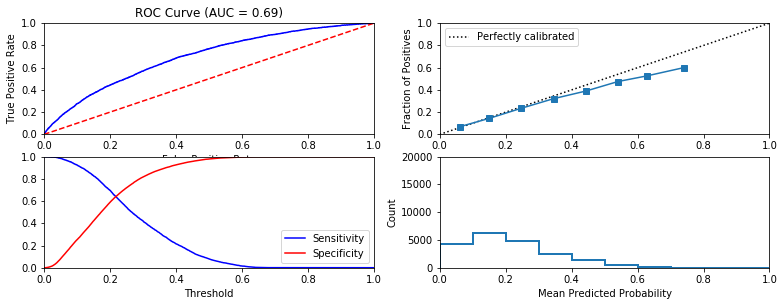


Similarity to LC grade ranking:  0.6668784612631921
Brier score: 0.14851008984525052
  Model: mlp
Fit time: 72.89 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79175
              precision    recall  f1-score   support

  No default     0.7990    0.9840    0.8819     15805
     Default     0.5280    0.0675    0.1196      4195

   micro avg     0.7917    0.7917    0.7917     20000
   macro avg     0.6635    0.5257    0.5008     20000
weighted avg     0.7422    0.7917    0.7220     20000



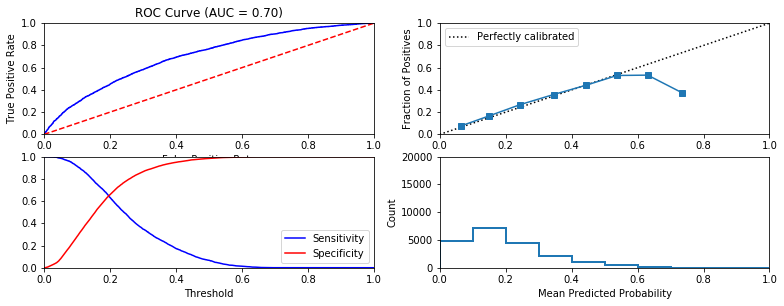


Similarity to LC grade ranking:  0.6774603098352366
Brier score: 0.15189693948942581
  Model: mlp
Fit time: 94.73 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79575
              precision    recall  f1-score   support

  No default     0.8036    0.9832    0.8843     15885
     Default     0.5266    0.0722    0.1270      4115

   micro avg     0.7957    0.7957    0.7957     20000
   macro avg     0.6651    0.5277    0.5056     20000
weighted avg     0.7466    0.7957    0.7285     20000



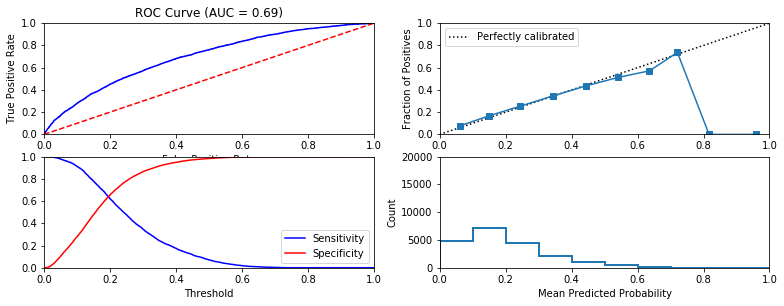


Similarity to LC grade ranking:  0.6660489154778321
Brier score: 0.1505071965672007
  Model: mlp
Fit time: 43.82 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.78775
              precision    recall  f1-score   support

  No default     0.8110    0.9539    0.8766     15812
     Default     0.4797    0.1605    0.2405      4188

   micro avg     0.7877    0.7877    0.7877     20000
   macro avg     0.6453    0.5572    0.5586     20000
weighted avg     0.7416    0.7877    0.7434     20000



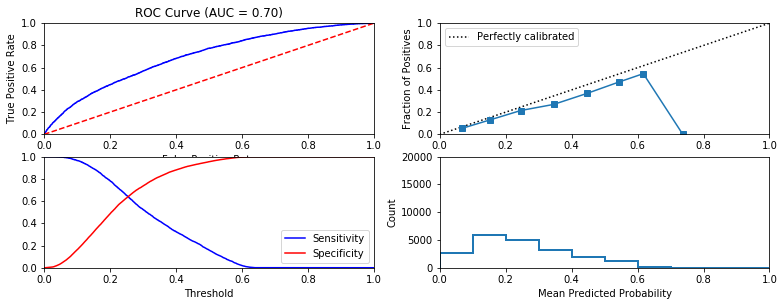


Similarity to LC grade ranking:  0.6890450129783778
Brier score: 0.1538628285045834
  Model: mlp
Fit time: 62.41 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7934
              precision    recall  f1-score   support

  No default     0.8035    0.9786    0.8824     15844
     Default     0.5171    0.0873    0.1494      4156

   micro avg     0.7934    0.7934    0.7934     20000
   macro avg     0.6603    0.5330    0.5159     20000
weighted avg     0.7439    0.7934    0.7301     20000



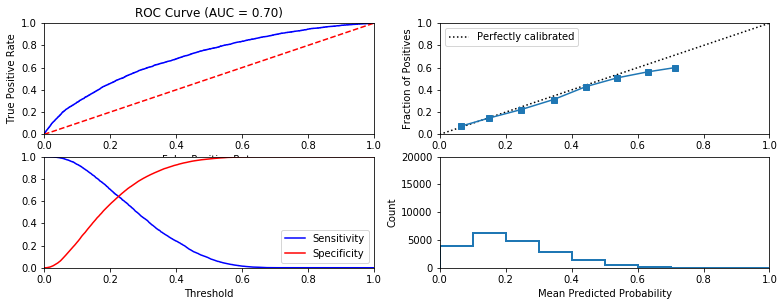


Similarity to LC grade ranking:  0.6636241634468353
Brier score: 0.1510331046643704
  Model: mlp
Fit time: 86.14 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79465
              precision    recall  f1-score   support

  No default     0.8090    0.9711    0.8827     15909
     Default     0.4911    0.1083    0.1774      4091

   micro avg     0.7946    0.7946    0.7946     20000
   macro avg     0.6501    0.5397    0.5301     20000
weighted avg     0.7440    0.7946    0.7384     20000



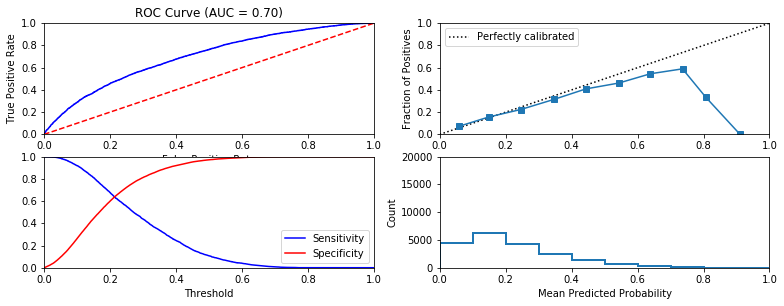


Similarity to LC grade ranking:  0.6286858720308811
Brier score: 0.1501291891158589
  Model: mlp
Fit time: 48.57 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7943
              precision    recall  f1-score   support

  No default     0.8011    0.9858    0.8839     15885
     Default     0.5011    0.0549    0.0990      4115

   micro avg     0.7943    0.7943    0.7943     20000
   macro avg     0.6511    0.5204    0.4914     20000
weighted avg     0.7393    0.7943    0.7224     20000



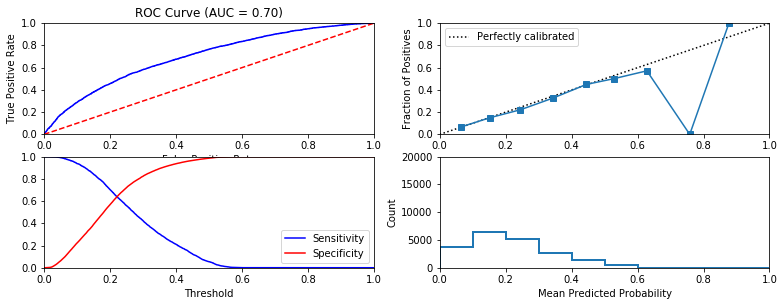


Similarity to LC grade ranking:  0.6849155142645221
Brier score: 0.1500334711647243
  Model: mlp
Fit time: 100.75 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79505
              precision    recall  f1-score   support

  No default     0.8018    0.9849    0.8840     15853
     Default     0.5455    0.0694    0.1232      4147

   micro avg     0.7951    0.7951    0.7951     20000
   macro avg     0.6736    0.5272    0.5036     20000
weighted avg     0.7487    0.7951    0.7262     20000



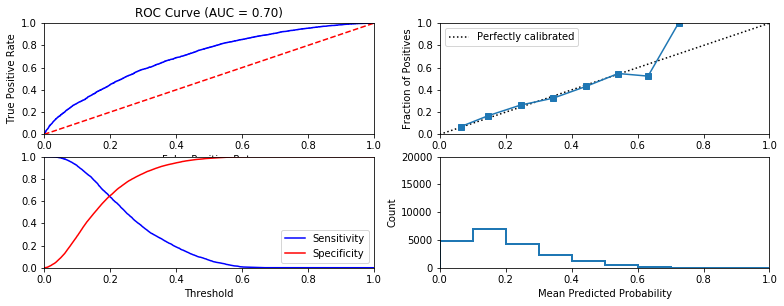


Similarity to LC grade ranking:  0.6777802078563729
Brier score: 0.15042642333782275
  Model: mlp
Fit time: 51.3 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7961
              precision    recall  f1-score   support

  No default     0.8023    0.9864    0.8848     15884
     Default     0.5404    0.0617    0.1108      4116

   micro avg     0.7961    0.7961    0.7961     20000
   macro avg     0.6713    0.5241    0.4978     20000
weighted avg     0.7484    0.7961    0.7255     20000



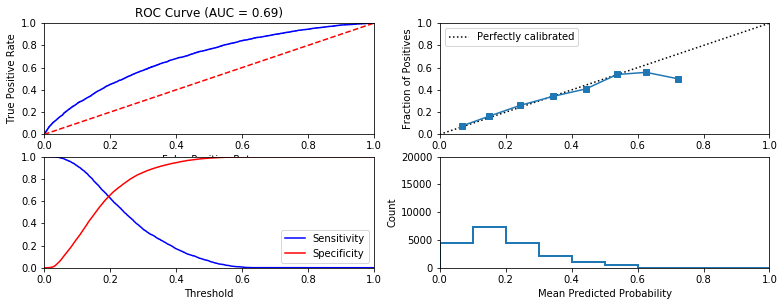


Similarity to LC grade ranking:  0.6852822102186041
Brier score: 0.15062649067460254
  Model: mlp
Fit time: 49.24 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.791
              precision    recall  f1-score   support

  No default     0.7976    0.9858    0.8817     15806
     Default     0.5151    0.0570    0.1026      4194

   micro avg     0.7910    0.7910    0.7910     20000
   macro avg     0.6563    0.5214    0.4922     20000
weighted avg     0.7383    0.7910    0.7183     20000



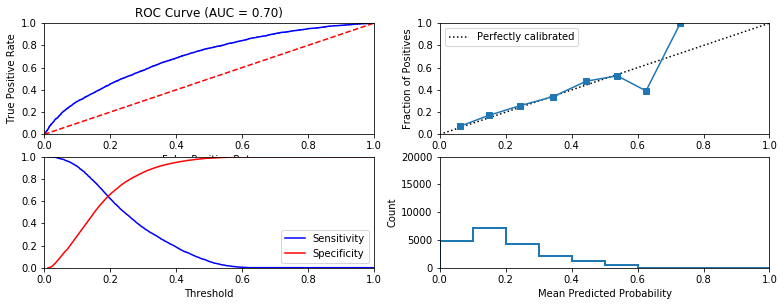


Similarity to LC grade ranking:  0.7019785795889584
Brier score: 0.1517965337917769
  Model: mlp
Fit time: 77.94 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7962
              precision    recall  f1-score   support

  No default     0.8061    0.9790    0.8842     15894
     Default     0.5216    0.0884    0.1512      4106

   micro avg     0.7962    0.7962    0.7962     20000
   macro avg     0.6638    0.5337    0.5177     20000
weighted avg     0.7477    0.7962    0.7337     20000



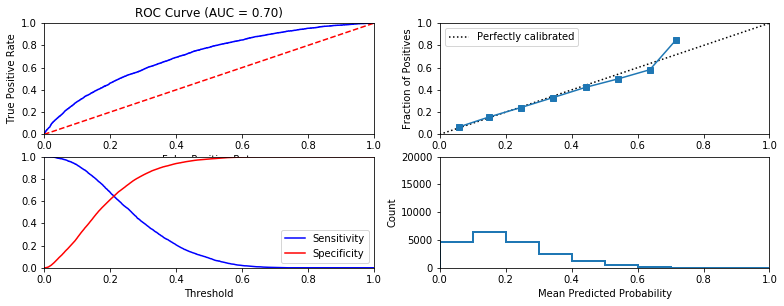


Similarity to LC grade ranking:  0.6547786383066014
Brier score: 0.14893088134356425
  Model: mlp
Fit time: 47.53 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7966
              precision    recall  f1-score   support

  No default     0.7996    0.9933    0.8860     15908
     Default     0.5504    0.0320    0.0605      4092

   micro avg     0.7966    0.7966    0.7966     20000
   macro avg     0.6750    0.5126    0.4732     20000
weighted avg     0.7486    0.7966    0.7171     20000



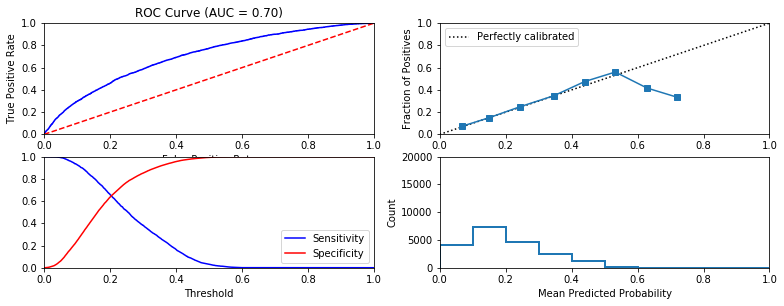


Similarity to LC grade ranking:  0.661112897169241
Brier score: 0.14864099751494586
  Model: mlp
Fit time: 37.13 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79475
              precision    recall  f1-score   support

  No default     0.8025    0.9829    0.8836     15849
     Default     0.5391    0.0764    0.1338      4151

   micro avg     0.7947    0.7947    0.7947     20000
   macro avg     0.6708    0.5296    0.5087     20000
weighted avg     0.7478    0.7947    0.7280     20000



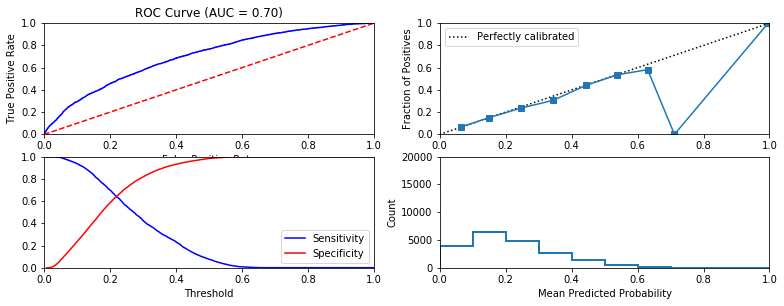


Similarity to LC grade ranking:  0.6886193398108963
Brier score: 0.15038066243805265
  Model: mlp
Fit time: 55.23 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7869
              precision    recall  f1-score   support

  No default     0.7885    0.9960    0.8802     15715
     Default     0.5772    0.0201    0.0388      4285

   micro avg     0.7869    0.7869    0.7869     20000
   macro avg     0.6828    0.5080    0.4595     20000
weighted avg     0.7432    0.7869    0.6999     20000



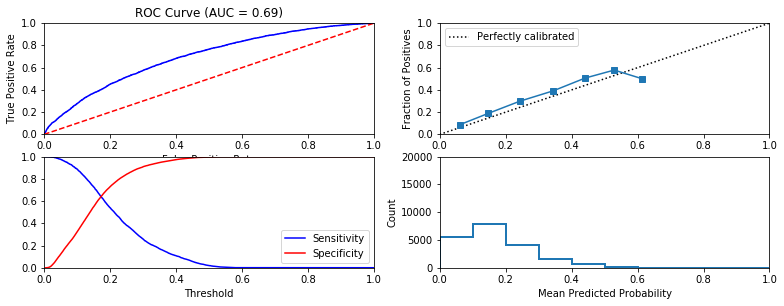


Similarity to LC grade ranking:  0.6839822171893835
Brier score: 0.15628944811748874
  Model: mlp
Fit time: 72.86 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79165
              precision    recall  f1-score   support

  No default     0.7983    0.9864    0.8824     15852
     Default     0.4769    0.0473    0.0860      4148

   micro avg     0.7916    0.7916    0.7916     20000
   macro avg     0.6376    0.5168    0.4842     20000
weighted avg     0.7316    0.7916    0.7172     20000



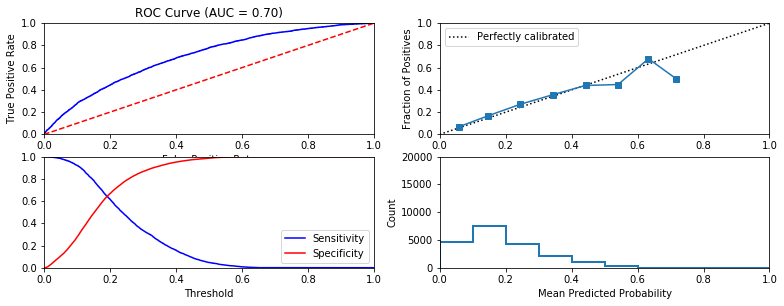


Similarity to LC grade ranking:  0.685573113277582
Brier score: 0.1515351113497086
  Model: mlp
Fit time: 74.74 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7934
              precision    recall  f1-score   support

  No default     0.8030    0.9800    0.8827     15866
     Default     0.5016    0.0772    0.1338      4134

   micro avg     0.7934    0.7934    0.7934     20000
   macro avg     0.6523    0.5286    0.5082     20000
weighted avg     0.7407    0.7934    0.7279     20000



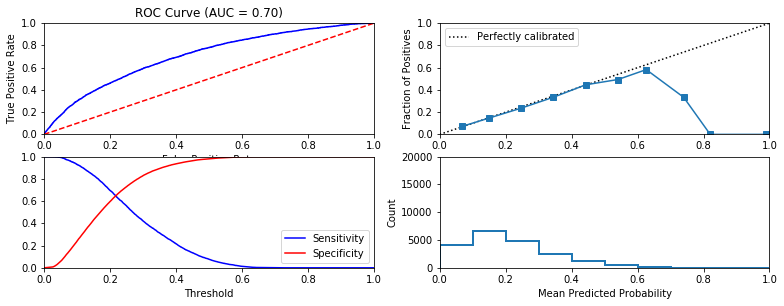


Similarity to LC grade ranking:  0.6637659168016558
Brier score: 0.14967650514135308
  Model: mlp
Fit time: 59.47 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79335
              precision    recall  f1-score   support

  No default     0.8034    0.9783    0.8823     15833
     Default     0.5236    0.0905    0.1543      4167

   micro avg     0.7933    0.7933    0.7934     20000
   macro avg     0.6635    0.5344    0.5183     20000
weighted avg     0.7451    0.7933    0.7306     20000



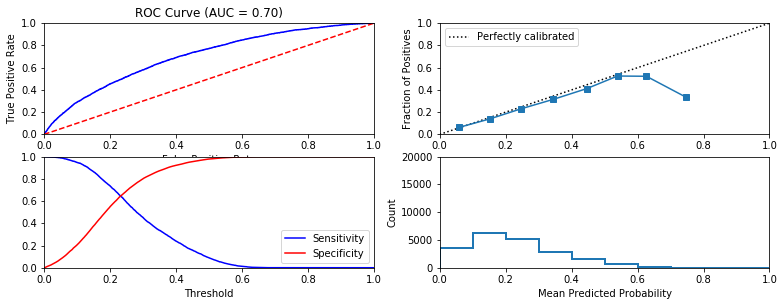


Similarity to LC grade ranking:  0.6452203597095881
Brier score: 0.15128461599052606
  Model: mlp
Fit time: 45.12 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79285
              precision    recall  f1-score   support

  No default     0.7981    0.9879    0.8829     15810
     Default     0.5548    0.0568    0.1031      4190

   micro avg     0.7929    0.7929    0.7929     20000
   macro avg     0.6764    0.5224    0.4930     20000
weighted avg     0.7471    0.7929    0.7195     20000



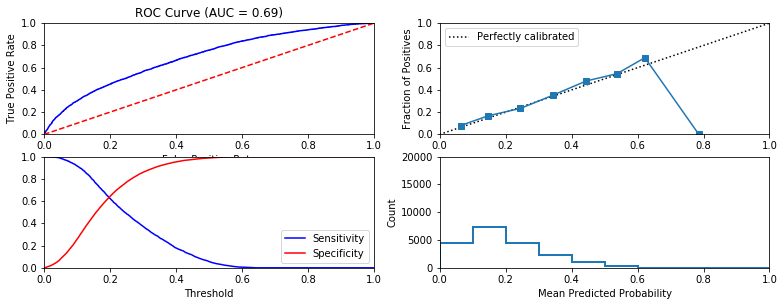


Similarity to LC grade ranking:  0.662610204898787
Brier score: 0.15167453195562974
  Model: mlp
Fit time: 87.87 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79345
              precision    recall  f1-score   support

  No default     0.8069    0.9724    0.8820     15872
     Default     0.4983    0.1054    0.1740      4128

   micro avg     0.7934    0.7934    0.7934     20000
   macro avg     0.6526    0.5389    0.5280     20000
weighted avg     0.7432    0.7934    0.7358     20000



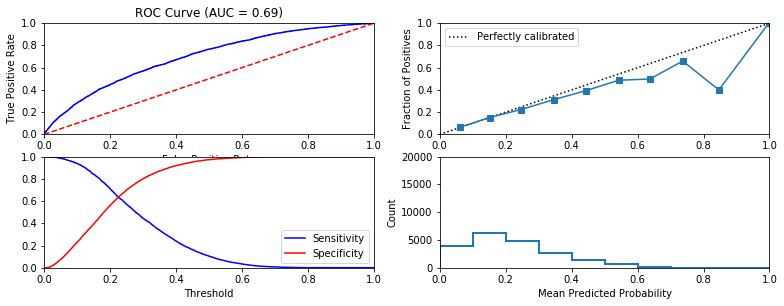


Similarity to LC grade ranking:  0.6806971141346421
Brier score: 0.15149201120834663
  Model: mlp
Fit time: 45.11 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79025
              precision    recall  f1-score   support

  No default     0.7957    0.9880    0.8815     15790
     Default     0.5190    0.0487    0.0890      4210

   micro avg     0.7903    0.7903    0.7903     20000
   macro avg     0.6574    0.5183    0.4853     20000
weighted avg     0.7375    0.7903    0.7147     20000



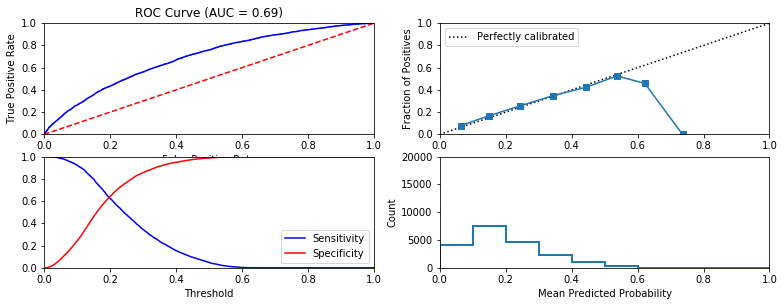


Similarity to LC grade ranking:  0.6817161124399482
Brier score: 0.15411308904827625
  Model: mlp
Fit time: 33.63 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.78945
              precision    recall  f1-score   support

  No default     0.8016    0.9754    0.8800     15828
     Default     0.4736    0.0839    0.1425      4172

   micro avg     0.7894    0.7894    0.7895     20000
   macro avg     0.6376    0.5297    0.5113     20000
weighted avg     0.7332    0.7894    0.7262     20000



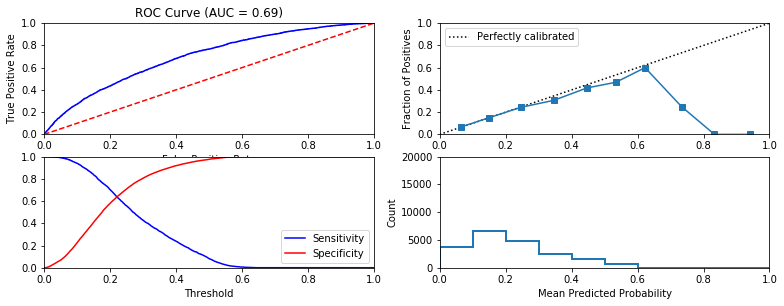


Similarity to LC grade ranking:  0.6864744644215439
Brier score: 0.15254870901757042
  Model: mlp
Fit time: 45.99 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7972
              precision    recall  f1-score   support

  No default     0.8001    0.9935    0.8864     15923
     Default     0.5463    0.0304    0.0576      4077

   micro avg     0.7972    0.7972    0.7972     20000
   macro avg     0.6732    0.5120    0.4720     20000
weighted avg     0.7483    0.7972    0.7174     20000



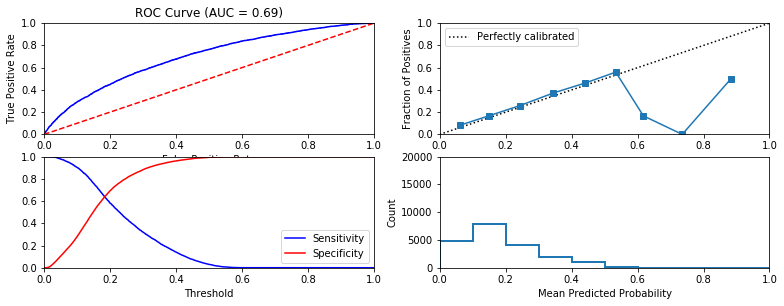


Similarity to LC grade ranking:  0.7151863500980828
Brier score: 0.1495483414835118
  Model: mlp
Fit time: 72.91 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (40, 60), 'learning_rate': 'adaptive', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79285
              precision    recall  f1-score   support

  No default     0.7984    0.9880    0.8831     15842
     Default     0.5190    0.0493    0.0901      4158

   micro avg     0.7929    0.7929    0.7929     20000
   macro avg     0.6587    0.5187    0.4866     20000
weighted avg     0.7403    0.7929    0.7182     20000



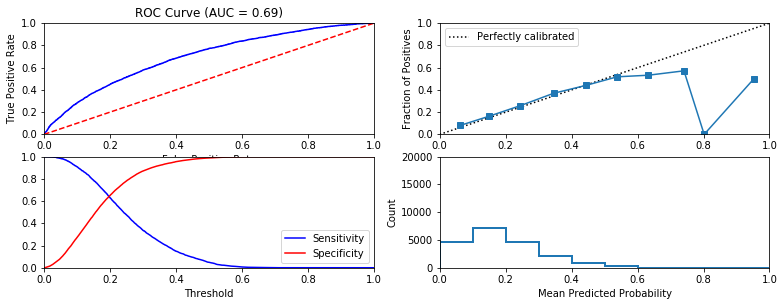


Similarity to LC grade ranking:  0.6556920774167464
Brier score: 0.1516738893228957
f1_score_no_default Mean:  0.8823140954380126 f1_score_no_default Standard Deviation:  2.220446049250313e-16
f1_score_default Mean:  0.1761850247076384 f1_score_default Standard Deviation:  2.7755575615628914e-17


In [42]:
params = {'activation': ['relu'], 'alpha': [0.0001], 'hidden_layer_sizes': [(40,60)], 'learning_rate': ['adaptive'], 'solver': ['adam']}

f1_scores_no_default = []
f1_scores_default = []
#take this out later
#counter = 1
for d in data_dictionaries:
    #MAKE SURE TO ALTER PARAMETERS BASED ON WHAT THE OPTIMAL ONES FOUND FROM RUNNING OVER ENTIRE_DIC ARE
    mlp = MLPClassifier()
    mlp = fit_classification(mlp, d,
                          cv_parameters = params,
                          model_name = 'mlp',
                          random_state = default_seed,
                          output_to_file = False,
                          print_to_screen = True)


    f1_scores_default.append(other_Scores['Default']['f1-score'])
    f1_scores_no_default.append(other_Scores['No default']['f1-score'])

print('f1_score_no_default Mean: ', np.array(f1_scores_no_default).mean(), 
      'f1_score_no_default Standard Deviation: ', np.array(f1_scores_no_default).std())
print('f1_score_default Mean: ', np.array(f1_scores_default).mean(),
      'f1_score_default Standard Deviation: ', np.array(f1_scores_default).std())

f1_score_no_default Mean:  0.8823140954380126 f1_score_no_default Standard Deviation:  2.220446049250313e-16

f1_score_default Mean:  0.1761850247076384 f1_score_default Standard Deviation:  2.7755575615628914e-17


## Train and Test logistic regression model with features derived by LendingClub

  Model: lc1_only_logistic
Fit time: 0.51 seconds
Optimal parameters:
{'C': 0.01}

Chosen threshold was: 0.5
Accuracy:  0.7903
              precision    recall  f1-score   support

  No default     0.7903    1.0000    0.8829     15806
     Default     0.0000    0.0000    0.0000      4194

   micro avg     0.7903    0.7903    0.7903     20000
   macro avg     0.3952    0.5000    0.4414     20000
weighted avg     0.6246    0.7903    0.6977     20000



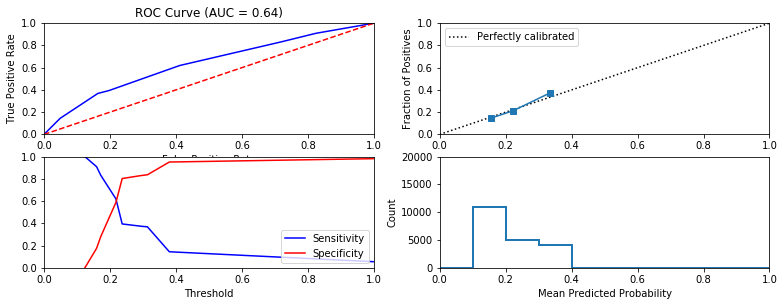


Similarity to LC grade ranking:  0.41349923907303265
Brier score: 0.15795459686785546


In [51]:
## Find a lendingClub-defined feature and train a l1-regularized logistic regression model on data with only that feature
##['grade','installment','int_rate'] are the features we found 
param_grid = { 
    'C': [0.01,0.1,1,10,100]
}

a_lendingclub_feature = ['grade']

data_dict = prepare_data(feature_subset = a_lendingclub_feature)
lc1_only_logistic = LogisticRegression(penalty='l1')

lc1_only_logistic, accuracy, other_Scores = fit_classification(lc1_only_logistic, data_dict,
                          cv_parameters = param_grid,
                          model_name = 'lc1_only_logistic',
                          random_state = default_seed,
                          output_to_file = False,
                          print_to_screen = True)

  Model: lc2_only_logistic
Fit time: 0.38 seconds
Optimal parameters:
{'C': 0.01}

Chosen threshold was: 0.5
Accuracy:  0.7903
              precision    recall  f1-score   support

  No default     0.7903    1.0000    0.8829     15806
     Default     0.0000    0.0000    0.0000      4194

   micro avg     0.7903    0.7903    0.7903     20000
   macro avg     0.3952    0.5000    0.4414     20000
weighted avg     0.6246    0.7903    0.6977     20000



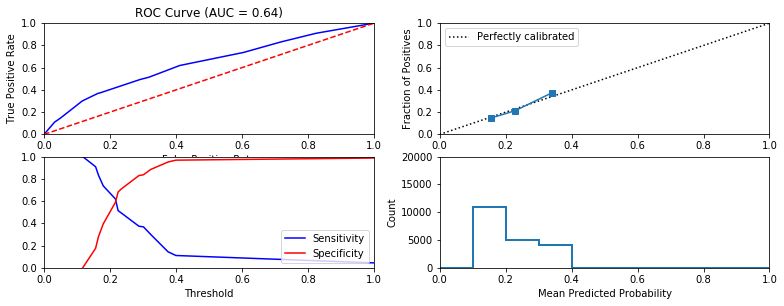


Similarity to LC grade ranking:  0.4036355656014352
Brier score: 0.15777763993316268


In [52]:
## train a l2-regularized logistic regression model on data with only that feature
param_grid = { 
    'C': [0.01,0.1,1,10,100]
}

a_lendingclub_feature = ['grade']

data_dict = prepare_data(feature_subset = a_lendingclub_feature)
lc2_only_logistic = LogisticRegression(penalty='l2')

lc2_only_logistic = fit_classification(lc2_only_logistic, data_dict,
                          cv_parameters = param_grid,
                          model_name = 'lc2_only_logistic',
                          random_state = default_seed,
                          output_to_file = False,
                          print_to_screen = True)

## Train and test all the models you have tried previously after removing features derived by LendingClub 

In [53]:
#Remove features and prepare data
your_features_without_derived=[val for val in your_features if val not in ['grade','installment','int_rate']]
entire_dic_without_derived=prepare_data(n_samples_train=644022, n_samples_test=276032, feature_subset=your_features_without_derived)


In [54]:
#preparing data for 100 test/train splits
data_dictionaries = []
for i in range(100):
    data_dict = prepare_data(feature_subset = your_features_without_derived, random_state=i)
    data_dictionaries.append(data_dict)
    
all_features = pd.Series(continuous_features + discrete_features_dummies)
idx = [i for i, j in enumerate(continuous_features + discrete_features_dummies)
       if j.split("::")[0] in your_features]
selected_features = all_features[idx]
selected_features.reset_index(drop=True,inplace=True)

# Random Classifier without derived features

  Model: Dummy Classifier
Fit time: 1.27 seconds
Optimal parameters:
{}

Chosen threshold was: 0.5
Accuracy:  0.7927486668212381
              precision    recall  f1-score   support

  No default     0.7927    1.0000    0.8844    218824
     Default     0.0000    0.0000    0.0000     57208

   micro avg     0.7927    0.7927    0.7927    276032
   macro avg     0.3964    0.5000    0.4422    276032
weighted avg     0.6285    0.7927    0.7011    276032



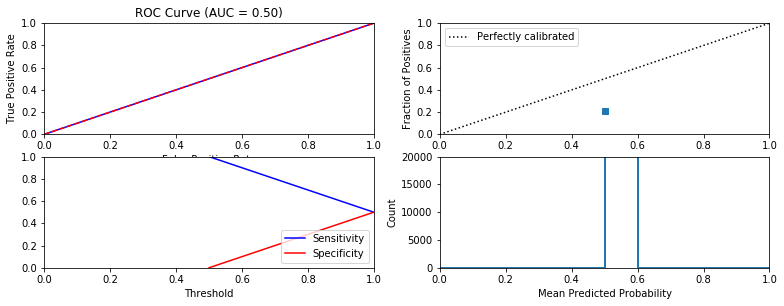


Similarity to LC grade ranking:  nan
Brier score: 0.25


In [55]:
dummy = DummyClassifier(strategy='uniform')
dumb, accuracy, other_Scores = fit_classification(dummy, entire_dic_without_derived,
                      cv_parameters = {},
                      model_name = 'Dummy Classifier',
                      random_state = default_seed,
                      output_to_file = False,
                      print_to_screen = True)

In [56]:
f1_scores_no_default = []
f1_scores_default = []
#take this out later
#counter = 1
for d in data_dictionaries:
    dummy = DummyClassifier(strategy='uniform')
    dummy, accuracy, other_Scores = fit_classification(dummy, d,
                          cv_parameters = {},
                          model_name = 'Dummy',
                          random_state = default_seed,
                          output_to_file = False,
                          print_to_screen = False)
    f1_scores_default.append(other_Scores['Default']['f1-score'])
    f1_scores_no_default.append(other_Scores['No default']['f1-score'])

print('f1_score_no_default Mean: ', np.array(f1_scores_no_default).mean(), 
      'f1_score_no_default Standard Deviation: ', np.array(f1_scores_no_default).std())
print('f1_score_default Mean: ', np.array(f1_scores_default).mean(),
      'f1_score_default Standard Deviation: ', np.array(f1_scores_default).std())

f1_score_no_default Mean:  0.8845976305296773 f1_score_no_default Standard Deviation:  0.0017852256132286188
f1_score_default Mean:  0.0 f1_score_default Standard Deviation:  0.0


# Gaussian Naive Bayes without derived features

  Model: gnb
Fit time: 5.24 seconds
Optimal parameters:
{'var_smoothing': 1e-09}

Chosen threshold was: 0.5
Accuracy:  0.7498007477393925
              precision    recall  f1-score   support

  No default     0.8255    0.8678    0.8461    218824
     Default     0.3711    0.2985    0.3309     57208

   micro avg     0.7498    0.7498    0.7498    276032
   macro avg     0.5983    0.5831    0.5885    276032
weighted avg     0.7314    0.7498    0.7393    276032



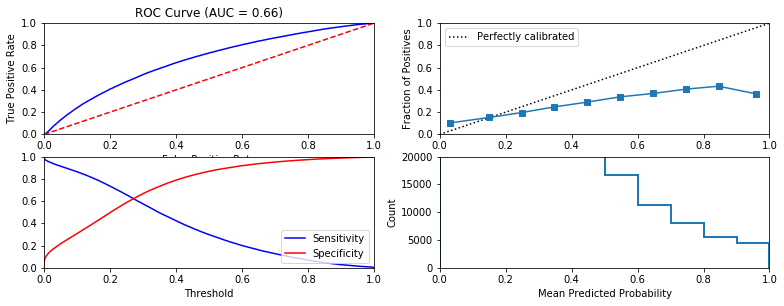


Similarity to LC grade ranking:  0.5770770457546205
Brier score: 0.17912135688210135


In [57]:
params = {'var_smoothing': [1e-09, 1e-10, 0]}
gnb = GaussianNB()
    #change output_to_file to True later
gnb, accuracy, other_Scores = fit_classification(gnb, entire_dic_without_derived,
                      cv_parameters = params,
                      model_name = 'gnb',
                      random_state = default_seed,
                      output_to_file = False,
                      print_to_screen = True)

In [72]:
params = {'var_smoothing': [1e-09]}
f1_scores_no_default = []
f1_scores_default = []
#take this out later
#counter = 1
for d in data_dictionaries:
    #change var_smoothing if necessary
    gnb = GaussianNB()
    gnb, accuracy, other_Scores = fit_classification(gnb, d,
                          cv_parameters = params,
                          model_name = 'gnb',
                          random_state = default_seed,
                          output_to_file = False,
                          print_to_screen = False)
    f1_scores_default.append(other_Scores['Default']['f1-score'])
    f1_scores_no_default.append(other_Scores['No default']['f1-score'])

print('f1_score_no_default Mean: ', np.array(f1_scores_no_default).mean(), 
      'f1_score_no_default Standard Deviation: ', np.array(f1_scores_no_default).std())
print('f1_score_default Mean: ', np.array(f1_scores_default).mean(),
      'f1_score_default Standard Deviation: ', np.array(f1_scores_default).std())

f1_score_no_default Mean:  0.8456918006162744 f1_score_no_default Standard Deviation:  0.005944827208211304
f1_score_default Mean:  0.3285382972647979 f1_score_default Standard Deviation:  0.02309957504494881


# LOGISTIC REGRESSION L1 without derived features

  Model: lc1_only_logistic
Fit time: 148.53 seconds
Optimal parameters:
{'C': 1}

Chosen threshold was: 0.5
Accuracy:  0.7932377405518201
              precision    recall  f1-score   support

  No default     0.8004    0.9848    0.8831    218824
     Default     0.5100    0.0604    0.1080     57208

   micro avg     0.7932    0.7932    0.7932    276032
   macro avg     0.6552    0.5226    0.4955    276032
weighted avg     0.7402    0.7932    0.7224    276032



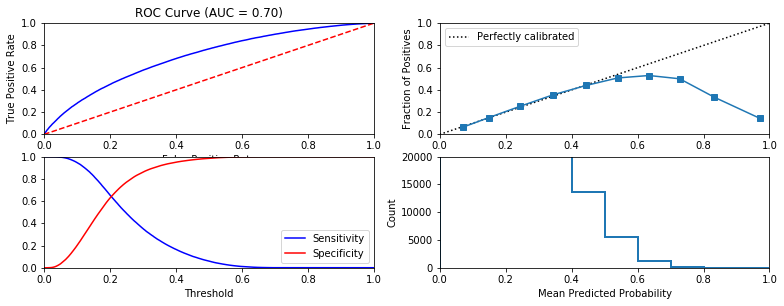


Similarity to LC grade ranking:  0.7211486240837933
Brier score: 0.15119976617070002


In [59]:
param_grid = { 
    'C': [0.01,0.1,1,10,100]
}

lc1_only_logistic = LogisticRegression(penalty='l1')

lc1_only_logistic, accuracy, other_Scores = fit_classification(lc1_only_logistic, entire_dic_without_derived,
                          cv_parameters = param_grid,
                          model_name = 'lc1_only_logistic',
                          random_state = default_seed,
                          output_to_file = False,
                          print_to_screen = True)

In [105]:

params = {'C': [1]}
f1_scores_no_default = []
f1_scores_default = []
#take this out later
#counter = 1

for d in data_dictionaries:
    logreg = LogisticRegression(penalty = 'l1')
    logreg, accuracy, other_Scores = fit_classification(logreg, d,
                          cv_parameters = params,
                          model_name = 'lc1_only_logistic',
                          random_state = default_seed,
                          output_to_file = False,
                          print_to_screen = False)
    f1_scores_default.append(other_Scores['Default']['f1-score'])
    f1_scores_no_default.append(other_Scores['No default']['f1-score'])

print('f1_score_no_default Mean: ', np.array(f1_scores_no_default).mean(), 
      'f1_score_no_default Standard Deviation: ', np.array(f1_scores_no_default).std())
print('f1_score_default Mean: ', np.array(f1_scores_default).mean(),
      'f1_score_default Standard Deviation: ', np.array(f1_scores_default).std())

f1_score_no_default Mean:  0.8832068901108516 f1_score_no_default Standard Deviation:  0.0017823762172967871
f1_score_default Mean:  0.10332283872451152 f1_score_default Standard Deviation:  0.008915724337375173


# LOGISTIC REGRESSION L2 without derived features

  Model: lc2_only_logistic
Fit time: 44.62 seconds
Optimal parameters:
{'C': 1}

Chosen threshold was: 0.5
Accuracy:  0.7931978900996985
              precision    recall  f1-score   support

  No default     0.8001    0.9853    0.8831    218824
     Default     0.5094    0.0585    0.1050     57208

   micro avg     0.7932    0.7932    0.7932    276032
   macro avg     0.6548    0.5219    0.4940    276032
weighted avg     0.7399    0.7932    0.7218    276032



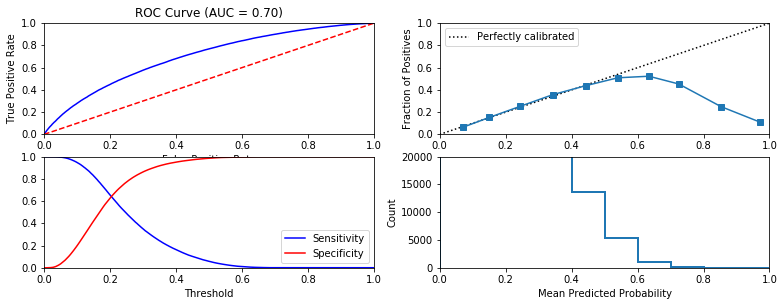


Similarity to LC grade ranking:  0.7269013126336783
Brier score: 0.15122989724148844


In [61]:
param_grid = { 
    'C': [0.01,0.1,1,10,100]
}


lc2_only_logistic = LogisticRegression(penalty='l2')

lc2_only_logistic, accuracy, other_Scores = fit_classification(lc2_only_logistic, entire_dic_without_derived,
                          cv_parameters = param_grid,
                          model_name = 'lc2_only_logistic',
                          random_state = default_seed,
                          output_to_file = False,
                          print_to_screen = True)

In [74]:
params = {'C': [1]}
f1_scores_no_default = []
f1_scores_default = []
#take this out later
#counter = 1
for d in data_dictionaries:
    #CHANGE C ACCORDINGLY
    logreg2 = LogisticRegression(penalty = 'l2')
    logreg2, accuracy, other_Scores = fit_classification(logreg2, d,
                          cv_parameters = params,
                          model_name = 'lc2_only_logistic',
                          random_state = default_seed,
                          output_to_file = False,
                          print_to_screen = False)
    f1_scores_default.append(other_Scores['Default']['f1-score'])
    f1_scores_no_default.append(other_Scores['No default']['f1-score'])

print('f1_score_no_default Mean: ', np.array(f1_scores_no_default).mean(), 
      'f1_score_no_default Standard Deviation: ', np.array(f1_scores_no_default).std())
print('f1_score_default Mean: ', np.array(f1_scores_default).mean(),
      'f1_score_default Standard Deviation: ', np.array(f1_scores_default).std())

f1_score_no_default:  0.8832480224666527
f1_score_default:  0.09618275907398634


# DECISION TREE without derived features

  Model: decision_tree
Fit time: 211.04 seconds
Optimal parameters:
{'max_depth': 11, 'min_samples_split': 3}

Chosen threshold was: 0.5
Accuracy:  0.7912886911662416
              precision    recall  f1-score   support

  No default     0.8018    0.9785    0.8814    218824
     Default     0.4776    0.0750    0.1297     57208

   micro avg     0.7913    0.7913    0.7913    276032
   macro avg     0.6397    0.5268    0.5056    276032
weighted avg     0.7346    0.7913    0.7256    276032



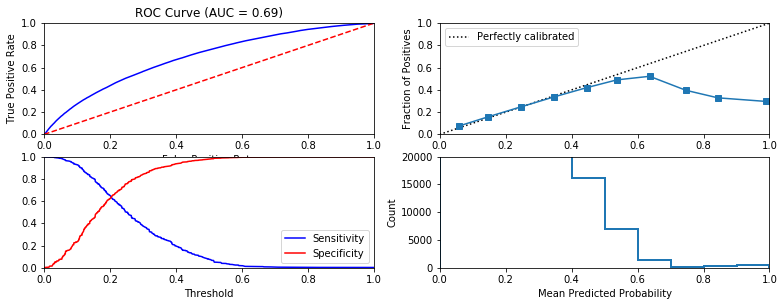


Similarity to LC grade ranking:  0.670078683096354
Brier score: 0.15342489831167877


In [81]:
#decision tree 
params = {"max_depth": [11,13,15,17,19],"min_samples_split":range(2,5)}###question

decision_tree = DecisionTreeClassifier()
    #change output_to_file to True later
decision_tree, accuracy, other_Scores = fit_classification(decision_tree, entire_dic_without_derived,
                      cv_parameters = params,
                      model_name = 'decision_tree',
                      random_state = default_seed,
                      output_to_file = False,
                      print_to_screen = True)

In [82]:
## Train and test a decision tree classifier
params = {"max_depth": [11],"min_samples_split":[3]}
f1_scores_no_default = []
f1_scores_default = []


for d in data_dictionaries:
    decision_tree = DecisionTreeClassifier()
    decision_tree = fit_classification(decision_tree, d,
                          cv_parameters = params,
                          model_name = 'decision_tree',
                          random_state = default_seed,
                          output_to_file = False,
                          print_to_screen = False)

    f1_scores_default.append(other_Scores['Default']['f1-score'])
    f1_scores_no_default.append(other_Scores['No default']['f1-score'])

print('f1_score_no_default Mean: ', np.array(f1_scores_no_default).mean(), 
      'f1_score_no_default Standard Deviation: ', np.array(f1_scores_no_default).std())
print('f1_score_default Mean: ', np.array(f1_scores_default).mean(),
      'f1_score_default Standard Deviation: ', np.array(f1_scores_default).std())

f1_score_no_default Mean:  0.8814268866710983 f1_score_no_default Standard Deviation:  2.220446049250313e-16
f1_score_default Mean:  0.1296774680867135 f1_score_default Standard Deviation:  2.7755575615628914e-17


# RANDOM FOREST without derived features

  Model: random_forest
Fit time: 38621.63 seconds
Optimal parameters:
{'criterion': 'gini', 'max_depth': 8, 'max_features': 'log2', 'n_estimators': 500}

Chosen threshold was: 0.5
Accuracy:  0.7934478611175516
              precision    recall  f1-score   support

  No default     0.7940    0.9984    0.8846    218824
     Default     0.6093    0.0094    0.0185     57208

   micro avg     0.7934    0.7934    0.7934    276032
   macro avg     0.7017    0.5039    0.4516    276032
weighted avg     0.7557    0.7934    0.7051    276032



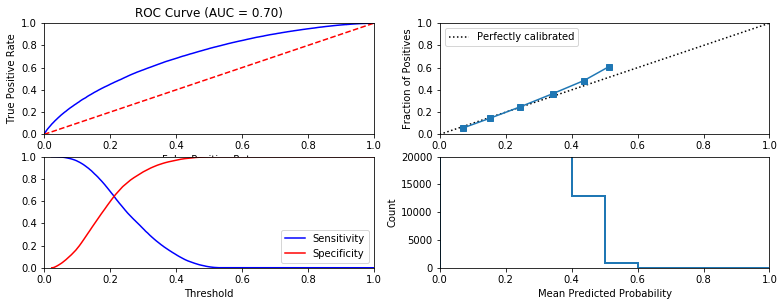


Similarity to LC grade ranking:  0.745984164377983
Brier score: 0.15084916284539293


In [83]:
#random forest
param_grid = { 
    'n_estimators': [200, 500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy'] 
}
## Train and test a random forest classifier

random_forest = RandomForestClassifier()

random_forest = fit_classification(random_forest, entire_dic_without_derived,
                          cv_parameters = param_grid,
                          model_name = 'random_forest',
                          random_state = default_seed,
                          output_to_file = False,
                          print_to_screen = True)

In [85]:
## Train and test a random forest classifier
f1_scores_no_default = []
f1_scores_default = []
#take this out later
#counter = 1
cv_parameters={'criterion':['gini'], 'max_depth':[8], 'max_features':['log2'], 'n_estimators': [500]}
for d in data_dictionaries:
    random_forest = RandomForestClassifier()
    random_forest = fit_classification(random_forest, d,
                          cv_parameters = cv_parameters,
                          model_name = 'random_forest',
                          random_state = default_seed,
                          output_to_file = False,
                          print_to_screen = False)


    f1_scores_default.append(other_Scores['Default']['f1-score'])
    f1_scores_no_default.append(other_Scores['No default']['f1-score'])

print('f1_score_no_default Mean: ', np.array(f1_scores_no_default).mean(), 
      'f1_score_no_default Standard Deviation: ', np.array(f1_scores_no_default).std())
print('f1_score_default Mean: ', np.array(f1_scores_default).mean(),
      'f1_score_default Standard Deviation: ', np.array(f1_scores_default).std())

f1_score_no_default Mean:  0.8814268866710983 f1_score_no_default Standard Deviation:  2.220446049250313e-16
f1_score_default Mean:  0.1296774680867135 f1_score_default Standard Deviation:  2.7755575615628914e-17


# MULTILAYER PERCEPTRON without derived features

  Model: Multi-layer perceptron
Fit time: 14797.33 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7949730466032924
              precision    recall  f1-score   support

  No default     0.8018    0.9849    0.8839    218824
     Default     0.5425    0.0685    0.1217     57208

   micro avg     0.7950    0.7950    0.7950    276032
   macro avg     0.6721    0.5267    0.5028    276032
weighted avg     0.7480    0.7950    0.7260    276032



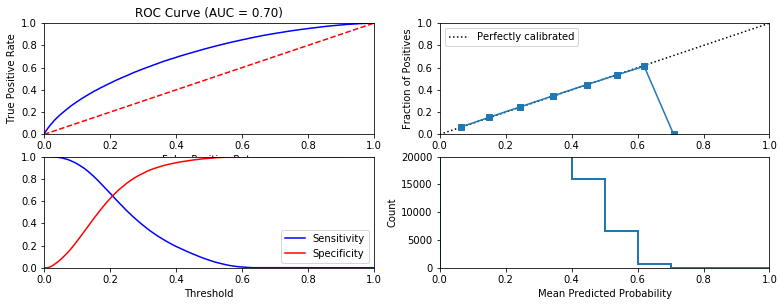


Similarity to LC grade ranking:  0.6992672583526436
Brier score: 0.14952735593074792


In [86]:
#MLP
param_grid = { 
    'hidden_layer_sizes': [(10,10), (20,20), (30,40)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'alpha': [0.0001, 0.05],
    'learning_rate': ['constant','adaptive','invscaling']
}

## Train and test a multi-layer perceptron classifier

mlp = MLPClassifier()

mlp, accuracy, other_Scores = fit_classification(mlp, entire_dic_without_derived,
                          cv_parameters = param_grid,
                          model_name = 'Multi-layer perceptron',
                          random_state = default_seed,
                          output_to_file = False,
                          print_to_screen = True)

  Model: mlp
Fit time: 31.46 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7897
              precision    recall  f1-score   support

  No default     0.7946    0.9892    0.8813     15782
     Default     0.5170    0.0431    0.0796      4218

   micro avg     0.7897    0.7897    0.7897     20000
   macro avg     0.6558    0.5162    0.4805     20000
weighted avg     0.7361    0.7897    0.7122     20000



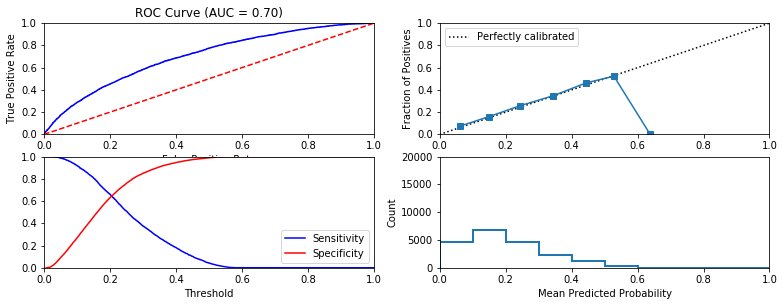


Similarity to LC grade ranking:  0.6798743094382819
Brier score: 0.15232922485228115
  Model: mlp
Fit time: 35.1 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79215
              precision    recall  f1-score   support

  No default     0.7960    0.9910    0.8828     15806
     Default     0.5573    0.0429    0.0797      4194

   micro avg     0.7922    0.7922    0.7922     20000
   macro avg     0.6766    0.5169    0.4813     20000
weighted avg     0.7459    0.7922    0.7144     20000



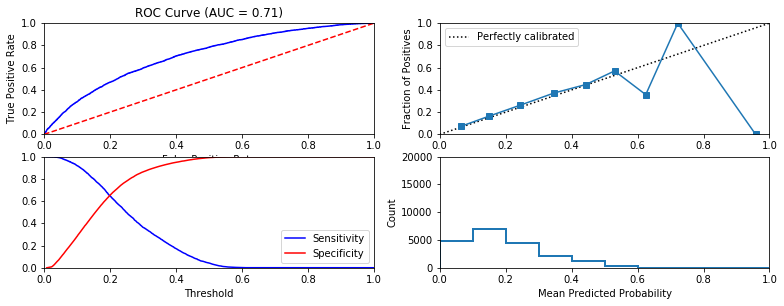


Similarity to LC grade ranking:  0.7083104564984719
Brier score: 0.15090554047258217
  Model: mlp
Fit time: 31.18 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7912
              precision    recall  f1-score   support

  No default     0.7959    0.9896    0.8822     15807
     Default     0.5246    0.0432    0.0798      4193

   micro avg     0.7912    0.7912    0.7912     20000
   macro avg     0.6603    0.5164    0.4810     20000
weighted avg     0.7390    0.7912    0.7140     20000



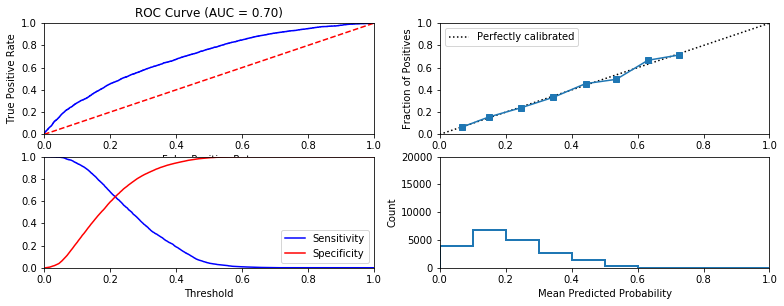


Similarity to LC grade ranking:  0.6810468516810845
Brier score: 0.15187160525578916
  Model: mlp
Fit time: 30.17 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79485
              precision    recall  f1-score   support

  No default     0.8014    0.9860    0.8842     15883
     Default     0.5153    0.0573    0.1032      4117

   micro avg     0.7948    0.7948    0.7948     20000
   macro avg     0.6583    0.5217    0.4937     20000
weighted avg     0.7425    0.7948    0.7234     20000



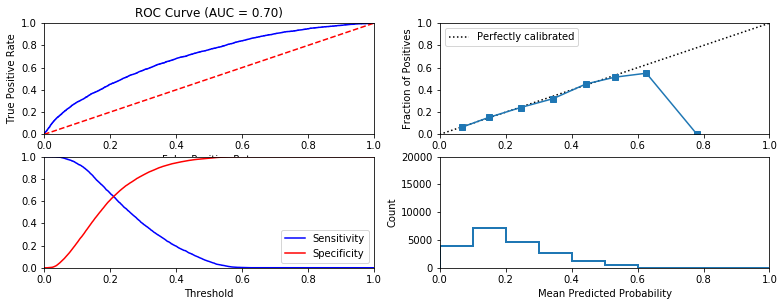


Similarity to LC grade ranking:  0.7085872418196066
Brier score: 0.14998535157615736
  Model: mlp
Fit time: 38.82 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79115
              precision    recall  f1-score   support

  No default     0.7965    0.9882    0.8820     15801
     Default     0.5278    0.0498    0.0910      4199

   micro avg     0.7912    0.7912    0.7912     20000
   macro avg     0.6621    0.5190    0.4865     20000
weighted avg     0.7401    0.7912    0.7159     20000



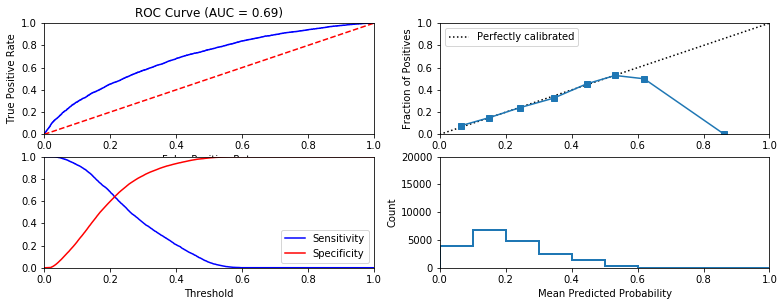


Similarity to LC grade ranking:  0.6886231734807317
Brier score: 0.1521898489443396
  Model: mlp
Fit time: 22.65 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.78975
              precision    recall  f1-score   support

  No default     0.7932    0.9923    0.8816     15782
     Default     0.5255    0.0318    0.0599      4218

   micro avg     0.7897    0.7897    0.7897     20000
   macro avg     0.6593    0.5121    0.4708     20000
weighted avg     0.7367    0.7897    0.7083     20000



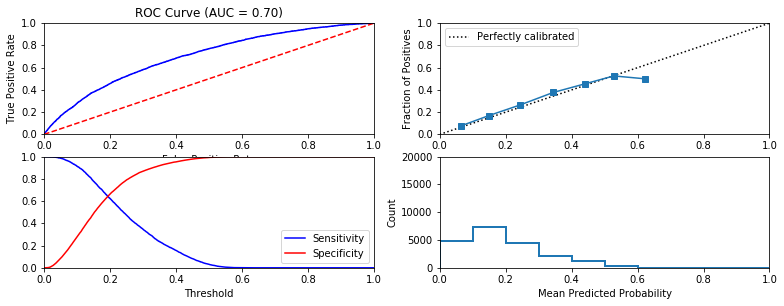


Similarity to LC grade ranking:  0.6889561430276542
Brier score: 0.15289053904157812
  Model: mlp
Fit time: 23.31 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7986
              precision    recall  f1-score   support

  No default     0.8054    0.9847    0.8861     15905
     Default     0.5604    0.0759    0.1338      4095

   micro avg     0.7986    0.7986    0.7986     20000
   macro avg     0.6829    0.5303    0.5099     20000
weighted avg     0.7552    0.7986    0.7320     20000



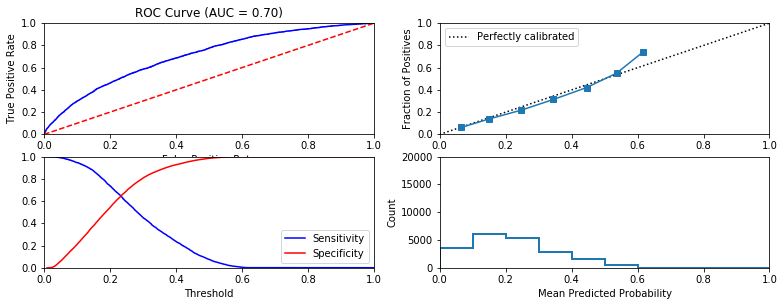


Similarity to LC grade ranking:  0.6914403176519881
Brier score: 0.14854284419436636
  Model: mlp
Fit time: 25.06 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79405
              precision    recall  f1-score   support

  No default     0.8043    0.9781    0.8827     15851
     Default     0.5207    0.0909    0.1547      4149

   micro avg     0.7941    0.7941    0.7941     20000
   macro avg     0.6625    0.5345    0.5187     20000
weighted avg     0.7455    0.7941    0.7317     20000



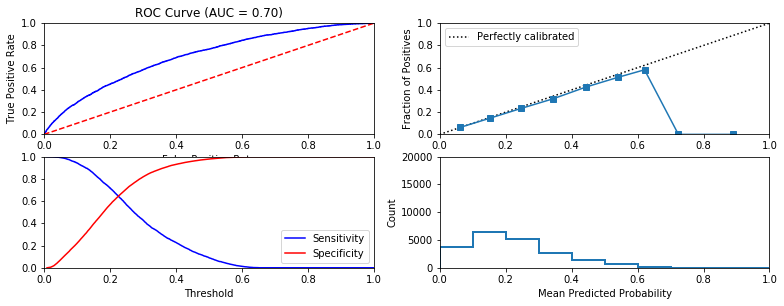


Similarity to LC grade ranking:  0.7040132965501693
Brier score: 0.15055308688704178
  Model: mlp
Fit time: 28.52 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79665
              precision    recall  f1-score   support

  No default     0.8040    0.9844    0.8851     15918
     Default     0.5147    0.0644    0.1145      4082

   micro avg     0.7966    0.7966    0.7966     20000
   macro avg     0.6594    0.5244    0.4998     20000
weighted avg     0.7450    0.7966    0.7279     20000



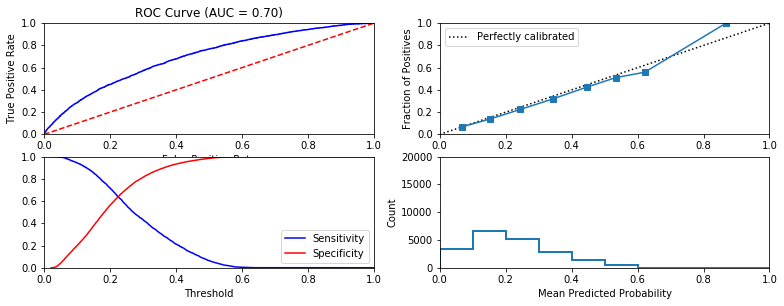


Similarity to LC grade ranking:  0.6978989540253584
Brier score: 0.14956349232105687
  Model: mlp
Fit time: 36.65 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.792
              precision    recall  f1-score   support

  No default     0.7959    0.9913    0.8829     15821
     Default     0.5322    0.0376    0.0702      4179

   micro avg     0.7920    0.7920    0.7920     20000
   macro avg     0.6640    0.5144    0.4765     20000
weighted avg     0.7408    0.7920    0.7131     20000



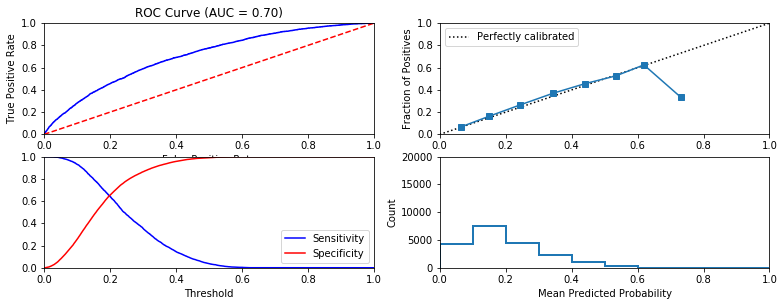


Similarity to LC grade ranking:  0.6840457842914373
Brier score: 0.15131240901405169
  Model: mlp
Fit time: 46.82 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7902
              precision    recall  f1-score   support

  No default     0.7968    0.9852    0.8810     15771
     Default     0.5331    0.0629    0.1125      4229

   micro avg     0.7902    0.7902    0.7902     20000
   macro avg     0.6649    0.5241    0.4968     20000
weighted avg     0.7410    0.7902    0.7185     20000



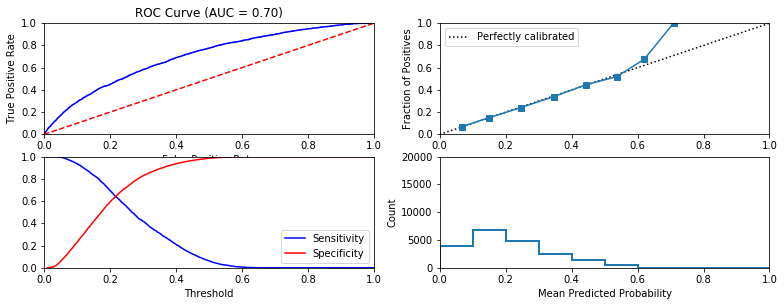


Similarity to LC grade ranking:  0.6972823591184412
Brier score: 0.15232993657336255
  Model: mlp
Fit time: 55.67 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79135
              precision    recall  f1-score   support

  No default     0.7975    0.9867    0.8821     15818
     Default     0.5105    0.0524    0.0950      4182

   micro avg     0.7913    0.7913    0.7913     20000
   macro avg     0.6540    0.5195    0.4885     20000
weighted avg     0.7375    0.7913    0.7175     20000



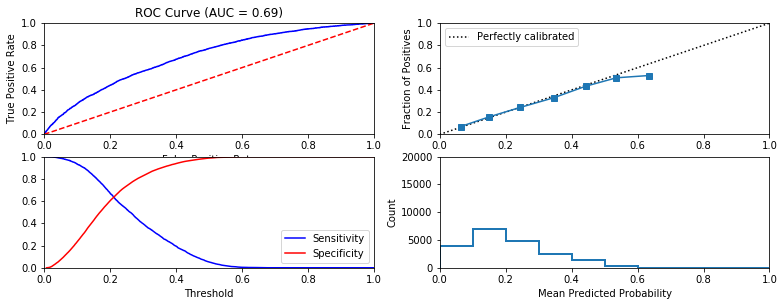


Similarity to LC grade ranking:  0.7009850796765272
Brier score: 0.1523187189068683
  Model: mlp
Fit time: 38.99 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79395
              precision    recall  f1-score   support

  No default     0.8005    0.9862    0.8837     15877
     Default     0.5023    0.0536    0.0969      4123

   micro avg     0.7940    0.7940    0.7940     20000
   macro avg     0.6514    0.5199    0.4903     20000
weighted avg     0.7390    0.7940    0.7215     20000



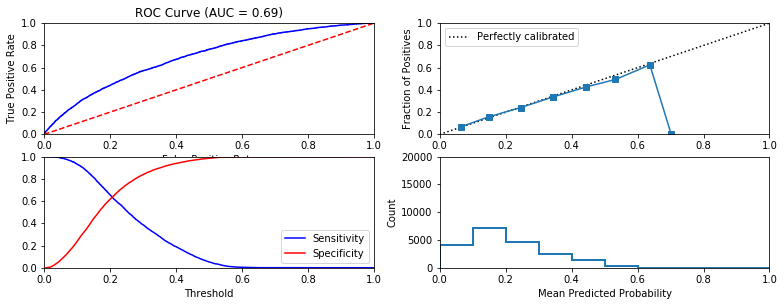


Similarity to LC grade ranking:  0.6807640048087024
Brier score: 0.15094370482803132
  Model: mlp
Fit time: 36.95 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7977
              precision    recall  f1-score   support

  No default     0.8024    0.9902    0.8865     15953
     Default     0.5016    0.0388    0.0720      4047

   micro avg     0.7977    0.7977    0.7977     20000
   macro avg     0.6520    0.5145    0.4792     20000
weighted avg     0.7415    0.7977    0.7217     20000



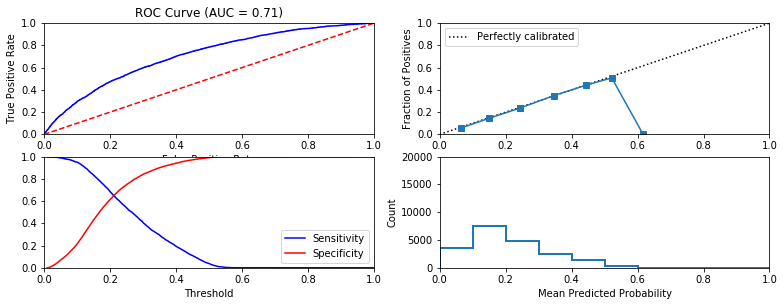


Similarity to LC grade ranking:  0.6879542681929195
Brier score: 0.14712184311136828
  Model: mlp
Fit time: 58.02 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.78605
              precision    recall  f1-score   support

  No default     0.7891    0.9927    0.8793     15697
     Default     0.5476    0.0321    0.0606      4303

   micro avg     0.7861    0.7861    0.7861     20000
   macro avg     0.6684    0.5124    0.4699     20000
weighted avg     0.7371    0.7861    0.7031     20000



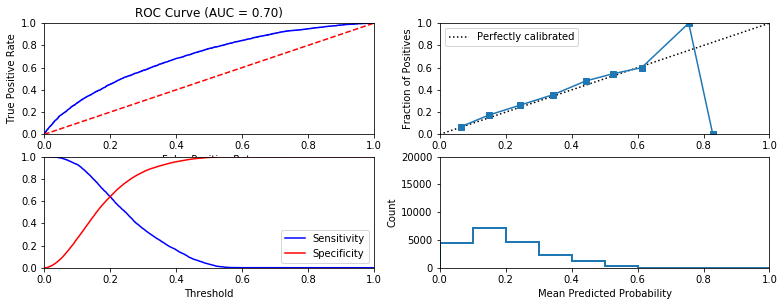


Similarity to LC grade ranking:  0.6971240576931482
Brier score: 0.1549522218734386
  Model: mlp
Fit time: 48.17 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7983
              precision    recall  f1-score   support

  No default     0.8077    0.9806    0.8858     15954
     Default     0.5095    0.0793    0.1373      4046

   micro avg     0.7983    0.7983    0.7983     20000
   macro avg     0.6586    0.5300    0.5115     20000
weighted avg     0.7474    0.7983    0.7344     20000



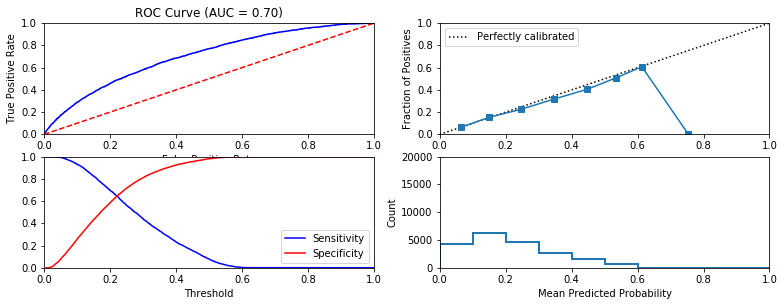


Similarity to LC grade ranking:  0.7277413272183801
Brier score: 0.1481182853198708
  Model: mlp
Fit time: 57.77 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7944
              precision    recall  f1-score   support

  No default     0.8004    0.9871    0.8840     15877
     Default     0.5131    0.0524    0.0951      4123

   micro avg     0.7944    0.7944    0.7944     20000
   macro avg     0.6568    0.5197    0.4895     20000
weighted avg     0.7412    0.7944    0.7214     20000



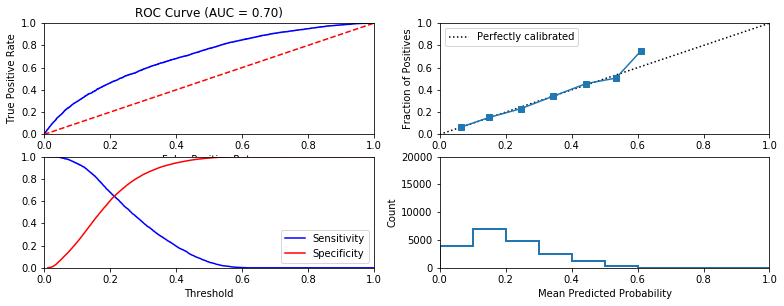


Similarity to LC grade ranking:  0.7072733679183433
Brier score: 0.1493672308811776
  Model: mlp
Fit time: 30.87 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7979
              precision    recall  f1-score   support

  No default     0.8021    0.9910    0.8866     15944
     Default     0.5233    0.0387    0.0721      4056

   micro avg     0.7979    0.7979    0.7979     20000
   macro avg     0.6627    0.5149    0.4793     20000
weighted avg     0.7456    0.7979    0.7214     20000



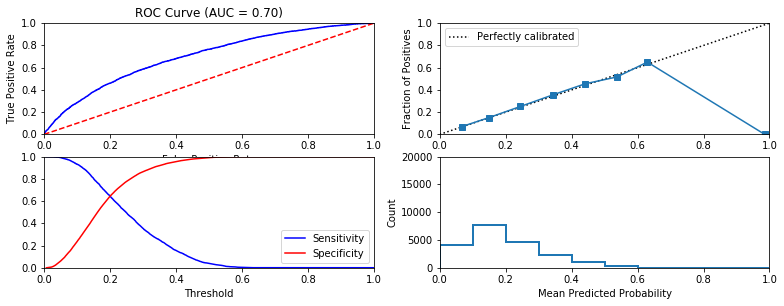


Similarity to LC grade ranking:  0.7106928111552662
Brier score: 0.14823238985779943
  Model: mlp
Fit time: 42.05 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79405
              precision    recall  f1-score   support

  No default     0.8064    0.9746    0.8826     15885
     Default     0.4975    0.0970    0.1623      4115

   micro avg     0.7941    0.7941    0.7941     20000
   macro avg     0.6520    0.5358    0.5224     20000
weighted avg     0.7429    0.7941    0.7344     20000



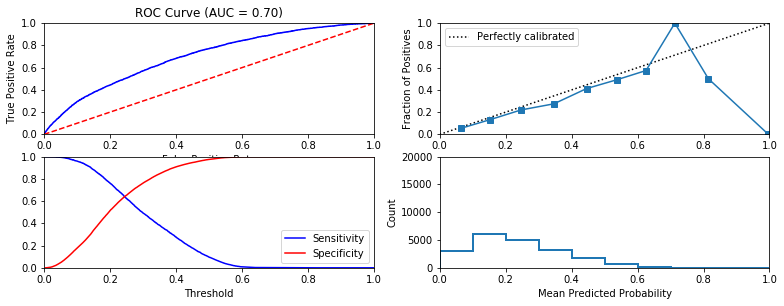


Similarity to LC grade ranking:  0.699018818240749
Brier score: 0.15121954413325348
  Model: mlp
Fit time: 36.58 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7984
              precision    recall  f1-score   support

  No default     0.8046    0.9865    0.8863     15929
     Default     0.5416    0.0624    0.1119      4071

   micro avg     0.7984    0.7984    0.7984     20000
   macro avg     0.6731    0.5244    0.4991     20000
weighted avg     0.7510    0.7984    0.7287     20000



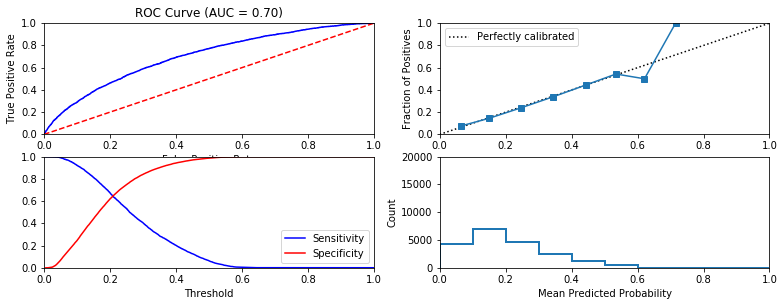


Similarity to LC grade ranking:  0.7067810591475592
Brier score: 0.1480590649814868
  Model: mlp
Fit time: 33.67 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79025
              precision    recall  f1-score   support

  No default     0.7925    0.9949    0.8822     15795
     Default     0.5294    0.0214    0.0411      4205

   micro avg     0.7903    0.7903    0.7903     20000
   macro avg     0.6609    0.5082    0.4617     20000
weighted avg     0.7372    0.7903    0.7054     20000



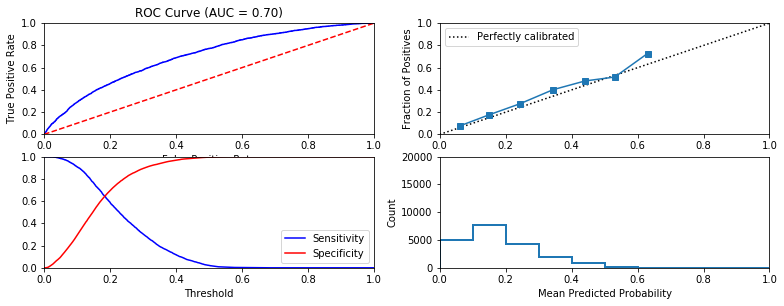


Similarity to LC grade ranking:  0.7094880245349401
Brier score: 0.1526613738666224
  Model: mlp
Fit time: 48.2 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79535
              precision    recall  f1-score   support

  No default     0.8040    0.9818    0.8841     15896
     Default     0.5093    0.0731    0.1278      4104

   micro avg     0.7954    0.7954    0.7954     20000
   macro avg     0.6567    0.5275    0.5060     20000
weighted avg     0.7436    0.7954    0.7289     20000



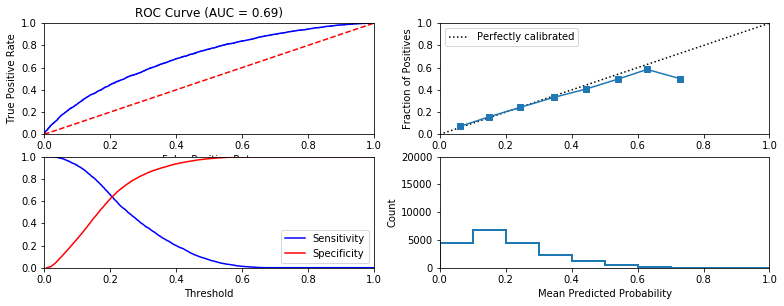


Similarity to LC grade ranking:  0.7078026775855086
Brier score: 0.15047079604995942
  Model: mlp
Fit time: 31.44 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79585
              precision    recall  f1-score   support

  No default     0.7985    0.9940    0.8856     15898
     Default     0.5455    0.0278    0.0529      4102

   micro avg     0.7958    0.7958    0.7958     20000
   macro avg     0.6720    0.5109    0.4692     20000
weighted avg     0.7466    0.7958    0.7148     20000



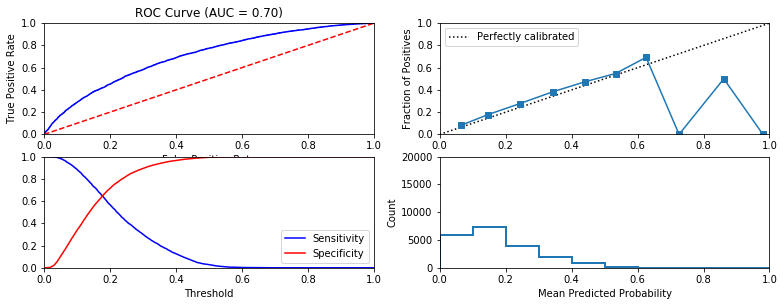


Similarity to LC grade ranking:  0.7119957368817535
Brier score: 0.15016834612951308
  Model: mlp
Fit time: 39.16 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79225
              precision    recall  f1-score   support

  No default     0.7973    0.9891    0.8829     15843
     Default     0.5029    0.0419    0.0773      4157

   micro avg     0.7923    0.7923    0.7923     20000
   macro avg     0.6501    0.5155    0.4801     20000
weighted avg     0.7361    0.7923    0.7155     20000



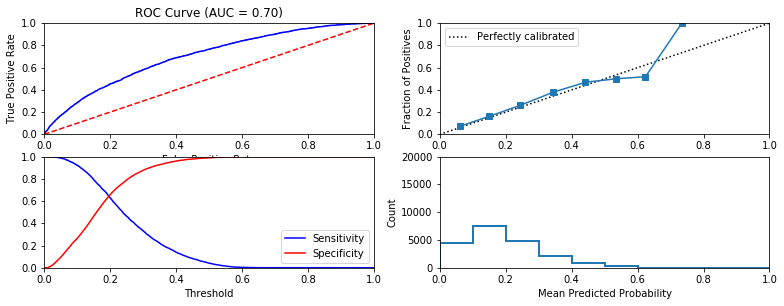


Similarity to LC grade ranking:  0.6968583155095451
Brier score: 0.15114734765050555
  Model: mlp
Fit time: 44.82 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7913
              precision    recall  f1-score   support

  No default     0.7945    0.9925    0.8825     15795
     Default     0.5581    0.0354    0.0666      4205

   micro avg     0.7913    0.7913    0.7913     20000
   macro avg     0.6763    0.5140    0.4746     20000
weighted avg     0.7448    0.7913    0.7110     20000



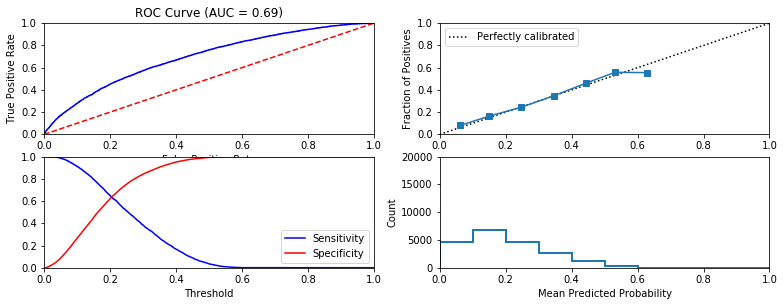


Similarity to LC grade ranking:  0.7040518322776933
Brier score: 0.1528959474851136
  Model: mlp
Fit time: 33.92 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7936
              precision    recall  f1-score   support

  No default     0.7954    0.9958    0.8844     15856
     Default     0.5541    0.0198    0.0382      4144

   micro avg     0.7936    0.7936    0.7936     20000
   macro avg     0.6747    0.5078    0.4613     20000
weighted avg     0.7454    0.7936    0.7091     20000



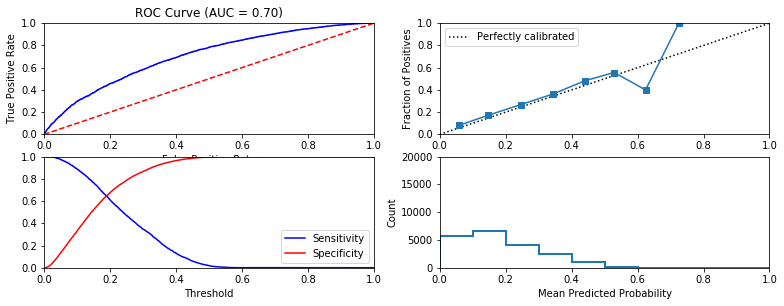


Similarity to LC grade ranking:  0.6867923601539807
Brier score: 0.15060784510761271
  Model: mlp
Fit time: 27.22 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79485
              precision    recall  f1-score   support

  No default     0.8013    0.9868    0.8844     15905
     Default     0.4903    0.0493    0.0896      4095

   micro avg     0.7948    0.7948    0.7948     20000
   macro avg     0.6458    0.5181    0.4870     20000
weighted avg     0.7376    0.7948    0.7217     20000



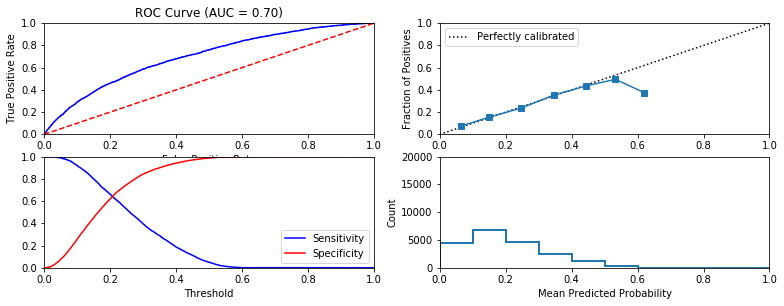


Similarity to LC grade ranking:  0.7025151047479653
Brier score: 0.14957220079835368
  Model: mlp
Fit time: 32.34 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.796
              precision    recall  f1-score   support

  No default     0.8010    0.9889    0.8851     15887
     Default     0.5426    0.0511    0.0933      4113

   micro avg     0.7960    0.7960    0.7960     20000
   macro avg     0.6718    0.5200    0.4892     20000
weighted avg     0.7479    0.7960    0.7222     20000



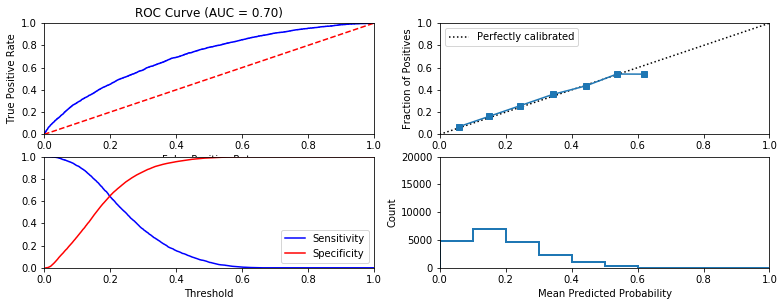


Similarity to LC grade ranking:  0.6839809505940053
Brier score: 0.14949858712266878
  Model: mlp
Fit time: 57.8 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79625
              precision    recall  f1-score   support

  No default     0.8025    0.9871    0.8852     15923
     Default     0.5024    0.0510    0.0926      4077

   micro avg     0.7963    0.7963    0.7963     20000
   macro avg     0.6524    0.5190    0.4889     20000
weighted avg     0.7413    0.7963    0.7237     20000



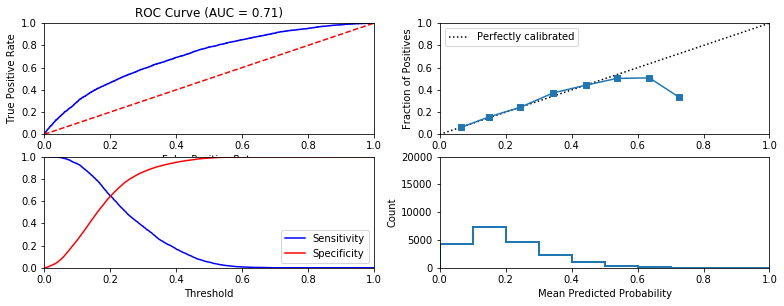


Similarity to LC grade ranking:  0.7018411795414753
Brier score: 0.14823672070390567
  Model: mlp
Fit time: 53.68 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7914
              precision    recall  f1-score   support

  No default     0.8018    0.9783    0.8813     15829
     Default     0.4993    0.0820    0.1409      4171

   micro avg     0.7914    0.7914    0.7914     20000
   macro avg     0.6505    0.5302    0.5111     20000
weighted avg     0.7387    0.7914    0.7269     20000



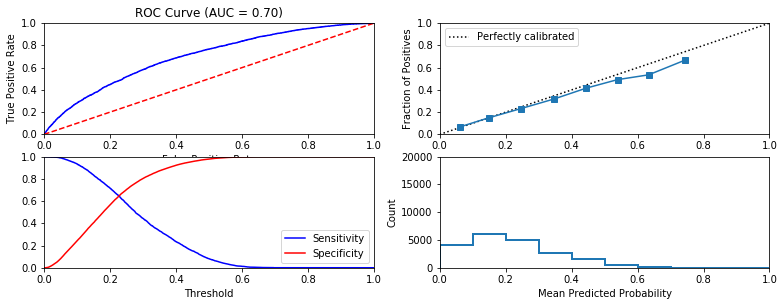


Similarity to LC grade ranking:  0.6951013186527382
Brier score: 0.1518131271022391
  Model: mlp
Fit time: 40.52 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79285
              precision    recall  f1-score   support

  No default     0.7944    0.9954    0.8836     15802
     Default     0.6368    0.0305    0.0582      4198

   micro avg     0.7929    0.7929    0.7929     20000
   macro avg     0.7156    0.5129    0.4709     20000
weighted avg     0.7614    0.7929    0.7104     20000



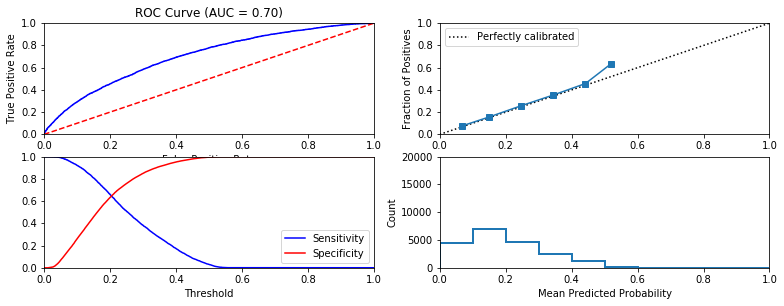


Similarity to LC grade ranking:  0.6985542434062212
Brier score: 0.15140796156218625
  Model: mlp
Fit time: 36.9 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79485
              precision    recall  f1-score   support

  No default     0.7999    0.9885    0.8843     15858
     Default     0.5484    0.0534    0.0972      4142

   micro avg     0.7948    0.7948    0.7948     20000
   macro avg     0.6742    0.5209    0.4908     20000
weighted avg     0.7478    0.7948    0.7213     20000



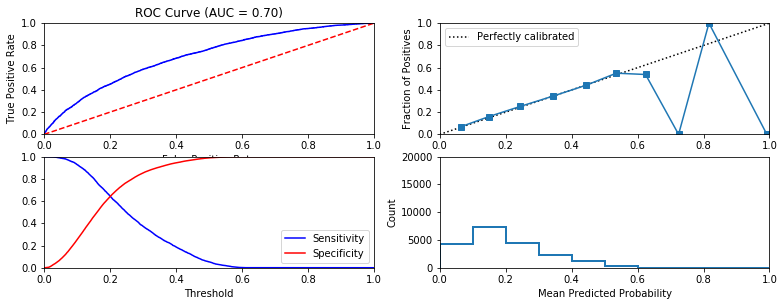


Similarity to LC grade ranking:  0.6897322437070719
Brier score: 0.15029302855235488
  Model: mlp
Fit time: 32.04 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79065
              precision    recall  f1-score   support

  No default     0.7924    0.9961    0.8826     15806
     Default     0.5267    0.0165    0.0319      4194

   micro avg     0.7906    0.7906    0.7906     20000
   macro avg     0.6596    0.5063    0.4573     20000
weighted avg     0.7367    0.7906    0.7042     20000



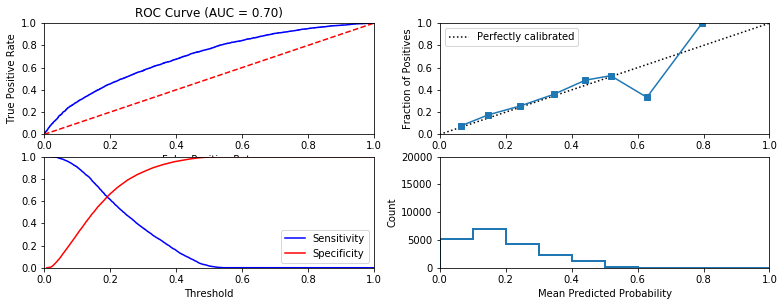


Similarity to LC grade ranking:  0.7046506315541133
Brier score: 0.15203030183933805
  Model: mlp
Fit time: 29.88 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79425
              precision    recall  f1-score   support

  No default     0.8024    0.9829    0.8835     15878
     Default     0.5064    0.0674    0.1190      4122

   micro avg     0.7943    0.7943    0.7943     20000
   macro avg     0.6544    0.5252    0.5013     20000
weighted avg     0.7414    0.7943    0.7260     20000



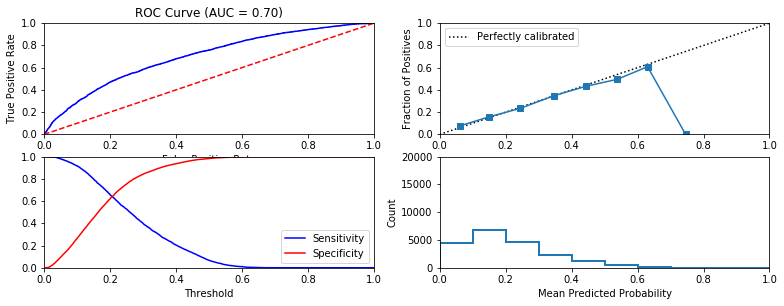


Similarity to LC grade ranking:  0.6893826242538136
Brier score: 0.15009083305932364
  Model: mlp
Fit time: 25.16 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7934
              precision    recall  f1-score   support

  No default     0.7980    0.9898    0.8836     15850
     Default     0.5265    0.0431    0.0797      4150

   micro avg     0.7934    0.7934    0.7934     20000
   macro avg     0.6622    0.5165    0.4817     20000
weighted avg     0.7417    0.7934    0.7168     20000



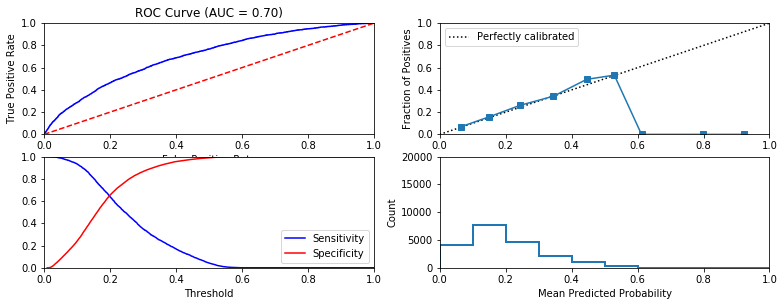


Similarity to LC grade ranking:  0.7002088136863366
Brier score: 0.1502083633533974
  Model: mlp
Fit time: 32.77 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7925
              precision    recall  f1-score   support

  No default     0.7960    0.9922    0.8833     15830
     Default     0.5373    0.0345    0.0649      4170

   micro avg     0.7925    0.7925    0.7925     20000
   macro avg     0.6666    0.5133    0.4741     20000
weighted avg     0.7420    0.7925    0.7127     20000



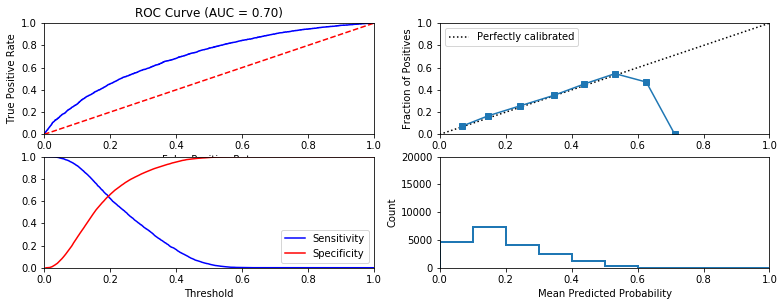


Similarity to LC grade ranking:  0.6939419341940657
Brier score: 0.15162103115461592
  Model: mlp
Fit time: 27.29 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79805
              precision    recall  f1-score   support

  No default     0.8031    0.9888    0.8863     15927
     Default     0.5434    0.0523    0.0954      4073

   micro avg     0.7981    0.7981    0.7981     20000
   macro avg     0.6733    0.5205    0.4909     20000
weighted avg     0.7502    0.7981    0.7253     20000



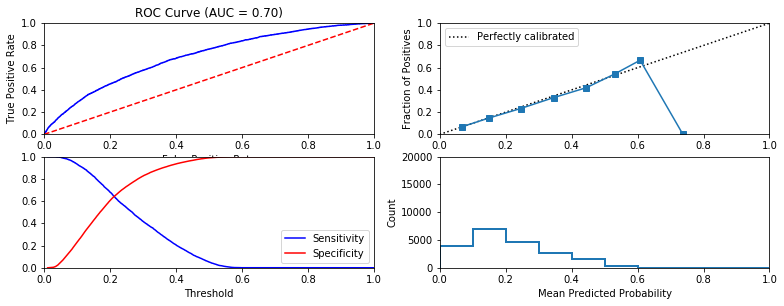


Similarity to LC grade ranking:  0.7043571485517547
Brier score: 0.14900251978139822
  Model: mlp
Fit time: 33.88 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79545
              precision    recall  f1-score   support

  No default     0.7985    0.9928    0.8851     15870
     Default     0.5730    0.0370    0.0696      4130

   micro avg     0.7954    0.7954    0.7955     20000
   macro avg     0.6857    0.5149    0.4773     20000
weighted avg     0.7519    0.7954    0.7167     20000



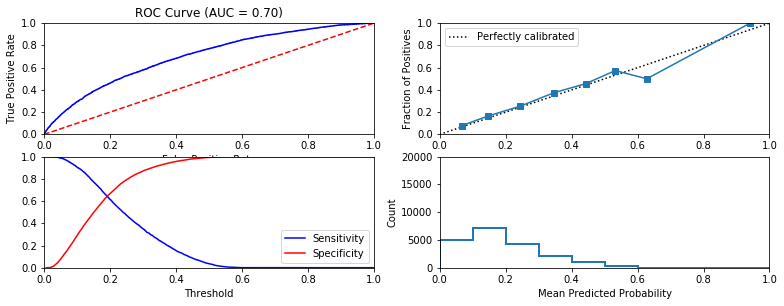


Similarity to LC grade ranking:  0.6981361457200583
Brier score: 0.14998017363469254
  Model: mlp
Fit time: 40.08 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7938
              precision    recall  f1-score   support

  No default     0.7970    0.9929    0.8842     15864
     Default     0.5254    0.0300    0.0567      4136

   micro avg     0.7938    0.7938    0.7938     20000
   macro avg     0.6612    0.5115    0.4705     20000
weighted avg     0.7408    0.7938    0.7131     20000



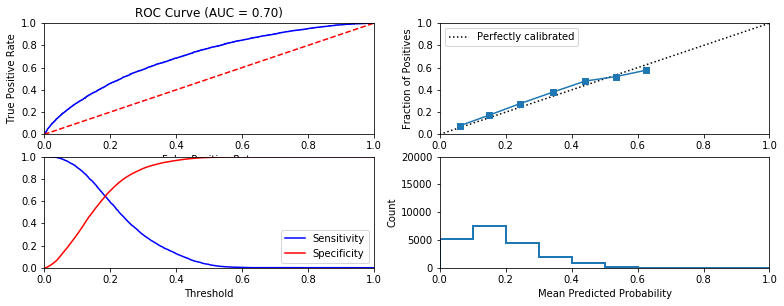


Similarity to LC grade ranking:  0.6965815717699507
Brier score: 0.15080458860324364
  Model: mlp
Fit time: 28.77 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7918
              precision    recall  f1-score   support

  No default     0.7938    0.9955    0.8833     15828
     Default     0.5267    0.0189    0.0366      4172

   micro avg     0.7918    0.7918    0.7918     20000
   macro avg     0.6602    0.5072    0.4599     20000
weighted avg     0.7381    0.7918    0.7067     20000



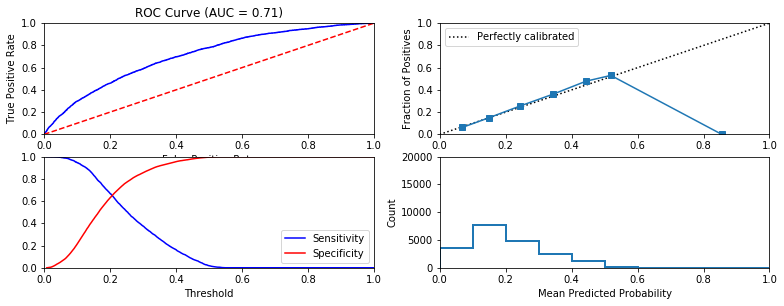


Similarity to LC grade ranking:  0.7113686069031565
Brier score: 0.15031868378477944
  Model: mlp
Fit time: 48.75 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79355
              precision    recall  f1-score   support

  No default     0.7978    0.9900    0.8836     15826
     Default     0.5620    0.0489    0.0899      4174

   micro avg     0.7935    0.7935    0.7935     20000
   macro avg     0.6799    0.5194    0.4867     20000
weighted avg     0.7486    0.7935    0.7179     20000



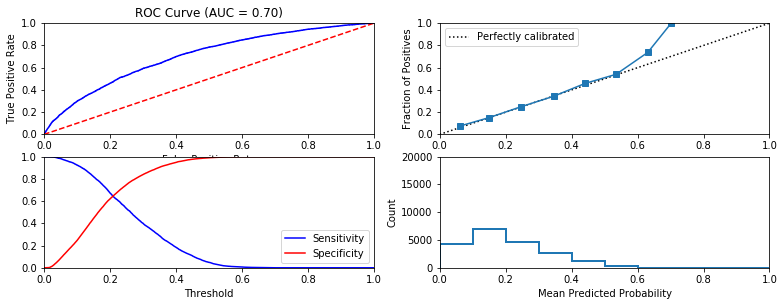


Similarity to LC grade ranking:  0.696047281981303
Brier score: 0.15040633217034816
  Model: mlp
Fit time: 37.38 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7965
              precision    recall  f1-score   support

  No default     0.7992    0.9936    0.8859     15895
     Default     0.5738    0.0331    0.0626      4105

   micro avg     0.7965    0.7965    0.7965     20000
   macro avg     0.6865    0.5134    0.4743     20000
weighted avg     0.7529    0.7965    0.7169     20000



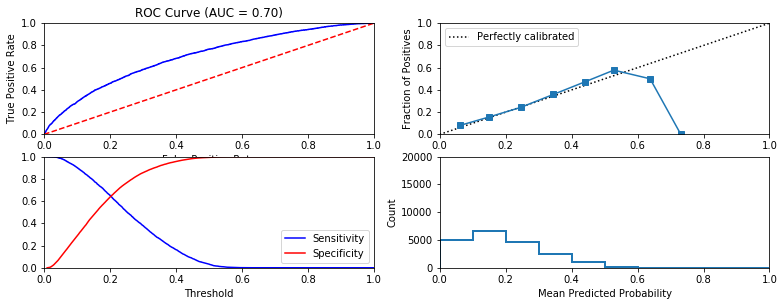


Similarity to LC grade ranking:  0.7116302476869318
Brier score: 0.14935647272744929
  Model: mlp
Fit time: 53.88 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79325
              precision    recall  f1-score   support

  No default     0.8008    0.9842    0.8831     15864
     Default     0.5010    0.0607    0.1083      4136

   micro avg     0.7933    0.7933    0.7932     20000
   macro avg     0.6509    0.5225    0.4957     20000
weighted avg     0.7388    0.7933    0.7228     20000



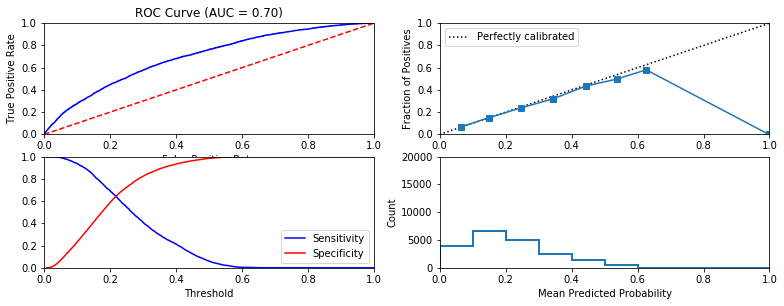


Similarity to LC grade ranking:  0.6762795476800469
Brier score: 0.15101400961067588
  Model: mlp
Fit time: 40.76 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.792
              precision    recall  f1-score   support

  No default     0.8002    0.9826    0.8820     15829
     Default     0.5098    0.0688    0.1213      4171

   micro avg     0.7920    0.7920    0.7920     20000
   macro avg     0.6550    0.5257    0.5016     20000
weighted avg     0.7396    0.7920    0.7234     20000



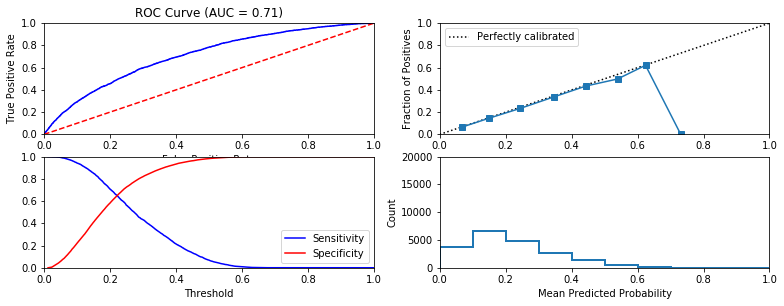


Similarity to LC grade ranking:  0.6950814628318166
Brier score: 0.15037555049660176
  Model: mlp
Fit time: 25.41 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79895
              precision    recall  f1-score   support

  No default     0.8031    0.9907    0.8871     15940
     Default     0.5582    0.0461    0.0851      4060

   micro avg     0.7990    0.7990    0.7990     20000
   macro avg     0.6806    0.5184    0.4861     20000
weighted avg     0.7533    0.7990    0.7243     20000



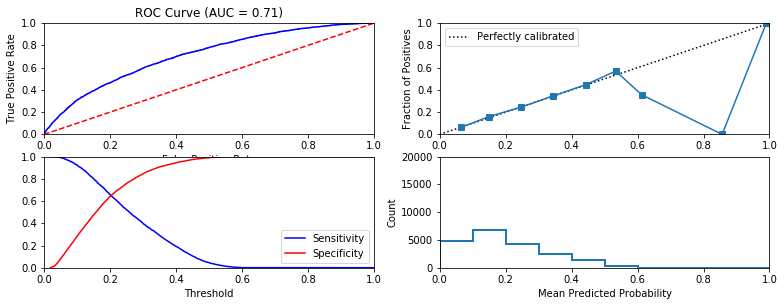


Similarity to LC grade ranking:  0.7160773442116203
Brier score: 0.14693381688503981
  Model: mlp
Fit time: 47.92 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79485
              precision    recall  f1-score   support

  No default     0.7989    0.9898    0.8842     15823
     Default     0.5934    0.0563    0.1028      4177

   micro avg     0.7948    0.7948    0.7948     20000
   macro avg     0.6962    0.5230    0.4935     20000
weighted avg     0.7560    0.7948    0.7210     20000



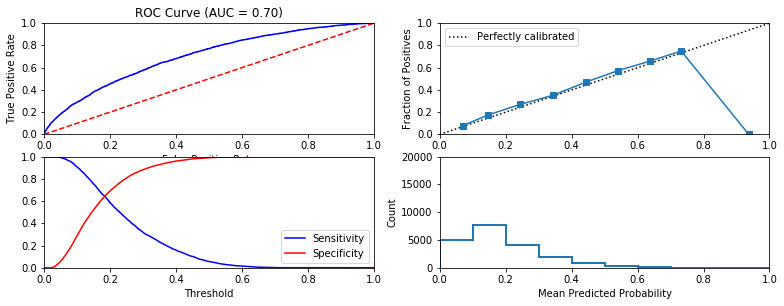


Similarity to LC grade ranking:  0.6903864573964829
Brier score: 0.15117947922469951
  Model: mlp
Fit time: 22.45 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.8014
              precision    recall  f1-score   support

  No default     0.8051    0.9916    0.8887     15990
     Default     0.5621    0.0429    0.0797      4010

   micro avg     0.8014    0.8014    0.8014     20000
   macro avg     0.6836    0.5173    0.4842     20000
weighted avg     0.7564    0.8014    0.7265     20000



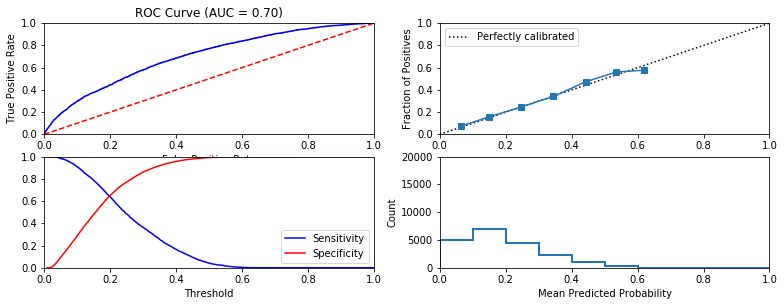


Similarity to LC grade ranking:  0.7137033105292058
Brier score: 0.14669289504550387
  Model: mlp
Fit time: 33.63 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79345
              precision    recall  f1-score   support

  No default     0.7965    0.9922    0.8837     15815
     Default     0.5900    0.0423    0.0789      4185

   micro avg     0.7934    0.7934    0.7934     20000
   macro avg     0.6933    0.5173    0.4813     20000
weighted avg     0.7533    0.7934    0.7153     20000



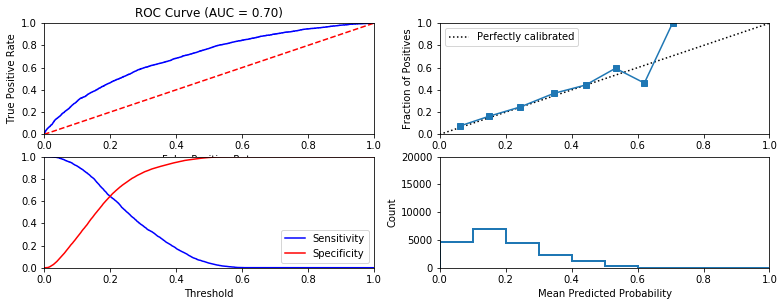


Similarity to LC grade ranking:  0.6868196996305085
Brier score: 0.15095428062441094
  Model: mlp
Fit time: 40.72 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79895
              precision    recall  f1-score   support

  No default     0.8049    0.9874    0.8869     15964
     Default     0.5180    0.0535    0.0970      4036

   micro avg     0.7990    0.7990    0.7990     20000
   macro avg     0.6615    0.5205    0.4919     20000
weighted avg     0.7470    0.7990    0.7275     20000



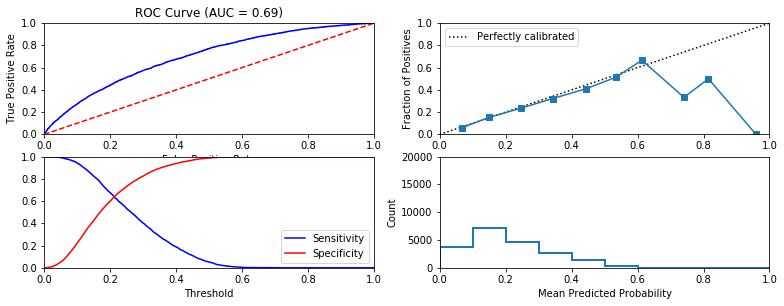


Similarity to LC grade ranking:  0.7001876254557421
Brier score: 0.14876317376410267
  Model: mlp
Fit time: 25.62 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79115
              precision    recall  f1-score   support

  No default     0.7965    0.9886    0.8822     15823
     Default     0.5000    0.0433    0.0798      4177

   micro avg     0.7912    0.7912    0.7912     20000
   macro avg     0.6483    0.5159    0.4810     20000
weighted avg     0.7346    0.7912    0.7146     20000



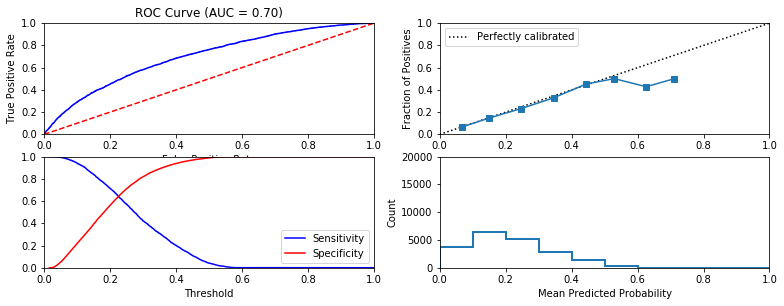


Similarity to LC grade ranking:  0.7202359201377633
Brier score: 0.1516373101754483
  Model: mlp
Fit time: 35.83 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79355
              precision    recall  f1-score   support

  No default     0.7956    0.9948    0.8841     15830
     Default     0.6000    0.0295    0.0562      4170

   micro avg     0.7935    0.7935    0.7935     20000
   macro avg     0.6978    0.5122    0.4702     20000
weighted avg     0.7548    0.7935    0.7115     20000



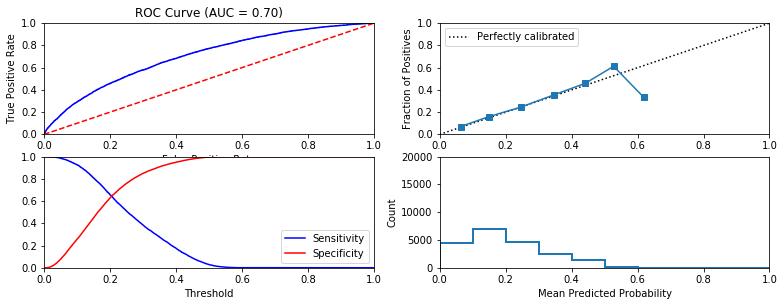


Similarity to LC grade ranking:  0.694955810203323
Brier score: 0.15086418466422982
  Model: mlp
Fit time: 45.86 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7969
              precision    recall  f1-score   support

  No default     0.7998    0.9936    0.8862     15920
     Default     0.5405    0.0294    0.0558      4080

   micro avg     0.7969    0.7969    0.7969     20000
   macro avg     0.6702    0.5115    0.4710     20000
weighted avg     0.7469    0.7969    0.7168     20000



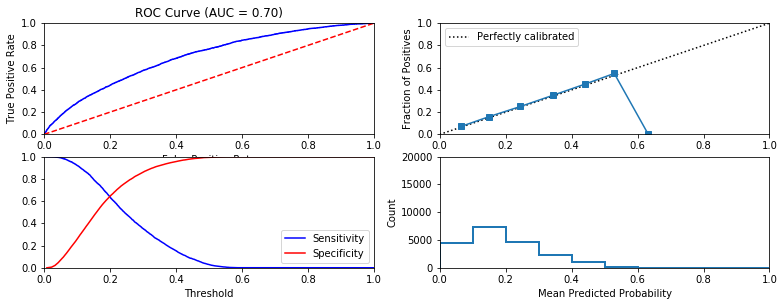


Similarity to LC grade ranking:  0.680353081046764
Brier score: 0.1493637968277633
  Model: mlp
Fit time: 29.87 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79475
              precision    recall  f1-score   support

  No default     0.7969    0.9946    0.8848     15854
     Default     0.5972    0.0304    0.0578      4146

   micro avg     0.7947    0.7947    0.7947     20000
   macro avg     0.6970    0.5125    0.4713     20000
weighted avg     0.7555    0.7947    0.7134     20000



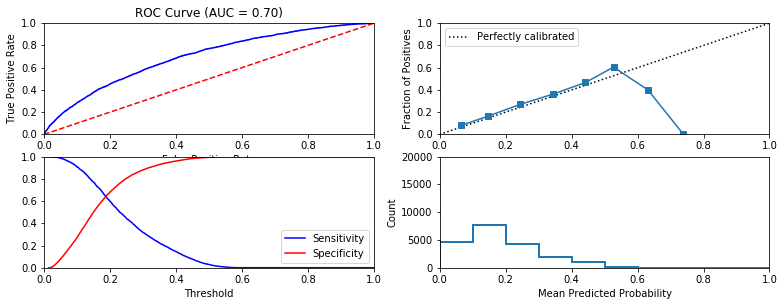


Similarity to LC grade ranking:  0.6914588398456164
Brier score: 0.15110932165550528
  Model: mlp
Fit time: 34.21 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7945
              precision    recall  f1-score   support

  No default     0.7992    0.9899    0.8843     15874
     Default     0.5237    0.0429    0.0793      4126

   micro avg     0.7945    0.7945    0.7945     20000
   macro avg     0.6614    0.5164    0.4818     20000
weighted avg     0.7423    0.7945    0.7183     20000



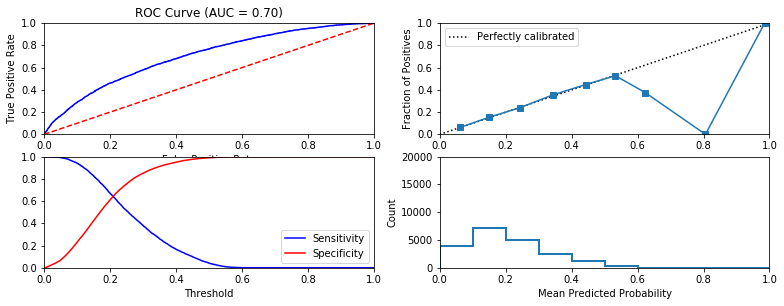


Similarity to LC grade ranking:  0.6940174724986024
Brier score: 0.14991804038085163
  Model: mlp
Fit time: 41.9 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79505
              precision    recall  f1-score   support

  No default     0.8006    0.9879    0.8844     15876
     Default     0.5306    0.0526    0.0957      4124

   micro avg     0.7951    0.7951    0.7951     20000
   macro avg     0.6656    0.5203    0.4901     20000
weighted avg     0.7449    0.7951    0.7218     20000



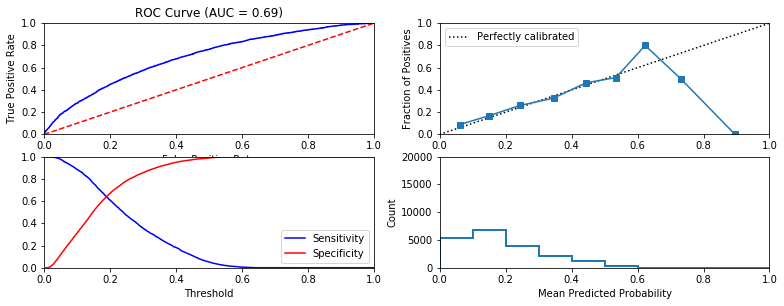


Similarity to LC grade ranking:  0.7153327248513579
Brier score: 0.1508061215046641
  Model: mlp
Fit time: 61.64 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79305
              precision    recall  f1-score   support

  No default     0.7971    0.9903    0.8833     15812
     Default     0.5686    0.0485    0.0893      4188

   micro avg     0.7931    0.7931    0.7931     20000
   macro avg     0.6829    0.5194    0.4863     20000
weighted avg     0.7493    0.7931    0.7170     20000



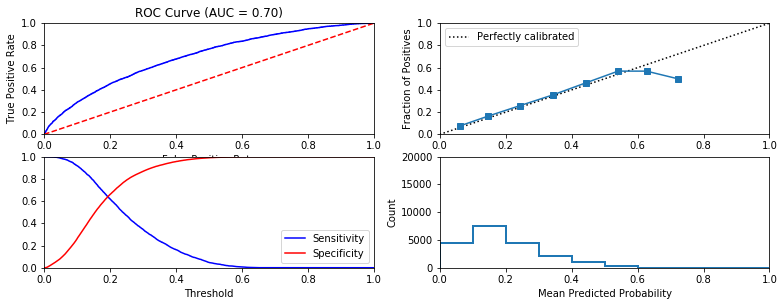


Similarity to LC grade ranking:  0.6968398610233709
Brier score: 0.1518289535527223
  Model: mlp
Fit time: 26.86 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7913
              precision    recall  f1-score   support

  No default     0.7936    0.9944    0.8828     15802
     Default     0.5600    0.0267    0.0509      4198

   micro avg     0.7913    0.7913    0.7913     20000
   macro avg     0.6768    0.5106    0.4668     20000
weighted avg     0.7446    0.7913    0.7082     20000



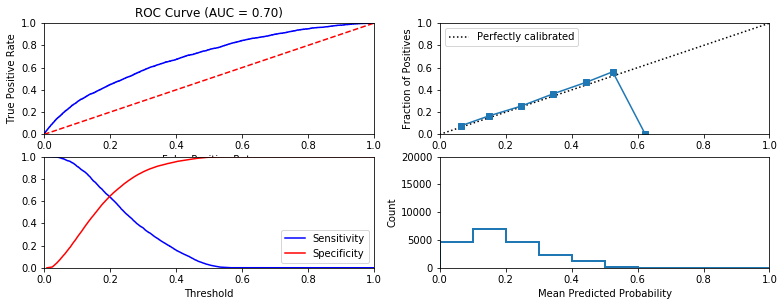


Similarity to LC grade ranking:  0.7029537088770903
Brier score: 0.15236301557408088
  Model: mlp
Fit time: 41.61 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79595
              precision    recall  f1-score   support

  No default     0.8007    0.9891    0.8850     15869
     Default     0.5631    0.0540    0.0985      4131

   micro avg     0.7960    0.7960    0.7960     20000
   macro avg     0.6819    0.5215    0.4917     20000
weighted avg     0.7516    0.7960    0.7225     20000



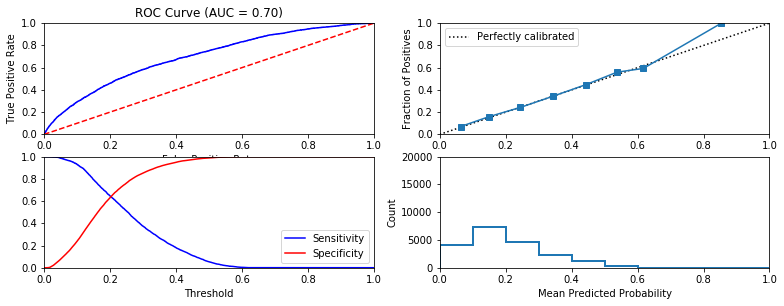


Similarity to LC grade ranking:  0.6818808720385643
Brier score: 0.15011248918106568
  Model: mlp
Fit time: 22.9 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79495
              precision    recall  f1-score   support

  No default     0.7966    0.9958    0.8851     15869
     Default     0.5926    0.0232    0.0447      4131

   micro avg     0.7950    0.7950    0.7950     20000
   macro avg     0.6946    0.5095    0.4649     20000
weighted avg     0.7545    0.7950    0.7116     20000



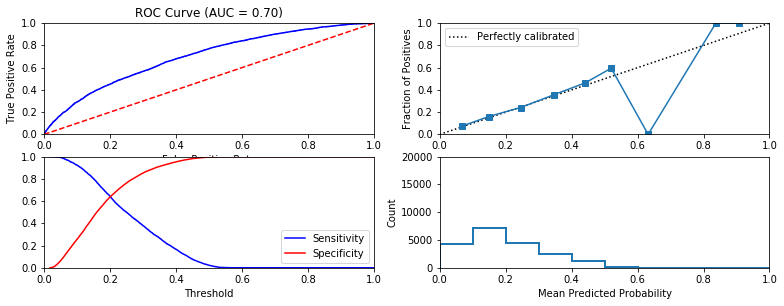


Similarity to LC grade ranking:  0.7321021121290446
Brier score: 0.15034328155195686
  Model: mlp
Fit time: 27.41 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7974
              precision    recall  f1-score   support

  No default     0.8002    0.9931    0.8863     15897
     Default     0.5948    0.0390    0.0732      4103

   micro avg     0.7974    0.7974    0.7974     20000
   macro avg     0.6975    0.5161    0.4797     20000
weighted avg     0.7580    0.7974    0.7195     20000



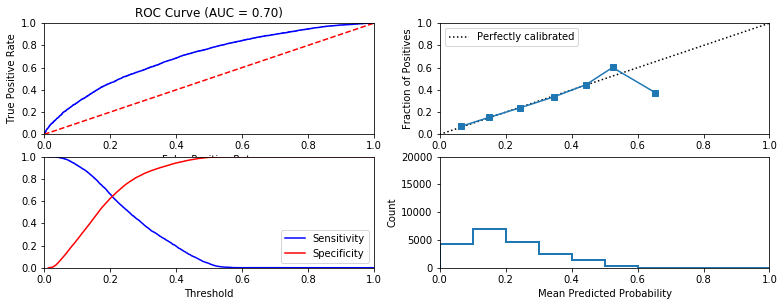


Similarity to LC grade ranking:  0.7130384784764743
Brier score: 0.14922914274184634
  Model: mlp
Fit time: 37.39 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.80015
              precision    recall  f1-score   support

  No default     0.8100    0.9795    0.8867     15971
     Default     0.5233    0.0894    0.1526      4029

   micro avg     0.8002    0.8002    0.8002     20000
   macro avg     0.6666    0.5344    0.5197     20000
weighted avg     0.7522    0.8002    0.7388     20000



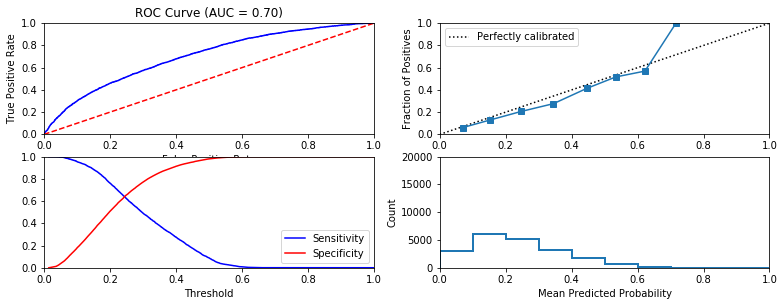


Similarity to LC grade ranking:  0.7015637438156663
Brier score: 0.1484720404984675
  Model: mlp
Fit time: 28.45 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7919
              precision    recall  f1-score   support

  No default     0.7997    0.9831    0.8820     15817
     Default     0.5189    0.0689    0.1216      4183

   micro avg     0.7919    0.7919    0.7919     20000
   macro avg     0.6593    0.5260    0.5018     20000
weighted avg     0.7410    0.7919    0.7229     20000



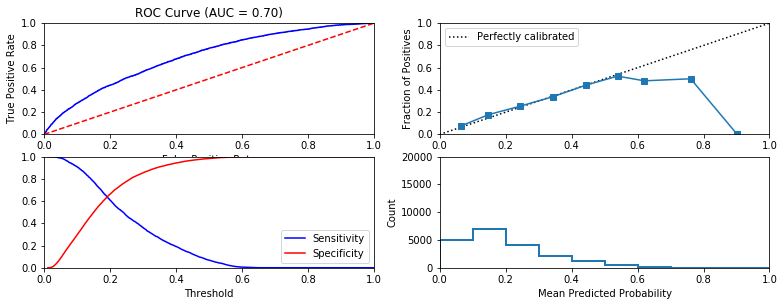


Similarity to LC grade ranking:  0.721246379894612
Brier score: 0.1522543132894243
  Model: mlp
Fit time: 60.74 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7985
              precision    recall  f1-score   support

  No default     0.8092    0.9779    0.8856     15950
     Default     0.5138    0.0919    0.1558      4050

   micro avg     0.7985    0.7985    0.7985     20000
   macro avg     0.6615    0.5349    0.5207     20000
weighted avg     0.7494    0.7985    0.7378     20000



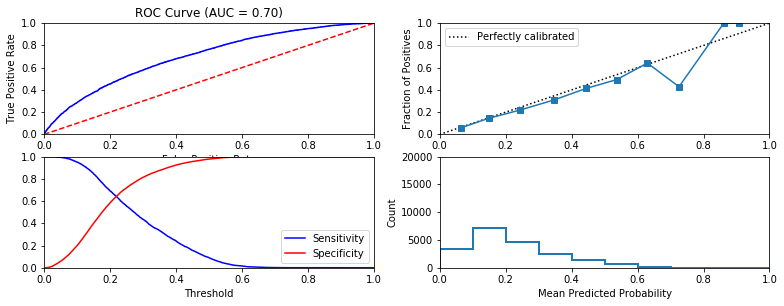


Similarity to LC grade ranking:  0.7118798270228148
Brier score: 0.1483718497707696
  Model: mlp
Fit time: 34.51 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79115
              precision    recall  f1-score   support

  No default     0.8007    0.9788    0.8808     15773
     Default     0.5347    0.0911    0.1556      4227

   micro avg     0.7912    0.7912    0.7912     20000
   macro avg     0.6677    0.5349    0.5182     20000
weighted avg     0.7445    0.7912    0.7276     20000



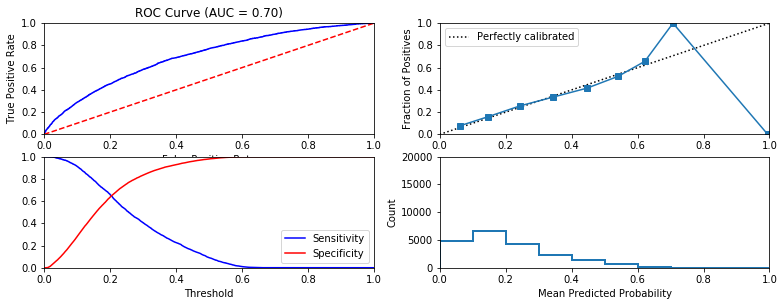


Similarity to LC grade ranking:  0.7114123030084116
Brier score: 0.15247003482442056
  Model: mlp
Fit time: 32.27 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79815
              precision    recall  f1-score   support

  No default     0.8012    0.9932    0.8869     15944
     Default     0.5404    0.0313    0.0592      4056

   micro avg     0.7982    0.7982    0.7982     20000
   macro avg     0.6708    0.5123    0.4731     20000
weighted avg     0.7483    0.7982    0.7191     20000



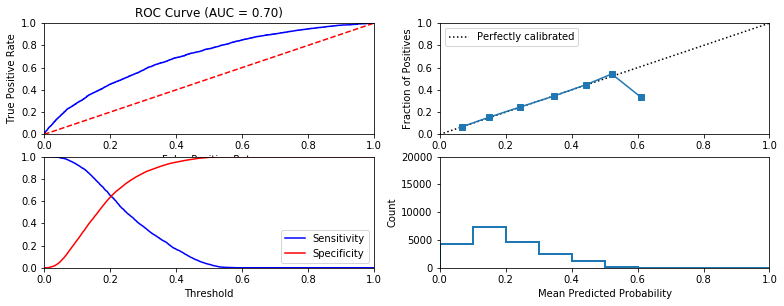


Similarity to LC grade ranking:  0.7091050813578964
Brier score: 0.14843212872554365
  Model: mlp
Fit time: 38.51 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79375
              precision    recall  f1-score   support

  No default     0.7985    0.9899    0.8840     15874
     Default     0.5015    0.0393    0.0728      4126

   micro avg     0.7937    0.7937    0.7937     20000
   macro avg     0.6500    0.5146    0.4784     20000
weighted avg     0.7373    0.7937    0.7166     20000



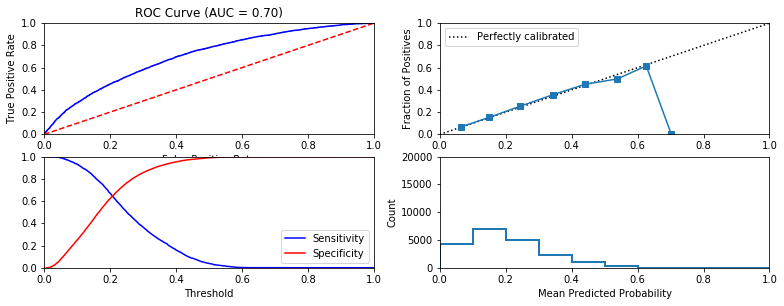


Similarity to LC grade ranking:  0.7040118084763426
Brier score: 0.15001171374868155
  Model: mlp
Fit time: 33.1 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7997
              precision    recall  f1-score   support

  No default     0.8081    0.9825    0.8868     15972
     Default     0.5189    0.0750    0.1310      4028

   micro avg     0.7997    0.7997    0.7997     20000
   macro avg     0.6635    0.5287    0.5089     20000
weighted avg     0.7499    0.7997    0.7346     20000



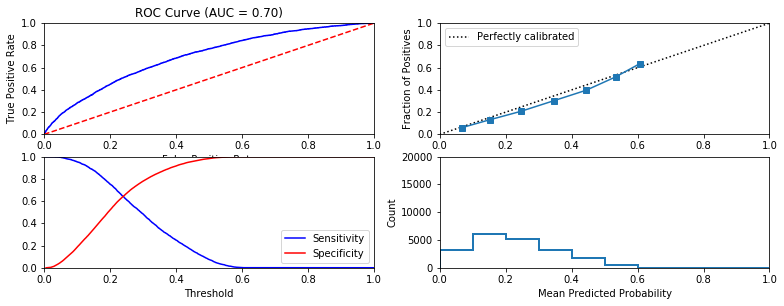


Similarity to LC grade ranking:  0.7016679849573928
Brier score: 0.14865257086273556
  Model: mlp
Fit time: 28.06 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.78875
              precision    recall  f1-score   support

  No default     0.7928    0.9911    0.8809     15764
     Default     0.5188    0.0359    0.0671      4236

   micro avg     0.7887    0.7887    0.7887     20000
   macro avg     0.6558    0.5135    0.4740     20000
weighted avg     0.7347    0.7887    0.7085     20000



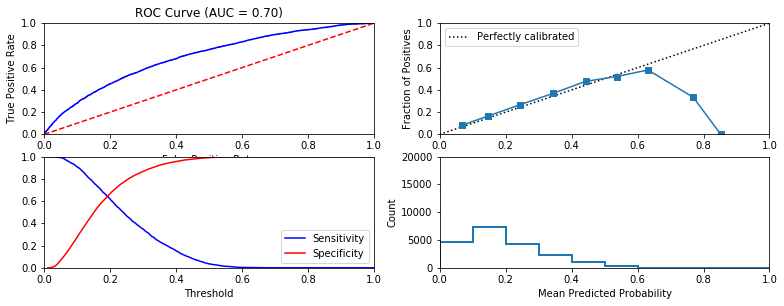


Similarity to LC grade ranking:  0.7143732665602635
Brier score: 0.1535923145614821
  Model: mlp
Fit time: 30.2 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7939
              precision    recall  f1-score   support

  No default     0.8039    0.9790    0.8829     15865
     Default     0.5096    0.0837    0.1437      4135

   micro avg     0.7939    0.7939    0.7939     20000
   macro avg     0.6567    0.5313    0.5133     20000
weighted avg     0.7430    0.7939    0.7300     20000



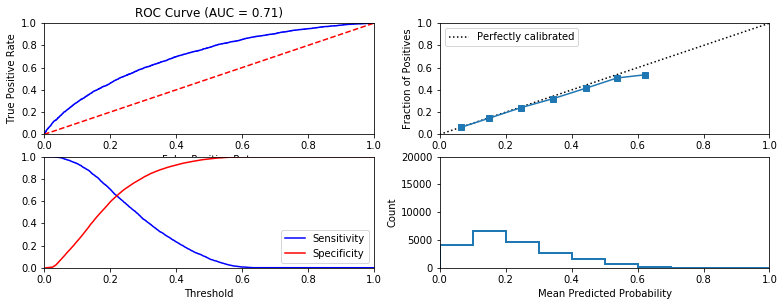


Similarity to LC grade ranking:  0.7016825260959038
Brier score: 0.14967151938623
  Model: mlp
Fit time: 27.15 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7979
              precision    recall  f1-score   support

  No default     0.8019    0.9911    0.8865     15925
     Default     0.5521    0.0429    0.0797      4075

   micro avg     0.7979    0.7979    0.7979     20000
   macro avg     0.6770    0.5170    0.4831     20000
weighted avg     0.7510    0.7979    0.7221     20000



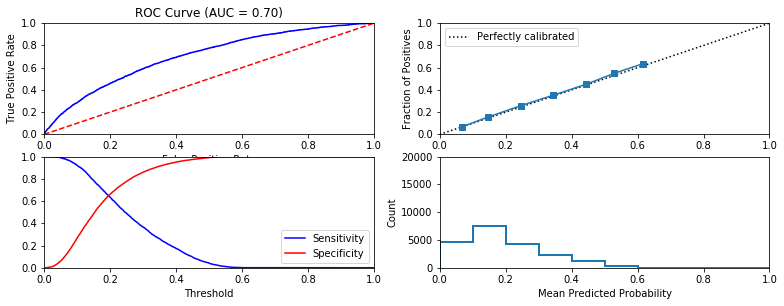


Similarity to LC grade ranking:  0.6920565278636621
Brier score: 0.1483287171942948
  Model: mlp
Fit time: 28.81 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79425
              precision    recall  f1-score   support

  No default     0.7986    0.9911    0.8845     15898
     Default     0.4758    0.0312    0.0586      4102

   micro avg     0.7943    0.7943    0.7943     20000
   macro avg     0.6372    0.5112    0.4715     20000
weighted avg     0.7324    0.7943    0.7151     20000



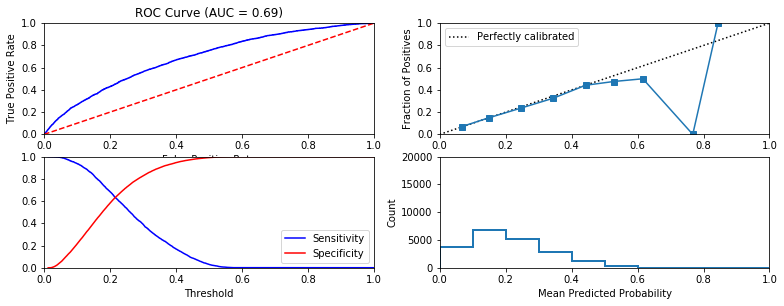


Similarity to LC grade ranking:  0.6902258015761962
Brier score: 0.1513222123856925
  Model: mlp
Fit time: 31.35 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79525
              precision    recall  f1-score   support

  No default     0.8042    0.9811    0.8839     15883
     Default     0.5177    0.0782    0.1359      4117

   micro avg     0.7953    0.7953    0.7953     20000
   macro avg     0.6609    0.5297    0.5099     20000
weighted avg     0.7452    0.7953    0.7299     20000



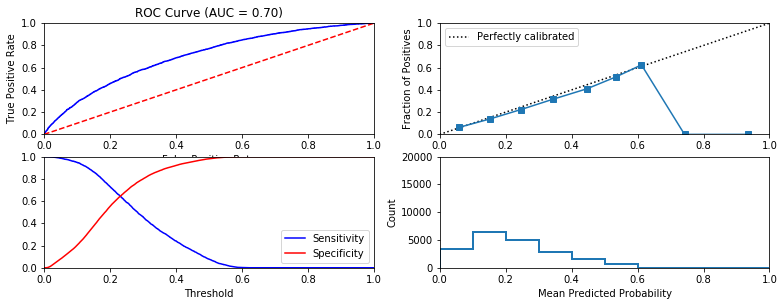


Similarity to LC grade ranking:  0.7136565841116164
Brier score: 0.15016465538095808
  Model: mlp
Fit time: 33.16 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7943
              precision    recall  f1-score   support

  No default     0.7989    0.9902    0.8843     15879
     Default     0.5110    0.0396    0.0734      4121

   micro avg     0.7943    0.7943    0.7943     20000
   macro avg     0.6549    0.5149    0.4789     20000
weighted avg     0.7396    0.7943    0.7172     20000



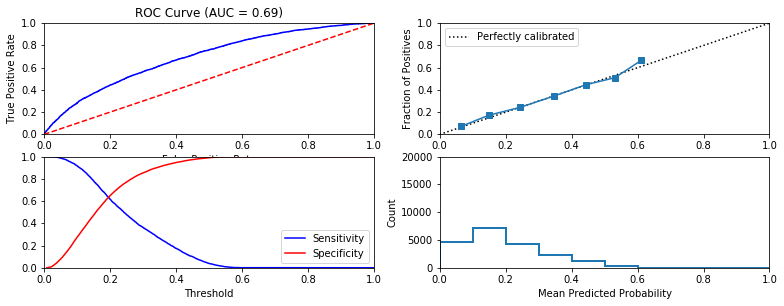


Similarity to LC grade ranking:  0.6980402491381906
Brier score: 0.15093418086020927
  Model: mlp
Fit time: 51.53 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7957
              precision    recall  f1-score   support

  No default     0.8018    0.9869    0.8848     15894
     Default     0.5229    0.0555    0.1004      4106

   micro avg     0.7957    0.7957    0.7957     20000
   macro avg     0.6624    0.5212    0.4926     20000
weighted avg     0.7445    0.7957    0.7237     20000



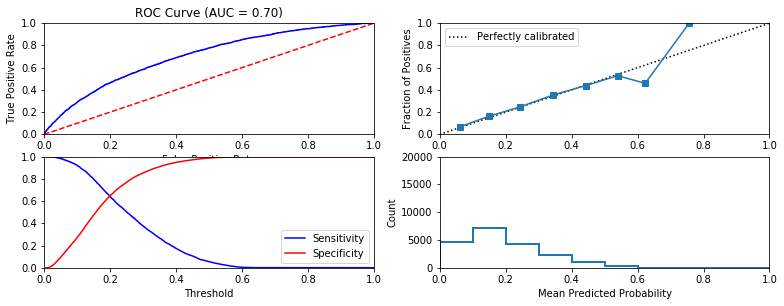


Similarity to LC grade ranking:  0.7015759200491403
Brier score: 0.1492426624808179
  Model: mlp
Fit time: 61.6 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79665
              precision    recall  f1-score   support

  No default     0.8009    0.9910    0.8858     15923
     Default     0.5169    0.0375    0.0700      4077

   micro avg     0.7966    0.7966    0.7966     20000
   macro avg     0.6589    0.5143    0.4779     20000
weighted avg     0.7430    0.7966    0.7195     20000



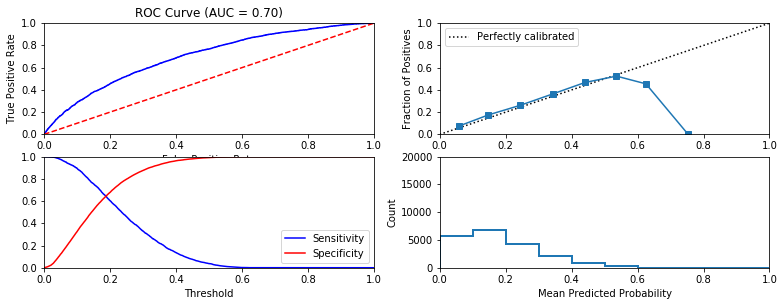


Similarity to LC grade ranking:  0.7094787720818772
Brier score: 0.14930656639547601
  Model: mlp
Fit time: 37.92 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79315
              precision    recall  f1-score   support

  No default     0.8002    0.9843    0.8828     15825
     Default     0.5356    0.0685    0.1215      4175

   micro avg     0.7932    0.7932    0.7932     20000
   macro avg     0.6679    0.5264    0.5021     20000
weighted avg     0.7450    0.7932    0.7239     20000



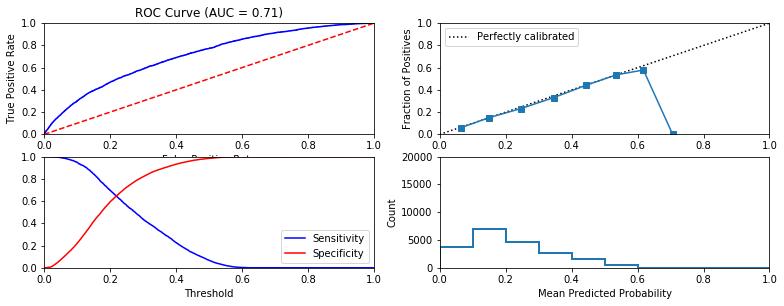


Similarity to LC grade ranking:  0.6935728861151855
Brier score: 0.1500627855205292
  Model: mlp
Fit time: 28.06 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7898
              precision    recall  f1-score   support

  No default     0.7925    0.9937    0.8818     15774
     Default     0.5500    0.0286    0.0544      4226

   micro avg     0.7898    0.7898    0.7898     20000
   macro avg     0.6712    0.5112    0.4681     20000
weighted avg     0.7412    0.7898    0.7069     20000



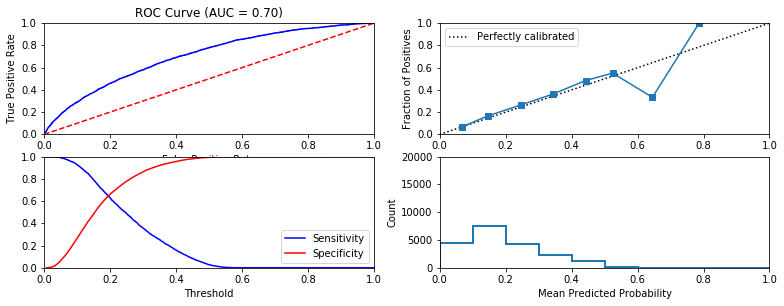


Similarity to LC grade ranking:  0.6855434986655908
Brier score: 0.1520869386230469
  Model: mlp
Fit time: 32.93 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.8005
              precision    recall  f1-score   support

  No default     0.8050    0.9903    0.8881     15990
     Default     0.5303    0.0436    0.0806      4010

   micro avg     0.8005    0.8005    0.8005     20000
   macro avg     0.6677    0.5170    0.4844     20000
weighted avg     0.7499    0.8005    0.7262     20000



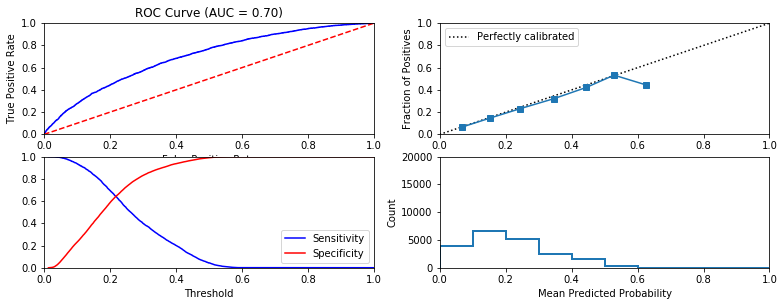


Similarity to LC grade ranking:  0.7044704193335398
Brier score: 0.14776004430020717
  Model: mlp
Fit time: 30.1 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.78855
              precision    recall  f1-score   support

  No default     0.7991    0.9785    0.8797     15805
     Default     0.4737    0.0729    0.1264      4195

   micro avg     0.7885    0.7885    0.7885     20000
   macro avg     0.6364    0.5257    0.5031     20000
weighted avg     0.7308    0.7885    0.7217     20000



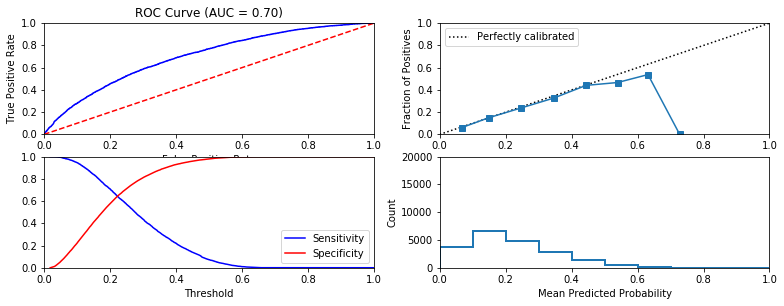


Similarity to LC grade ranking:  0.6831696689246921
Brier score: 0.15206693087648068
  Model: mlp
Fit time: 40.2 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79645
              precision    recall  f1-score   support

  No default     0.8044    0.9826    0.8846     15885
     Default     0.5369    0.0778    0.1359      4115

   micro avg     0.7964    0.7964    0.7964     20000
   macro avg     0.6707    0.5302    0.5102     20000
weighted avg     0.7494    0.7964    0.7306     20000



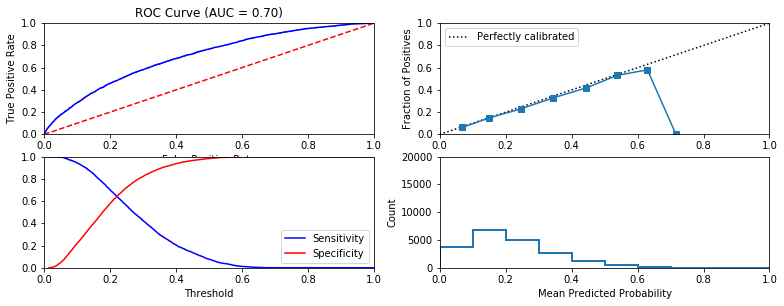


Similarity to LC grade ranking:  0.6875170537038456
Brier score: 0.14961918063437768
  Model: mlp
Fit time: 19.56 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7921
              precision    recall  f1-score   support

  No default     0.8013    0.9800    0.8817     15812
     Default     0.5227    0.0826    0.1427      4188

   micro avg     0.7921    0.7921    0.7921     20000
   macro avg     0.6620    0.5313    0.5122     20000
weighted avg     0.7430    0.7921    0.7270     20000



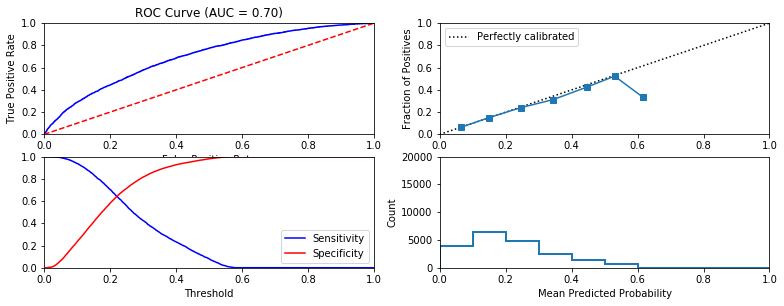


Similarity to LC grade ranking:  0.7077231598589013
Brier score: 0.1517204881764245
  Model: mlp
Fit time: 68.93 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7932
              precision    recall  f1-score   support

  No default     0.8023    0.9807    0.8825     15844
     Default     0.5158    0.0784    0.1362      4156

   micro avg     0.7932    0.7932    0.7932     20000
   macro avg     0.6590    0.5296    0.5094     20000
weighted avg     0.7427    0.7932    0.7274     20000



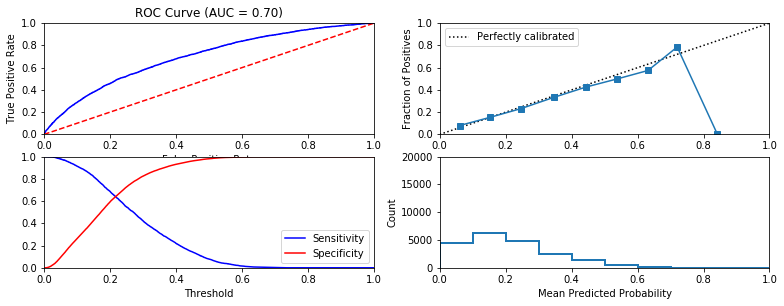


Similarity to LC grade ranking:  0.6520357481360717
Brier score: 0.15114331607831522
  Model: mlp
Fit time: 23.02 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79725
              precision    recall  f1-score   support

  No default     0.8020    0.9893    0.8859     15909
     Default     0.5479    0.0504    0.0922      4091

   micro avg     0.7973    0.7973    0.7973     20000
   macro avg     0.6750    0.5198    0.4891     20000
weighted avg     0.7500    0.7973    0.7235     20000



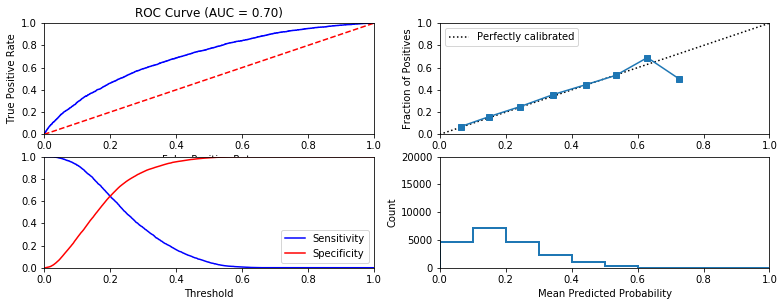


Similarity to LC grade ranking:  0.6928339971704297
Brier score: 0.14880053219180614
  Model: mlp
Fit time: 24.9 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79445
              precision    recall  f1-score   support

  No default     0.7986    0.9911    0.8845     15885
     Default     0.5070    0.0352    0.0659      4115

   micro avg     0.7944    0.7944    0.7944     20000
   macro avg     0.6528    0.5132    0.4752     20000
weighted avg     0.7386    0.7944    0.7161     20000



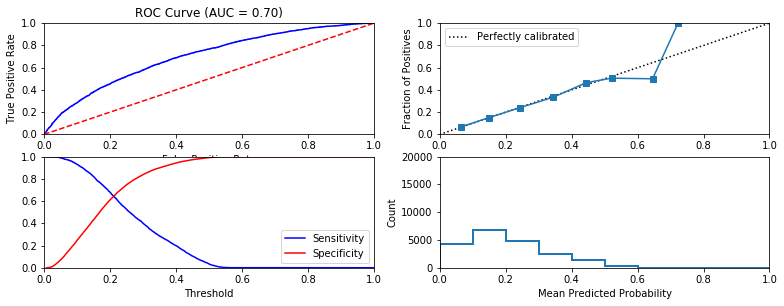


Similarity to LC grade ranking:  0.6894443515732678
Brier score: 0.1496204114567239
  Model: mlp
Fit time: 51.24 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79445
              precision    recall  f1-score   support

  No default     0.8037    0.9801    0.8832     15853
     Default     0.5270    0.0846    0.1459      4147

   micro avg     0.7944    0.7944    0.7944     20000
   macro avg     0.6653    0.5324    0.5145     20000
weighted avg     0.7463    0.7944    0.7303     20000



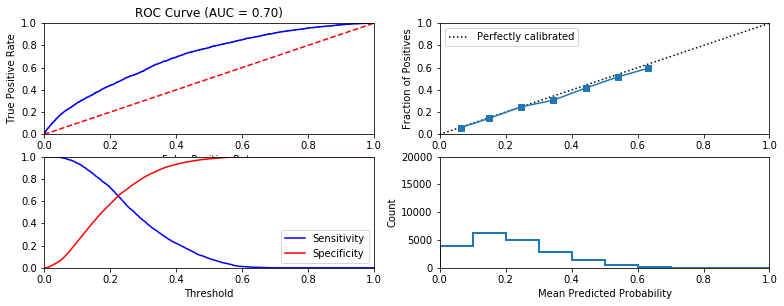


Similarity to LC grade ranking:  0.700204711242627
Brier score: 0.15052277716205442
  Model: mlp
Fit time: 33.93 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7948
              precision    recall  f1-score   support

  No default     0.7983    0.9923    0.8848     15884
     Default     0.5233    0.0328    0.0617      4116

   micro avg     0.7948    0.7948    0.7948     20000
   macro avg     0.6608    0.5125    0.4733     20000
weighted avg     0.7417    0.7948    0.7154     20000



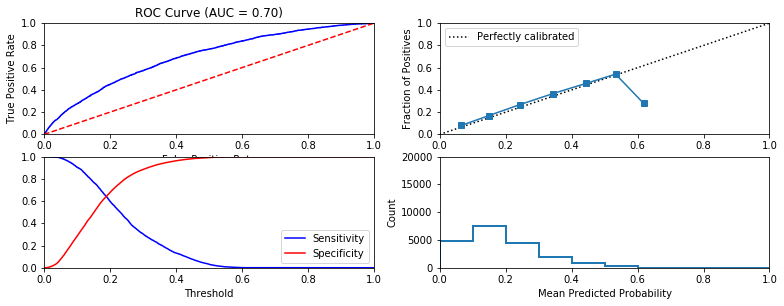


Similarity to LC grade ranking:  0.6952956484862133
Brier score: 0.15077341199692781
  Model: mlp
Fit time: 26.75 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79075
              precision    recall  f1-score   support

  No default     0.7990    0.9823    0.8812     15806
     Default     0.5079    0.0687    0.1210      4194

   micro avg     0.7907    0.7907    0.7907     20000
   macro avg     0.6535    0.5255    0.5011     20000
weighted avg     0.7380    0.7907    0.7218     20000



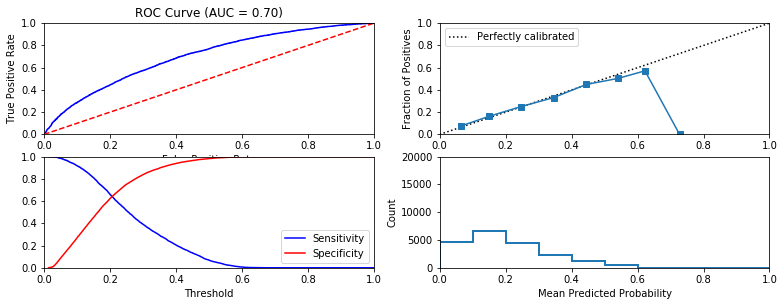


Similarity to LC grade ranking:  0.7045665715473481
Brier score: 0.1519119777641009
  Model: mlp
Fit time: 36.86 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79555
              precision    recall  f1-score   support

  No default     0.8035    0.9833    0.8843     15894
     Default     0.5155    0.0689    0.1216      4106

   micro avg     0.7955    0.7955    0.7955     20000
   macro avg     0.6595    0.5261    0.5030     20000
weighted avg     0.7443    0.7955    0.7277     20000



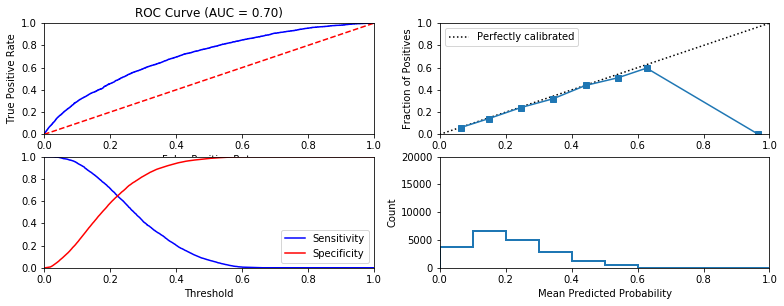


Similarity to LC grade ranking:  0.6770578271470561
Brier score: 0.14899209098774882
  Model: mlp
Fit time: 31.38 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7962
              precision    recall  f1-score   support

  No default     0.8018    0.9880    0.8852     15908
     Default     0.5201    0.0506    0.0922      4092

   micro avg     0.7962    0.7962    0.7962     20000
   macro avg     0.6610    0.5193    0.4887     20000
weighted avg     0.7442    0.7962    0.7230     20000



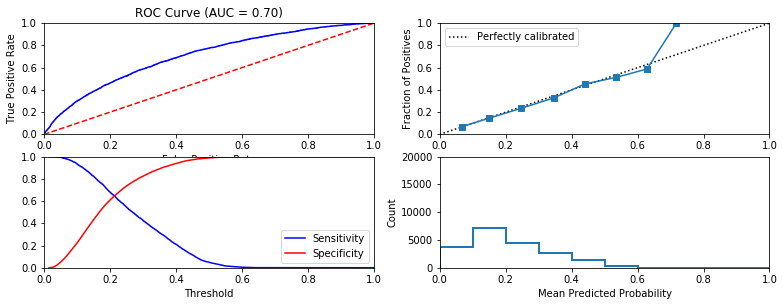


Similarity to LC grade ranking:  0.6676450154762196
Brier score: 0.14859133927516396
  Model: mlp
Fit time: 31.59 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7941
              precision    recall  f1-score   support

  No default     0.7979    0.9912    0.8841     15849
     Default     0.5527    0.0417    0.0775      4151

   micro avg     0.7941    0.7941    0.7941     20000
   macro avg     0.6753    0.5164    0.4808     20000
weighted avg     0.7470    0.7941    0.7167     20000



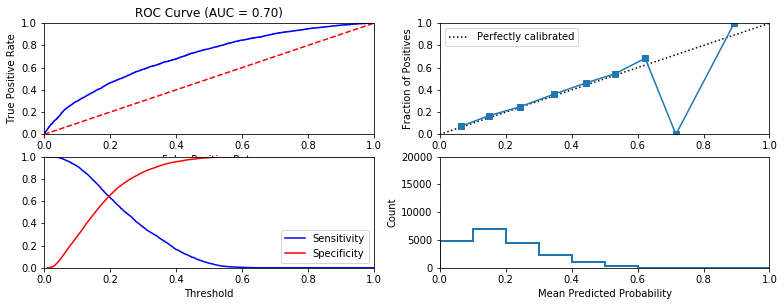


Similarity to LC grade ranking:  0.7125107227115067
Brier score: 0.15020509482505542
  Model: mlp
Fit time: 33.81 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7877
              precision    recall  f1-score   support

  No default     0.7898    0.9945    0.8804     15715
     Default     0.5924    0.0292    0.0556      4285

   micro avg     0.7877    0.7877    0.7877     20000
   macro avg     0.6911    0.5118    0.4680     20000
weighted avg     0.7475    0.7877    0.7037     20000



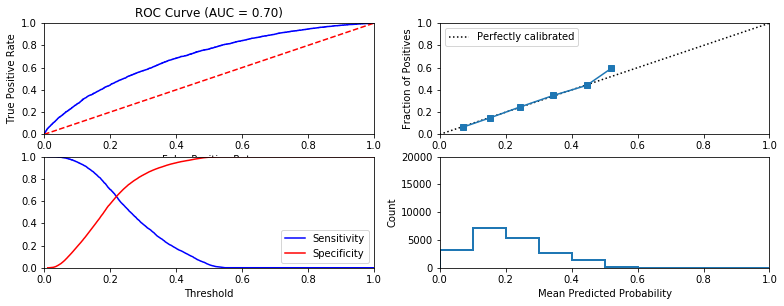


Similarity to LC grade ranking:  0.689311970459518
Brier score: 0.15456377812586702
  Model: mlp
Fit time: 30.33 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7917
              precision    recall  f1-score   support

  No default     0.7986    0.9857    0.8824     15852
     Default     0.4793    0.0501    0.0908      4148

   micro avg     0.7917    0.7917    0.7917     20000
   macro avg     0.6389    0.5179    0.4866     20000
weighted avg     0.7324    0.7917    0.7182     20000



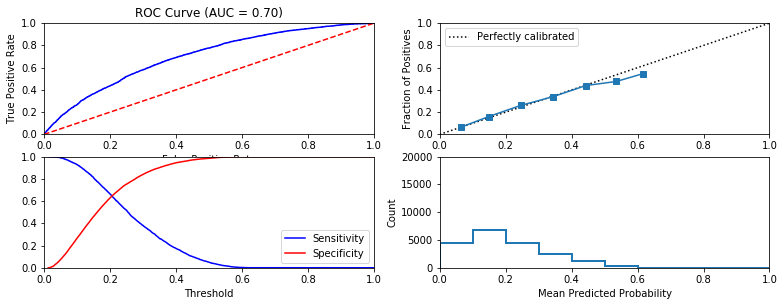


Similarity to LC grade ranking:  0.7086574743428269
Brier score: 0.15119250764234293
  Model: mlp
Fit time: 24.37 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79475
              precision    recall  f1-score   support

  No default     0.8034    0.9813    0.8835     15866
     Default     0.5233    0.0786    0.1367      4134

   micro avg     0.7947    0.7947    0.7947     20000
   macro avg     0.6634    0.5300    0.5101     20000
weighted avg     0.7456    0.7947    0.7292     20000



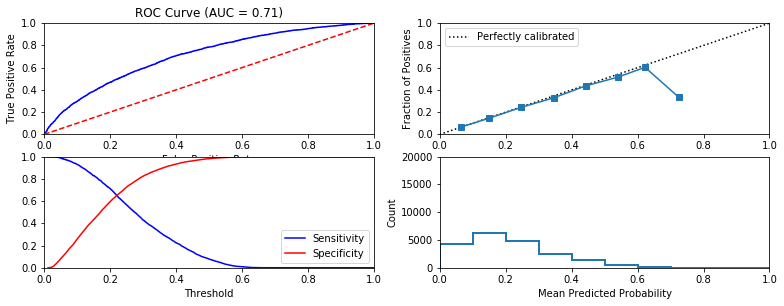


Similarity to LC grade ranking:  0.6952545992933462
Brier score: 0.1489784758107282
  Model: mlp
Fit time: 31.07 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79335
              precision    recall  f1-score   support

  No default     0.7979    0.9896    0.8835     15833
     Default     0.5467    0.0478    0.0878      4167

   micro avg     0.7933    0.7933    0.7934     20000
   macro avg     0.6723    0.5187    0.4857     20000
weighted avg     0.7456    0.7933    0.7177     20000



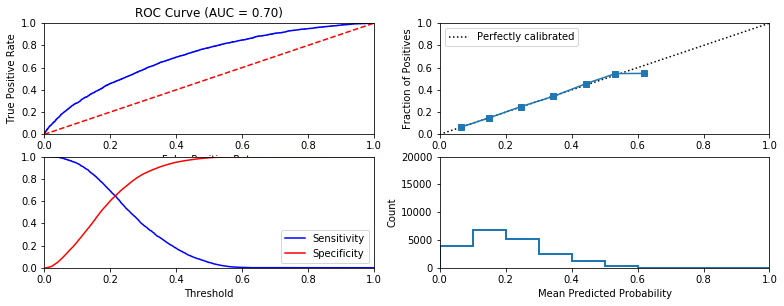


Similarity to LC grade ranking:  0.6509414349687197
Brier score: 0.1506949778233814
  Model: mlp
Fit time: 37.06 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79205
              precision    recall  f1-score   support

  No default     0.7955    0.9920    0.8829     15810
     Default     0.5548    0.0375    0.0702      4190

   micro avg     0.7921    0.7921    0.7921     20000
   macro avg     0.6751    0.5148    0.4766     20000
weighted avg     0.7450    0.7921    0.7127     20000



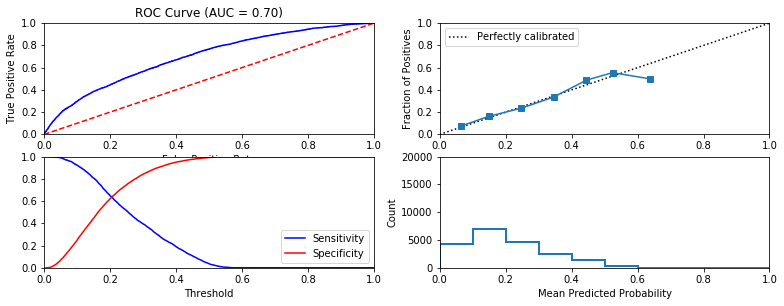


Similarity to LC grade ranking:  0.6965486302948123
Brier score: 0.15165426281874
  Model: mlp
Fit time: 40.98 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7954
              precision    recall  f1-score   support

  No default     0.8002    0.9892    0.8847     15872
     Default     0.5476    0.0501    0.0919      4128

   micro avg     0.7954    0.7954    0.7954     20000
   macro avg     0.6739    0.5197    0.4883     20000
weighted avg     0.7480    0.7954    0.7211     20000



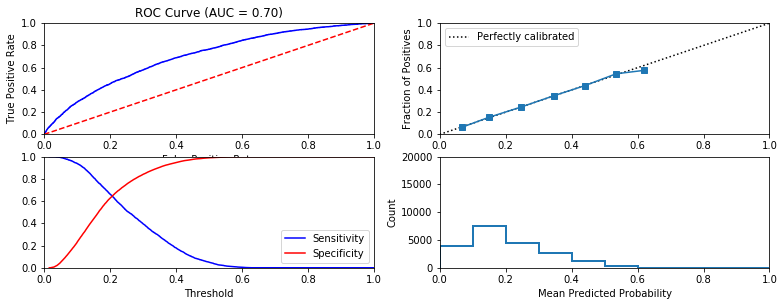


Similarity to LC grade ranking:  0.7119900982551696
Brier score: 0.1499844880873492
  Model: mlp
Fit time: 31.02 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7895
              precision    recall  f1-score   support

  No default     0.8002    0.9774    0.8800     15790
     Default     0.5000    0.0848    0.1450      4210

   micro avg     0.7895    0.7895    0.7895     20000
   macro avg     0.6501    0.5311    0.5125     20000
weighted avg     0.7370    0.7895    0.7253     20000



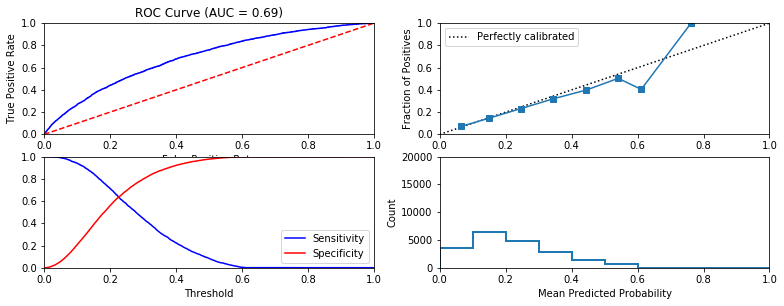


Similarity to LC grade ranking:  0.6994317778783504
Brier score: 0.15394551927459152
  Model: mlp
Fit time: 33.68 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.79
              precision    recall  f1-score   support

  No default     0.7992    0.9812    0.8809     15828
     Default     0.4754    0.0647    0.1139      4172

   micro avg     0.7900    0.7900    0.7900     20000
   macro avg     0.6373    0.5229    0.4974     20000
weighted avg     0.7316    0.7900    0.7209     20000



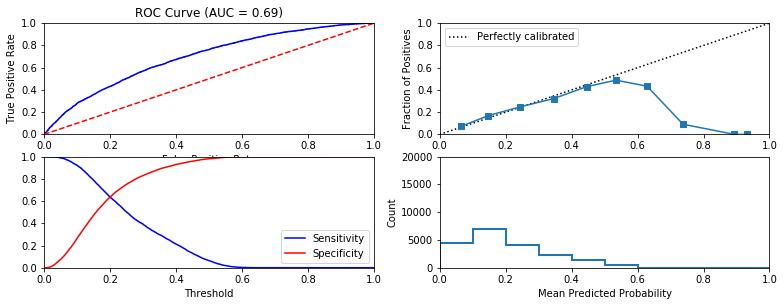


Similarity to LC grade ranking:  0.6871352975972913
Brier score: 0.15304180783262433
  Model: mlp
Fit time: 22.93 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7952
              precision    recall  f1-score   support

  No default     0.8027    0.9849    0.8845     15923
     Default     0.4794    0.0542    0.0974      4077

   micro avg     0.7952    0.7952    0.7952     20000
   macro avg     0.6410    0.5196    0.4909     20000
weighted avg     0.7368    0.7952    0.7240     20000



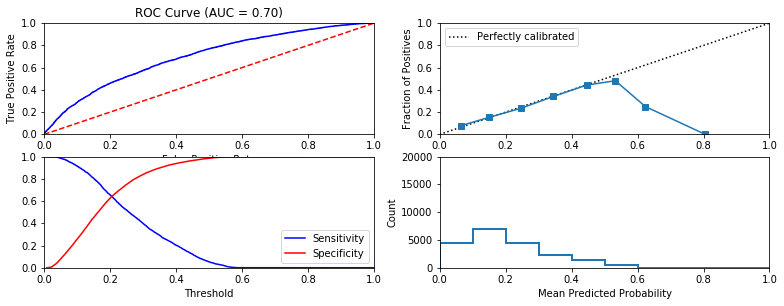


Similarity to LC grade ranking:  0.7331926685544174
Brier score: 0.149272336967474
  Model: mlp
Fit time: 35.67 seconds
Optimal parameters:
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (30, 40), 'learning_rate': 'invscaling', 'solver': 'adam'}

Chosen threshold was: 0.5
Accuracy:  0.7927
              precision    recall  f1-score   support

  No default     0.7990    0.9864    0.8829     15842
     Default     0.5136    0.0546    0.0987      4158

   micro avg     0.7927    0.7927    0.7927     20000
   macro avg     0.6563    0.5205    0.4908     20000
weighted avg     0.7397    0.7927    0.7198     20000



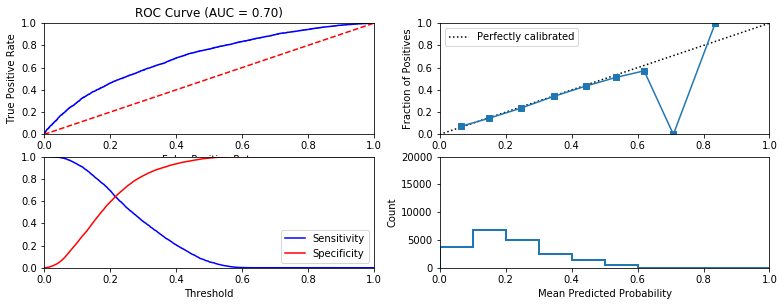


Similarity to LC grade ranking:  0.6665832528685647
Brier score: 0.15104654107113427
f1_score_no_default Mean:  0.8839402167225835 f1_score_no_default Standard Deviation:  2.220446049250313e-16
f1_score_default Mean:  0.12170215407536157 f1_score_default Standard Deviation:  1.3877787807814457e-17


In [88]:

params = {'activation': ['relu'], 'alpha': [0.0001], 'hidden_layer_sizes': [(30,40)], 'learning_rate': ['invscaling'], 'solver': ['adam']}
f1_scores_no_default = []
f1_scores_default = []
#take this out later
#counter = 1

for d in data_dictionaries:
    #MAKE SURE TO ALTER PARAMETERS BASED ON WHAT THE OPTIMAL ONES FOUND FROM RUNNING OVER ENTIRE_DIC ARE
    mlp = MLPClassifier()
    mlp = fit_classification(mlp, d,
                          cv_parameters = params,
                          model_name = 'mlp',
                          random_state = default_seed,
                          output_to_file = False,
                          print_to_screen = True)


    f1_scores_default.append(other_Scores['Default']['f1-score'])
    f1_scores_no_default.append(other_Scores['No default']['f1-score'])

print('f1_score_no_default Mean: ', np.array(f1_scores_no_default).mean(), 
      'f1_score_no_default Standard Deviation: ', np.array(f1_scores_no_default).std())
print('f1_score_default Mean: ', np.array(f1_scores_default).mean(),
      'f1_score_default Standard Deviation: ', np.array(f1_scores_default).std())